<a href="https://colab.research.google.com/github/swilli21/GenAI/blob/master/GenerativeAdversarialNetworks_MNIST.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Create a virtual environment

- Please do this in a terminal window on your local machine

`python --version`

`jupyter --version`

`mkdir gans_mnist`

`cd gans_mnist`

`python3 -m venv gans_venv`

`ls -l`

`source gans_venv/bin/activate`

#### Environment activation for Windows (FYI nothing for the recording)

`gans_venv\Scripts\activate.bat`

A virtual environment in Python is just a self-contained directory or folder that contains a specific Python - interpreter

It is to create an isolated environment for your Python projects allowing you to manage project-specific dependencies independently of system wide Python installtion

Setting up Kernel specific to pytorch_venv


- IPython kernel (ipykernel) is a Python package that provides the communication between the Jupyter Notebook or JupyterLab interface and the Python kernel. It enables you to run Python code interactively and display the output within the notebook environment.

`pip install ipykernel`


- This will list the kernels available (only one Python3 kernel - remove all others)

`jupyter kernelspec list`

- Install and make the pytorch_venv kernel available to Jupyter Notebooks

`python -m ipykernel install --user --name=gans_venv`

- Now we have 2 kernels available

`jupyter kernelspec list`

- Upgrade pip

`pip install --upgrade pip`

- Required libraries in virtual environment

`pip install torch torchvision matplotlib pandas tqdm`

- Start jupyter notebook

`jupyter notebook`

- Create a new notebook
- IMPORTANT: Make sure the notebooks is using the gans_venv virtual environment


Importing required packages

In [ ]:
import os
import torch
import torchvision
import torch.nn as nn

from torchvision import transforms
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from torchvision.utils import make_grid

import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm

## Load the Data from MNIST built dataset in Pytorch

- it comprises of grayscale images
- that are 28 x 28 pixels
- normal each image so that the pixel intensities of all the grayscale images are represented using very small values that are close to 0.

### Transform data upon upload
- Neural network training is more robust and more likely to converge when you work with fractions of values

- normalization: subtracting the mean from every pixel intensity value, that is mean of 0.5
and dividing every pixel by the standard deviation value by 0.5

In [ ]:
# Create a directory if not exists
if not os.path.exists('data'):
    os.makedirs('data')

batch_size = 16

# Transform the Image upon loading
transform = transforms.Compose([
    transforms.ToTensor(),   #convert all image files to a tensor representation
    transforms.Normalize(mean = [0.5], std = [0.5]) # normalize all the images to have mean and std of 0.5
])

# Downloading MNIST dataset
mnist_data = datasets.MNIST(
    root = 'data/',
    train = True,
    transform = transform,
    download = True
)

# Data loader
mnist_dataloader = DataLoader(
    dataset = mnist_data, batch_size = batch_size,
    shuffle = True, drop_last = True
)

100%|██████████| 9.91M/9.91M [00:00<00:00, 14.7MB/s]
100%|██████████| 28.9k/28.9k [00:00<00:00, 355kB/s]
100%|██████████| 1.65M/1.65M [00:00<00:00, 3.30MB/s]
100%|██████████| 4.54k/4.54k [00:00<00:00, 10.0MB/s]


In [ ]:
len(mnist_data) # total number of images

60000

In [ ]:
len(mnist_dataloader) #batch of images

3750

Extracting some random batch of training images

- [16, 1, 28 , 28]
- [ batch_size, # of channels, height, width]

In [ ]:
dataiter = iter(mnist_dataloader)

images, labels = next(dataiter)

images.shape

torch.Size([16, 1, 28, 28])

Defining functions to display few images from the dataset

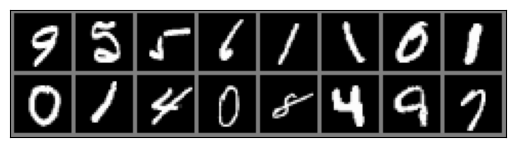

In [ ]:
def display(img):

    img = img / 2 + 0.5 #reverse the normalization
    img = img.permute(1, 2, 0) # axis swapping ( # of channels, height, width)
    npimg = img.numpy()

    #convert the image from tensor format to numpy format
    plt.imshow(npimg)
    plt.xticks([])
    plt.yticks([])
    plt.show()

display(make_grid(images, 8))

## Defining Hyperparameters for Generator and Discriminator Network

In [ ]:
latent_noise_size = 128

# 28 x 28 - flatten all images so that is represented as a single vector
image_size = 784

The generator is designed to map the latent space vector (z) to data-space. Since our data comprises of images, converting z to data-space means ultimately creating a grey scale image with the same size as the training images (i.e. 1x28x28). The output of the generator is fed through a tanh function to return it to the input data range of [-1, 1]

The Generator take in latent noise at the input and it should produce fake data at the output

In [ ]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()

        self.main = nn.Sequential(
            nn.Linear(latent_noise_size, 64),
            nn.ReLU(), # ReLU output 0 or positive numbers

            nn.Linear(64, 128),
            nn.ReLU(),

            nn.Linear(128, 256),
            nn.ReLU(),

            nn.Linear(256, image_size),
            nn.Tanh() # output values in the range [-1, 1]
        )

    def forward(self, x):
        return self.main(x)

Instantiating Generator network and display the network

In [ ]:
generator = Generator()  #Instantiating Generator

print(generator)

Generator(
  (main): Sequential(
    (0): Linear(in_features=128, out_features=64, bias=True)
    (1): ReLU()
    (2): Linear(in_features=64, out_features=128, bias=True)
    (3): ReLU()
    (4): Linear(in_features=128, out_features=256, bias=True)
    (5): ReLU()
    (6): Linear(in_features=256, out_features=784, bias=True)
    (7): Tanh()
  )
)


The discriminator, is a binary classification network that takes an image as input and outputs a scalar probability that the input image is real (as opposed to fake). Here,it takes a 1x28x28 input image, processes it through a series of Linear, and LeakyReLU layers, and outputs the final probability through a Sigmoid activation function.

> ReLU causes neurons to become inactive
For input values greater than or equal to zero, the output is the same as the the input itself.
For input values less than zero, the output is zero.


> LeakyReLU - fixes the ReLU by allowing a small non-zero gradient for negative input values.
Introduces a small non-zero slope for input values less than zero.
This ensures that the gradient is not zero for negative values of input, thus preventing neurons from becoming completely inactive

> Dropout Layer -
During training 20% of the neurons will be dropped off. Dropout layers helps mitigating the overfitting of the discriminator on the training data.

> Sigmoid will output probability scores between the ranges 0 and 1.



In [ ]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()

        self.main = nn.Sequential(
            nn.Linear(image_size, 256), # feed in a flattened image
            nn.LeakyReLU(0.2),
            nn.Dropout(p = 0.2),

            nn.Linear(256, 128),
            nn.LeakyReLU(0.2),
            nn.Dropout(p = 0.2),

            nn.Linear(128, 64),
            nn.LeakyReLU(0.2),
            nn.Dropout(p = 0.2),

            nn.Linear(64, 1), #output of the final layer is 1 - single probability
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.main(x)

In [ ]:
discriminator = Discriminator()

print(discriminator)

Discriminator(
  (main): Sequential(
    (0): Linear(in_features=784, out_features=256, bias=True)
    (1): LeakyReLU(negative_slope=0.2)
    (2): Dropout(p=0.2, inplace=False)
    (3): Linear(in_features=256, out_features=128, bias=True)
    (4): LeakyReLU(negative_slope=0.2)
    (5): Dropout(p=0.2, inplace=False)
    (6): Linear(in_features=128, out_features=64, bias=True)
    (7): LeakyReLU(negative_slope=0.2)
    (8): Dropout(p=0.2, inplace=False)
    (9): Linear(in_features=64, out_features=1, bias=True)
    (10): Sigmoid()
  )
)


Random value inputs (batch size 64) as Input to Generator

In [ ]:
z = torch.randn(32, latent_noise_size)

# Generator network output
sample_generated_output = generator(z)

sample_generated_output

tensor([[ 0.0716,  0.0247, -0.0412,  ..., -0.0902, -0.0769, -0.0007],
        [-0.0115,  0.0347,  0.0027,  ..., -0.1003, -0.0560, -0.0425],
        [ 0.0034,  0.0341, -0.0503,  ..., -0.0928, -0.0144, -0.0401],
        ...,
        [ 0.0097,  0.0550, -0.0285,  ..., -0.0796, -0.0232, -0.0520],
        [ 0.0390,  0.0518, -0.0796,  ..., -0.1295, -0.0097, -0.0232],
        [-0.0227,  0.0390, -0.0278,  ..., -0.0918, -0.0515, -0.0647]],
       grad_fn=<TanhBackward0>)

In [ ]:
sample_generated_output.shape # 32 images that are 784 pixels

torch.Size([32, 784])

Minimum and maximum values of pixel output from Generator are obtained which are well within the range of TanH output range of  -1 to 1

In [ ]:
# Minimum and maximum values of the pixel intensities , due to the tanh() - in range [-1 ,1]
torch.min(sample_generated_output).item(), torch.max(sample_generated_output).item()

(-0.2380378693342209, 0.2475634515285492)

Reshape the output into 64 images of 28 X 28  and plotting an instance, Random noise is generated

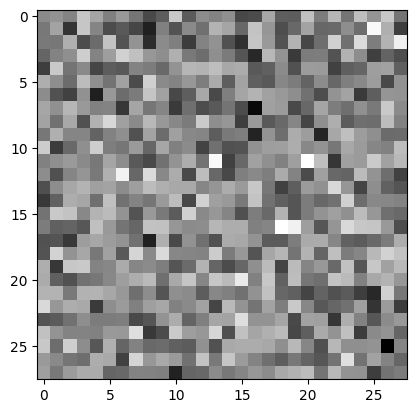

In [ ]:
generated_images = sample_generated_output.reshape(32, 1, 28, 28)

random_image = generated_images[16, 0, :, :] # the image at index 16 and pass this image to be plot

plt.imshow(random_image.detach().numpy(), cmap = 'gray')
#image is noise, this is due to an untrained generator

Display images in a grid layout.Generated images are entirely random since we have not trained the generator network, and its parameters (weights and biases) are completely random at this stage.

In [ ]:
generated_images.shape

torch.Size([32, 1, 28, 28])

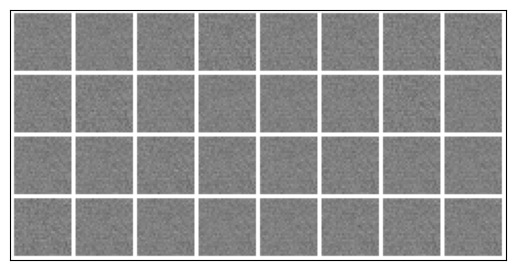

In [ ]:
display(make_grid(generated_images, nrow = 8, pad_value = 1.0))

Let’s feed an batch of  image generated by the untrained generator network into the discriminator: Predictions are random

In [ ]:
discriminator.eval()

with torch.no_grad():
    prediction = discriminator(generated_images.reshape(-1, 784))

print(prediction[:15])
# all the output probablities are the same ~50%, the discriminator cannot distinguish between real and fake


tensor([[0.5006],
        [0.5004],
        [0.5003],
        [0.5006],
        [0.5007],
        [0.5008],
        [0.5006],
        [0.5011],
        [0.5008],
        [0.5005],
        [0.5010],
        [0.5005],
        [0.5004],
        [0.5004],
        [0.5005]])


Let’s feed an batch of real images into the discriminator: Predictions are random

In [ ]:
discriminator.eval()
with torch.no_grad():
    prediction_real = discriminator(images.reshape(-1, 784))

print(prediction_real[:15])

tensor([[0.4944],
        [0.4942],
        [0.4968],
        [0.4894],
        [0.4928],
        [0.4878],
        [0.4890],
        [0.4887],
        [0.5083],
        [0.4963],
        [0.4928],
        [0.4976],
        [0.4951],
        [0.4925],
        [0.5030]])


With D and G setup, we can specify how they learn through the loss functions and optimizers. We will use the Binary Cross Entropy loss (BCELoss) function which is defined in PyTorch as:

In [ ]:
criterion = nn.BCELoss() # measure the distance between 2 probablitity loss functions

During training, the discriminator predicts whether an input image is real or fake. We calculate the loss value and apply back-propagation so that the optimizer can adjust network parameters (weights and biases).

In [ ]:
import torch.optim as optim

optimizer_D = optim.Adam(discriminator.parameters(), lr = 0.0002)
optimizer_G = optim.Adam(generator.parameters(), lr = 0.0002)

print(optimizer_D), print(optimizer_G)

Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    decoupled_weight_decay: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0002
    maximize: False
    weight_decay: 0
)
Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    decoupled_weight_decay: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0002
    maximize: False
    weight_decay: 0
)


(None, None)

In [ ]:
# Labels for real - 1 and fake - 0 data
real_image_labels = torch.full((batch_size,), 1., dtype = torch.float)

fake_image_labels = torch.full((batch_size,), 0., dtype = torch.float)

In [ ]:
# Fixed noise for image generation at the end of every epoch
fixed_noise = torch.randn(batch_size, latent_noise_size)

  0%|          | 0/50 [00:00<?, ?it/s]

-------------------------------------
                Epoch 1:
                Step: 0 |
                D_real Loss: 0.6990 |
                D_fake Loss: 0.6931 |
                D_total Loss: 1.3921 |
                G_Loss: 0.691 |
                Real_score 0.497 |
                Fake_score 0.500
            


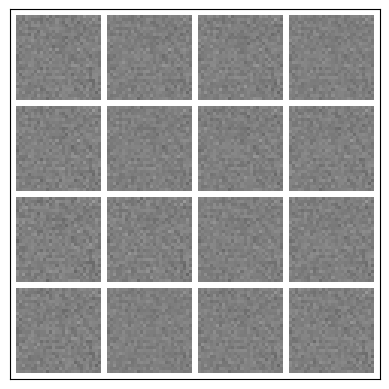

-------------------------------------
                Epoch 1:
                Step: 500 |
                D_real Loss: 0.1826 |
                D_fake Loss: 0.4353 |
                D_total Loss: 0.6180 |
                G_Loss: 2.555 |
                Real_score 0.883 |
                Fake_score 0.270
            


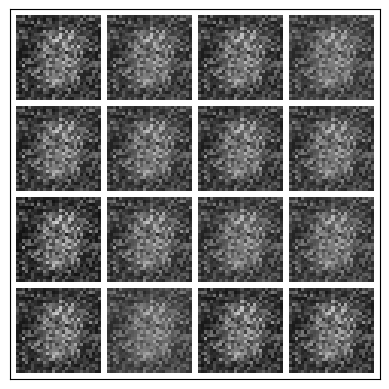

-------------------------------------
                Epoch 1:
                Step: 1000 |
                D_real Loss: 0.4107 |
                D_fake Loss: 0.2783 |
                D_total Loss: 0.6890 |
                G_Loss: 2.170 |
                Real_score 0.721 |
                Fake_score 0.227
            


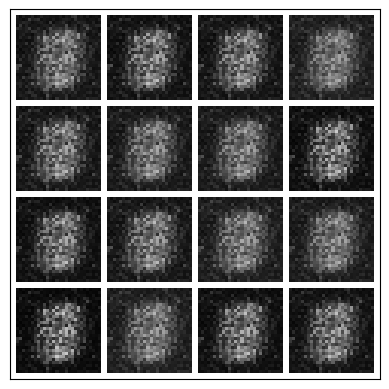

-------------------------------------
                Epoch 1:
                Step: 1500 |
                D_real Loss: 0.2356 |
                D_fake Loss: 0.0987 |
                D_total Loss: 0.3343 |
                G_Loss: 2.544 |
                Real_score 0.851 |
                Fake_score 0.090
            


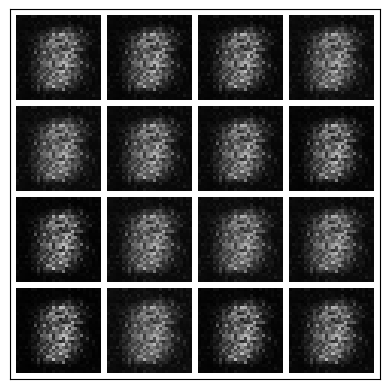

-------------------------------------
                Epoch 1:
                Step: 2000 |
                D_real Loss: 0.0208 |
                D_fake Loss: 0.0522 |
                D_total Loss: 0.0730 |
                G_Loss: 4.104 |
                Real_score 0.981 |
                Fake_score 0.049
            


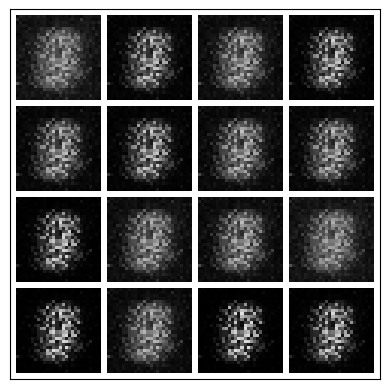

-------------------------------------
                Epoch 1:
                Step: 2500 |
                D_real Loss: 1.0125 |
                D_fake Loss: 0.0148 |
                D_total Loss: 1.0274 |
                G_Loss: 4.138 |
                Real_score 0.692 |
                Fake_score 0.014
            


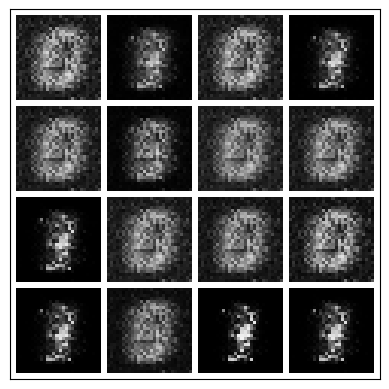

-------------------------------------
                Epoch 1:
                Step: 3000 |
                D_real Loss: 0.0101 |
                D_fake Loss: 0.1829 |
                D_total Loss: 0.1929 |
                G_Loss: 5.137 |
                Real_score 0.991 |
                Fake_score 0.149
            


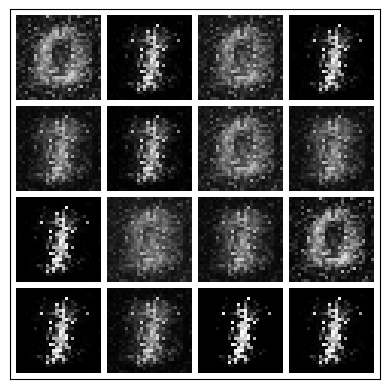

-------------------------------------
                Epoch 1:
                Step: 3500 |
                D_real Loss: 0.0454 |
                D_fake Loss: 0.0774 |
                D_total Loss: 0.1228 |
                G_Loss: 3.409 |
                Real_score 0.961 |
                Fake_score 0.072
            


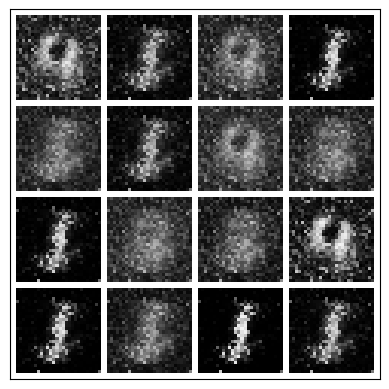

  2%|▏         | 1/50 [00:58<48:08, 58.94s/it]

-------------------------------------
                Epoch 2:
                Step: 0 |
                D_real Loss: 0.0169 |
                D_fake Loss: 0.4165 |
                D_total Loss: 0.4334 |
                G_Loss: 1.626 |
                Real_score 0.984 |
                Fake_score 0.295
            


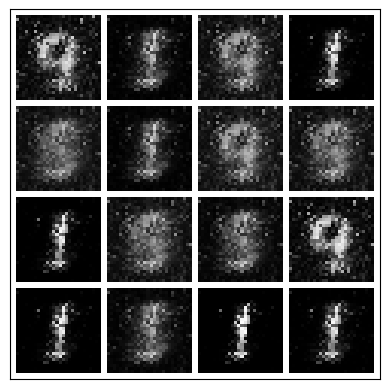

-------------------------------------
                Epoch 2:
                Step: 500 |
                D_real Loss: 0.7782 |
                D_fake Loss: 0.0083 |
                D_total Loss: 0.7865 |
                G_Loss: 5.217 |
                Real_score 0.666 |
                Fake_score 0.008
            


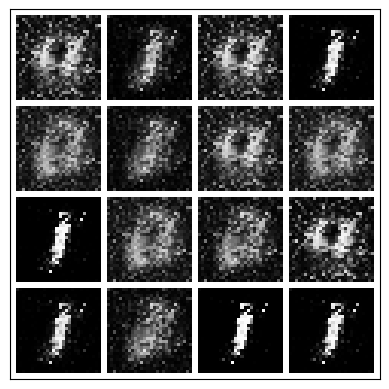

-------------------------------------
                Epoch 2:
                Step: 1000 |
                D_real Loss: 0.5742 |
                D_fake Loss: 0.0113 |
                D_total Loss: 0.5856 |
                G_Loss: 6.681 |
                Real_score 0.859 |
                Fake_score 0.011
            


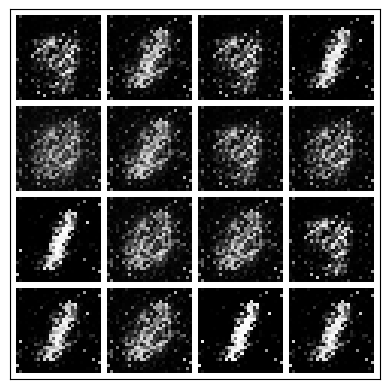

-------------------------------------
                Epoch 2:
                Step: 1500 |
                D_real Loss: 0.0494 |
                D_fake Loss: 0.1115 |
                D_total Loss: 0.1609 |
                G_Loss: 3.961 |
                Real_score 0.955 |
                Fake_score 0.095
            


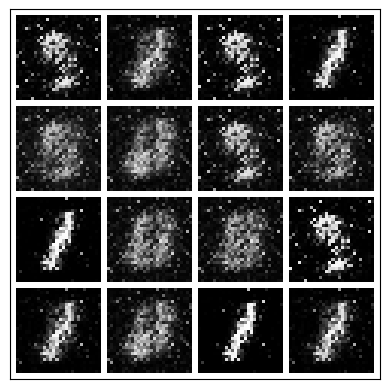

-------------------------------------
                Epoch 2:
                Step: 2000 |
                D_real Loss: 0.0137 |
                D_fake Loss: 0.0731 |
                D_total Loss: 0.0868 |
                G_Loss: 4.702 |
                Real_score 0.987 |
                Fake_score 0.051
            


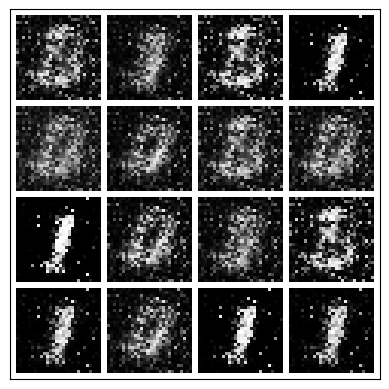

-------------------------------------
                Epoch 2:
                Step: 2500 |
                D_real Loss: 0.0076 |
                D_fake Loss: 0.0223 |
                D_total Loss: 0.0298 |
                G_Loss: 5.645 |
                Real_score 0.993 |
                Fake_score 0.022
            


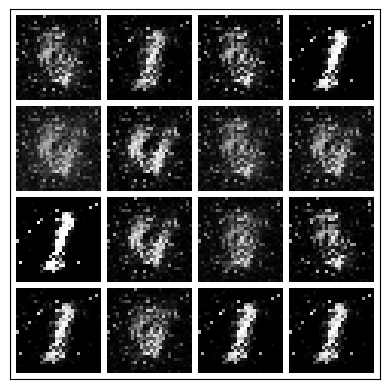

-------------------------------------
                Epoch 2:
                Step: 3000 |
                D_real Loss: 0.0816 |
                D_fake Loss: 0.0603 |
                D_total Loss: 0.1420 |
                G_Loss: 3.176 |
                Real_score 0.940 |
                Fake_score 0.058
            


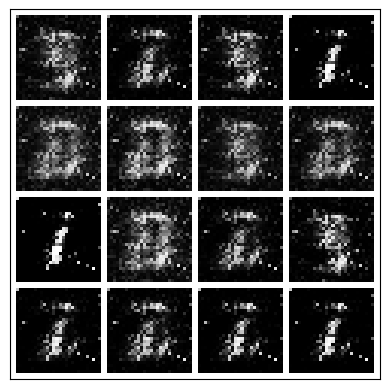

-------------------------------------
                Epoch 2:
                Step: 3500 |
                D_real Loss: 0.0146 |
                D_fake Loss: 0.0111 |
                D_total Loss: 0.0257 |
                G_Loss: 5.086 |
                Real_score 0.986 |
                Fake_score 0.011
            


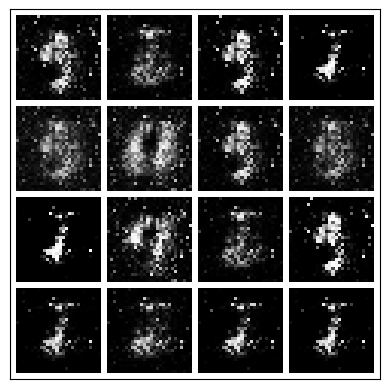

  4%|▍         | 2/50 [01:59<48:02, 60.06s/it]

-------------------------------------
                Epoch 3:
                Step: 0 |
                D_real Loss: 0.2785 |
                D_fake Loss: 0.0194 |
                D_total Loss: 0.2978 |
                G_Loss: 5.268 |
                Real_score 0.934 |
                Fake_score 0.019
            


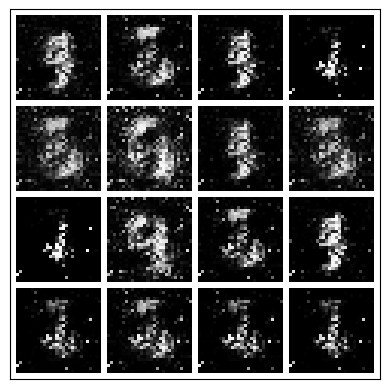

-------------------------------------
                Epoch 3:
                Step: 500 |
                D_real Loss: 0.2095 |
                D_fake Loss: 0.0504 |
                D_total Loss: 0.2599 |
                G_Loss: 4.373 |
                Real_score 0.901 |
                Fake_score 0.047
            


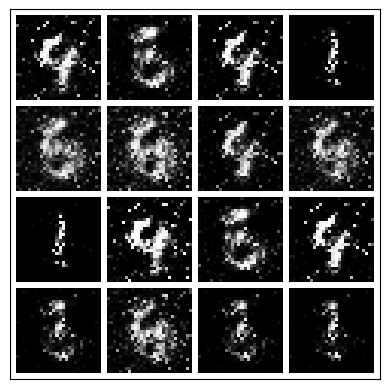

-------------------------------------
                Epoch 3:
                Step: 1000 |
                D_real Loss: 0.5571 |
                D_fake Loss: 0.0292 |
                D_total Loss: 0.5863 |
                G_Loss: 3.388 |
                Real_score 0.815 |
                Fake_score 0.028
            


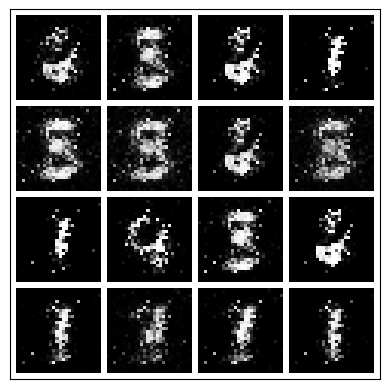

-------------------------------------
                Epoch 3:
                Step: 1500 |
                D_real Loss: 0.1066 |
                D_fake Loss: 0.3385 |
                D_total Loss: 0.4452 |
                G_Loss: 2.408 |
                Real_score 0.945 |
                Fake_score 0.215
            


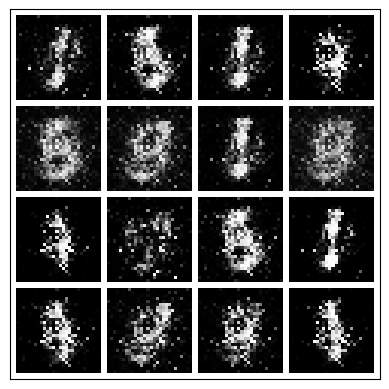

-------------------------------------
                Epoch 3:
                Step: 2000 |
                D_real Loss: 0.0080 |
                D_fake Loss: 0.1902 |
                D_total Loss: 0.1982 |
                G_Loss: 2.708 |
                Real_score 0.992 |
                Fake_score 0.142
            


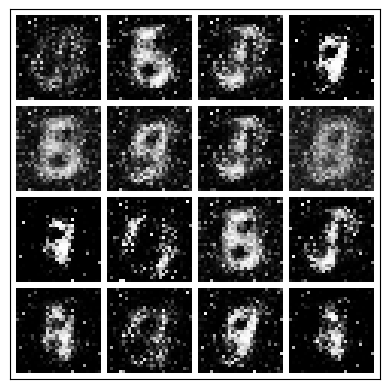

-------------------------------------
                Epoch 3:
                Step: 2500 |
                D_real Loss: 0.0384 |
                D_fake Loss: 0.1940 |
                D_total Loss: 0.2324 |
                G_Loss: 4.333 |
                Real_score 0.969 |
                Fake_score 0.074
            


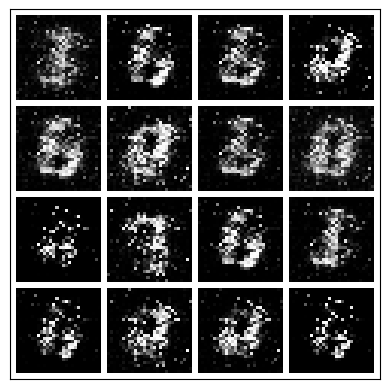

-------------------------------------
                Epoch 3:
                Step: 3000 |
                D_real Loss: 0.0093 |
                D_fake Loss: 0.1940 |
                D_total Loss: 0.2033 |
                G_Loss: 4.258 |
                Real_score 0.991 |
                Fake_score 0.150
            


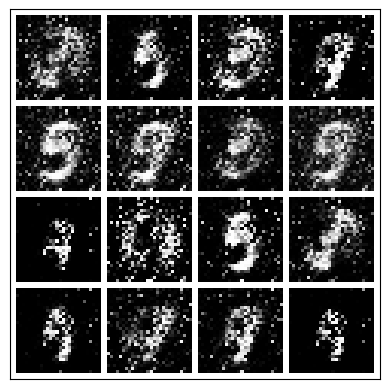

-------------------------------------
                Epoch 3:
                Step: 3500 |
                D_real Loss: 0.1037 |
                D_fake Loss: 0.0864 |
                D_total Loss: 0.1901 |
                G_Loss: 3.441 |
                Real_score 0.917 |
                Fake_score 0.078
            


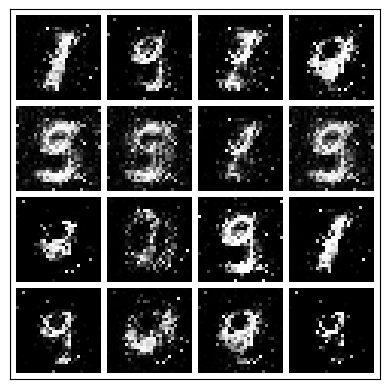

  6%|▌         | 3/50 [03:08<50:16, 64.18s/it]

-------------------------------------
                Epoch 4:
                Step: 0 |
                D_real Loss: 0.1129 |
                D_fake Loss: 0.2725 |
                D_total Loss: 0.3854 |
                G_Loss: 2.286 |
                Real_score 0.918 |
                Fake_score 0.160
            


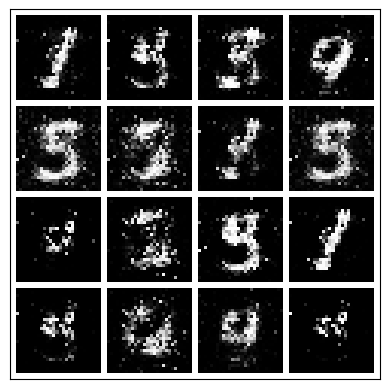

-------------------------------------
                Epoch 4:
                Step: 500 |
                D_real Loss: 0.2203 |
                D_fake Loss: 0.1762 |
                D_total Loss: 0.3965 |
                G_Loss: 3.845 |
                Real_score 0.895 |
                Fake_score 0.117
            


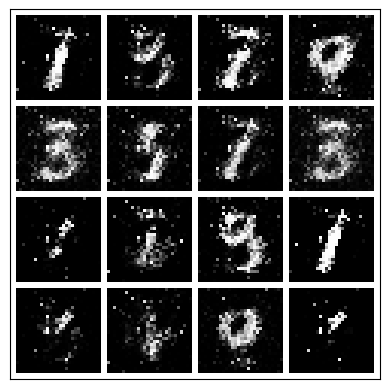

-------------------------------------
                Epoch 4:
                Step: 1000 |
                D_real Loss: 0.3466 |
                D_fake Loss: 0.3473 |
                D_total Loss: 0.6939 |
                G_Loss: 2.383 |
                Real_score 0.809 |
                Fake_score 0.200
            


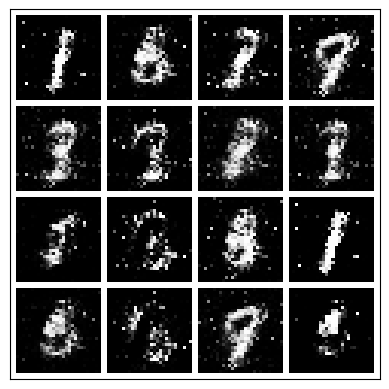

-------------------------------------
                Epoch 4:
                Step: 1500 |
                D_real Loss: 0.0649 |
                D_fake Loss: 0.4875 |
                D_total Loss: 0.5524 |
                G_Loss: 2.434 |
                Real_score 0.944 |
                Fake_score 0.311
            


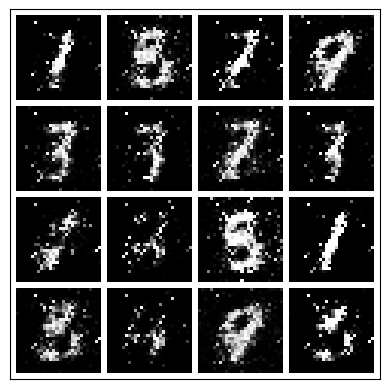

-------------------------------------
                Epoch 4:
                Step: 2000 |
                D_real Loss: 0.5926 |
                D_fake Loss: 0.1729 |
                D_total Loss: 0.7655 |
                G_Loss: 3.006 |
                Real_score 0.768 |
                Fake_score 0.141
            


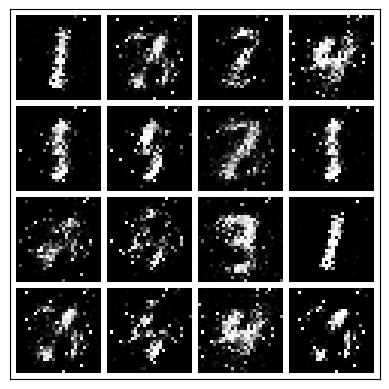

-------------------------------------
                Epoch 4:
                Step: 2500 |
                D_real Loss: 0.5058 |
                D_fake Loss: 0.4923 |
                D_total Loss: 0.9981 |
                G_Loss: 2.597 |
                Real_score 0.823 |
                Fake_score 0.298
            


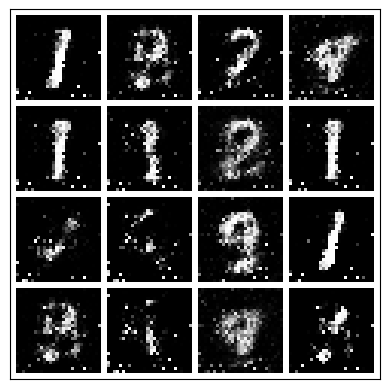

-------------------------------------
                Epoch 4:
                Step: 3000 |
                D_real Loss: 1.0075 |
                D_fake Loss: 0.0696 |
                D_total Loss: 1.0771 |
                G_Loss: 2.809 |
                Real_score 0.599 |
                Fake_score 0.065
            


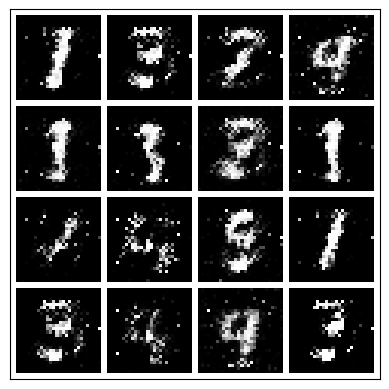

-------------------------------------
                Epoch 4:
                Step: 3500 |
                D_real Loss: 0.0450 |
                D_fake Loss: 0.1728 |
                D_total Loss: 0.2178 |
                G_Loss: 2.605 |
                Real_score 0.958 |
                Fake_score 0.138
            


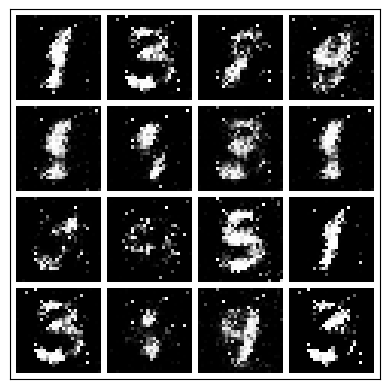

  8%|▊         | 4/50 [04:12<48:55, 63.81s/it]

-------------------------------------
                Epoch 5:
                Step: 0 |
                D_real Loss: 0.0356 |
                D_fake Loss: 0.3260 |
                D_total Loss: 0.3616 |
                G_Loss: 2.942 |
                Real_score 0.967 |
                Fake_score 0.251
            


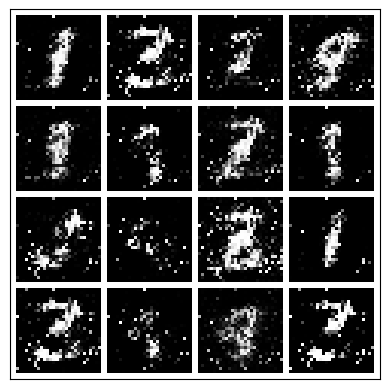

-------------------------------------
                Epoch 5:
                Step: 500 |
                D_real Loss: 0.0334 |
                D_fake Loss: 0.3428 |
                D_total Loss: 0.3762 |
                G_Loss: 2.146 |
                Real_score 0.968 |
                Fake_score 0.238
            


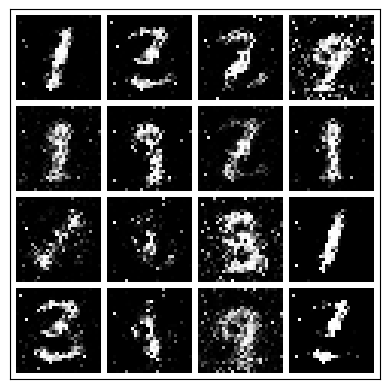

-------------------------------------
                Epoch 5:
                Step: 1000 |
                D_real Loss: 0.2536 |
                D_fake Loss: 0.1065 |
                D_total Loss: 0.3601 |
                G_Loss: 2.750 |
                Real_score 0.864 |
                Fake_score 0.099
            


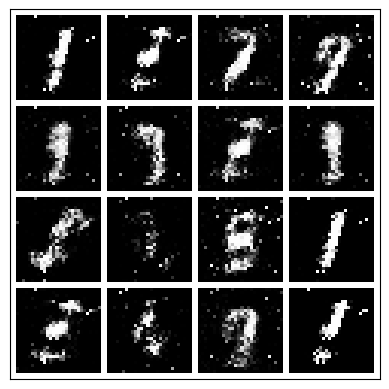

-------------------------------------
                Epoch 5:
                Step: 1500 |
                D_real Loss: 0.3706 |
                D_fake Loss: 0.3865 |
                D_total Loss: 0.7571 |
                G_Loss: 2.131 |
                Real_score 0.806 |
                Fake_score 0.250
            


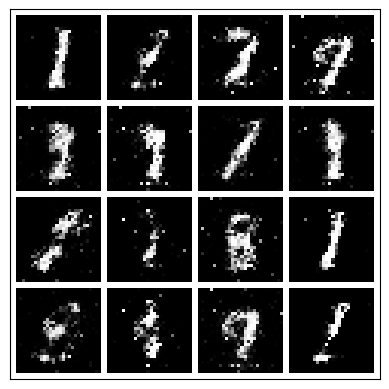

-------------------------------------
                Epoch 5:
                Step: 2000 |
                D_real Loss: 0.1713 |
                D_fake Loss: 0.6645 |
                D_total Loss: 0.8359 |
                G_Loss: 1.838 |
                Real_score 0.884 |
                Fake_score 0.407
            


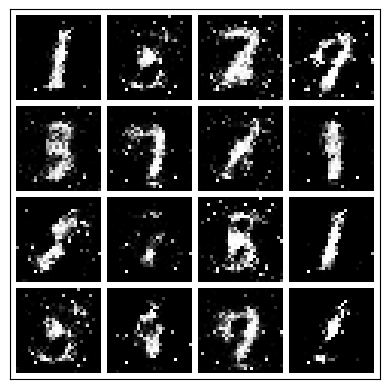

-------------------------------------
                Epoch 5:
                Step: 2500 |
                D_real Loss: 0.2163 |
                D_fake Loss: 0.5164 |
                D_total Loss: 0.7327 |
                G_Loss: 1.802 |
                Real_score 0.864 |
                Fake_score 0.237
            


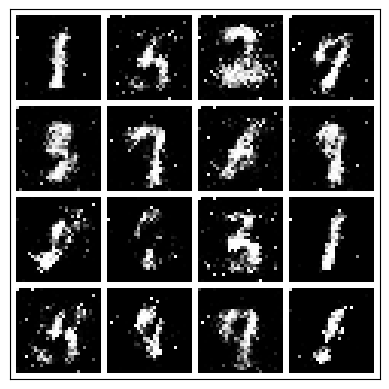

-------------------------------------
                Epoch 5:
                Step: 3000 |
                D_real Loss: 0.2272 |
                D_fake Loss: 0.2174 |
                D_total Loss: 0.4446 |
                G_Loss: 2.376 |
                Real_score 0.837 |
                Fake_score 0.174
            


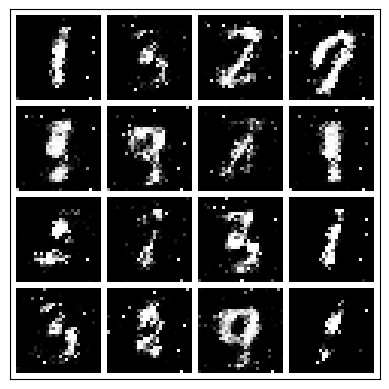

-------------------------------------
                Epoch 5:
                Step: 3500 |
                D_real Loss: 0.7945 |
                D_fake Loss: 0.1280 |
                D_total Loss: 0.9225 |
                G_Loss: 1.772 |
                Real_score 0.662 |
                Fake_score 0.118
            


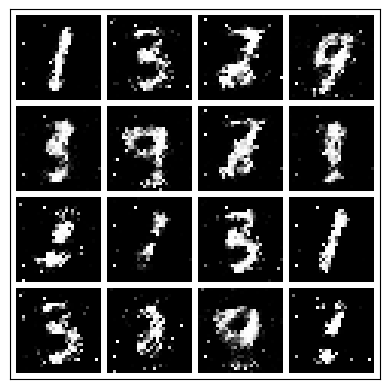

 10%|█         | 5/50 [05:20<49:11, 65.60s/it]

-------------------------------------
                Epoch 6:
                Step: 0 |
                D_real Loss: 0.6007 |
                D_fake Loss: 0.3168 |
                D_total Loss: 0.9175 |
                G_Loss: 2.298 |
                Real_score 0.697 |
                Fake_score 0.216
            


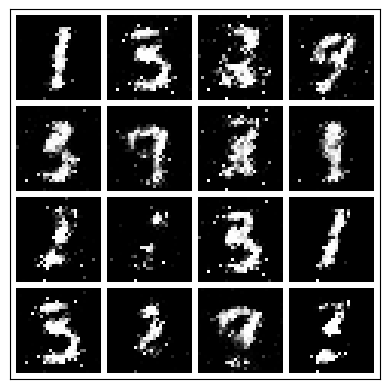

-------------------------------------
                Epoch 6:
                Step: 500 |
                D_real Loss: 0.2308 |
                D_fake Loss: 0.3765 |
                D_total Loss: 0.6073 |
                G_Loss: 1.873 |
                Real_score 0.875 |
                Fake_score 0.257
            


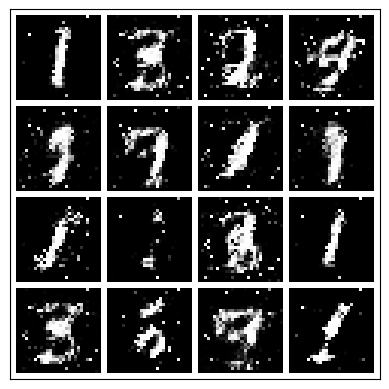

-------------------------------------
                Epoch 6:
                Step: 1000 |
                D_real Loss: 0.2951 |
                D_fake Loss: 0.2173 |
                D_total Loss: 0.5124 |
                G_Loss: 1.860 |
                Real_score 0.786 |
                Fake_score 0.182
            


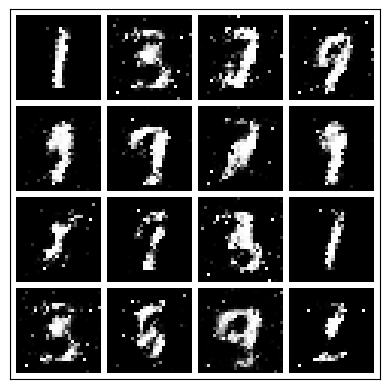

-------------------------------------
                Epoch 6:
                Step: 1500 |
                D_real Loss: 0.8716 |
                D_fake Loss: 0.2022 |
                D_total Loss: 1.0738 |
                G_Loss: 2.545 |
                Real_score 0.622 |
                Fake_score 0.163
            


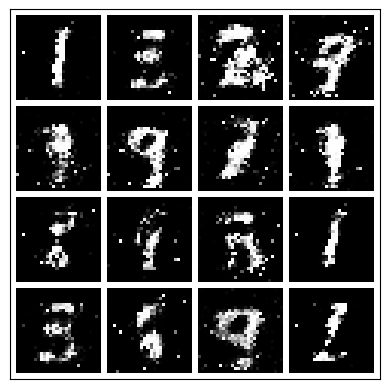

-------------------------------------
                Epoch 6:
                Step: 2000 |
                D_real Loss: 0.1315 |
                D_fake Loss: 0.3727 |
                D_total Loss: 0.5042 |
                G_Loss: 1.925 |
                Real_score 0.894 |
                Fake_score 0.275
            


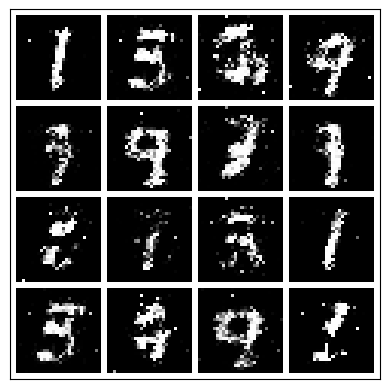

-------------------------------------
                Epoch 6:
                Step: 2500 |
                D_real Loss: 0.4341 |
                D_fake Loss: 0.3910 |
                D_total Loss: 0.8250 |
                G_Loss: 2.036 |
                Real_score 0.762 |
                Fake_score 0.222
            


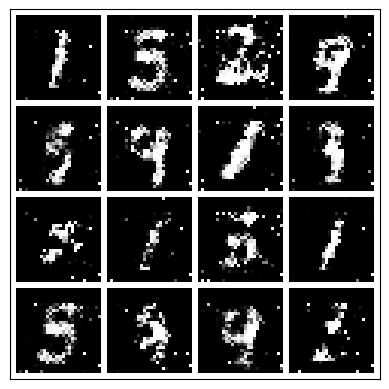

-------------------------------------
                Epoch 6:
                Step: 3000 |
                D_real Loss: 0.2212 |
                D_fake Loss: 0.4112 |
                D_total Loss: 0.6324 |
                G_Loss: 1.927 |
                Real_score 0.854 |
                Fake_score 0.273
            


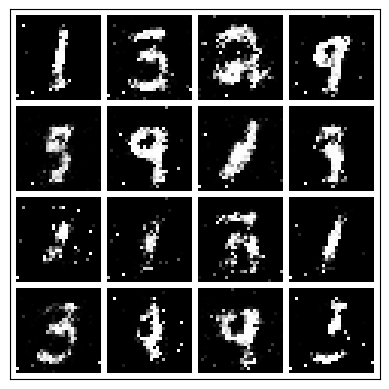

-------------------------------------
                Epoch 6:
                Step: 3500 |
                D_real Loss: 0.4347 |
                D_fake Loss: 0.2444 |
                D_total Loss: 0.6790 |
                G_Loss: 2.601 |
                Real_score 0.752 |
                Fake_score 0.182
            


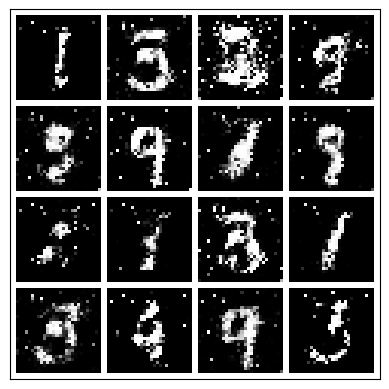

 12%|█▏        | 6/50 [06:30<49:07, 66.99s/it]

-------------------------------------
                Epoch 7:
                Step: 0 |
                D_real Loss: 0.3061 |
                D_fake Loss: 0.2006 |
                D_total Loss: 0.5067 |
                G_Loss: 1.912 |
                Real_score 0.812 |
                Fake_score 0.173
            


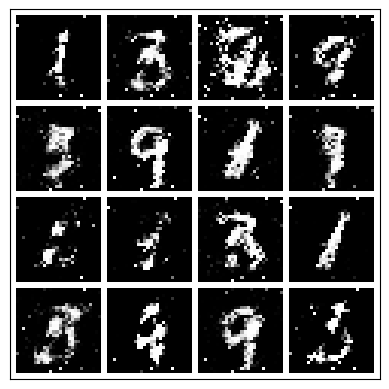

-------------------------------------
                Epoch 7:
                Step: 500 |
                D_real Loss: 0.3134 |
                D_fake Loss: 0.3135 |
                D_total Loss: 0.6269 |
                G_Loss: 2.198 |
                Real_score 0.811 |
                Fake_score 0.237
            


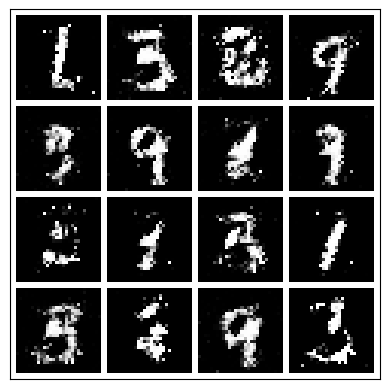

-------------------------------------
                Epoch 7:
                Step: 1000 |
                D_real Loss: 0.1244 |
                D_fake Loss: 0.2718 |
                D_total Loss: 0.3962 |
                G_Loss: 1.776 |
                Real_score 0.903 |
                Fake_score 0.185
            


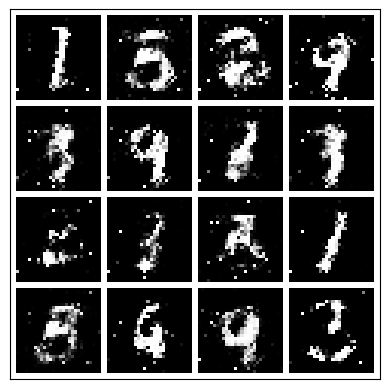

-------------------------------------
                Epoch 7:
                Step: 1500 |
                D_real Loss: 0.6009 |
                D_fake Loss: 0.1447 |
                D_total Loss: 0.7456 |
                G_Loss: 2.425 |
                Real_score 0.679 |
                Fake_score 0.130
            


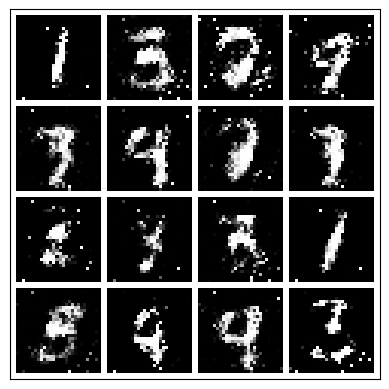

-------------------------------------
                Epoch 7:
                Step: 2000 |
                D_real Loss: 0.5772 |
                D_fake Loss: 0.4511 |
                D_total Loss: 1.0282 |
                G_Loss: 1.616 |
                Real_score 0.707 |
                Fake_score 0.316
            


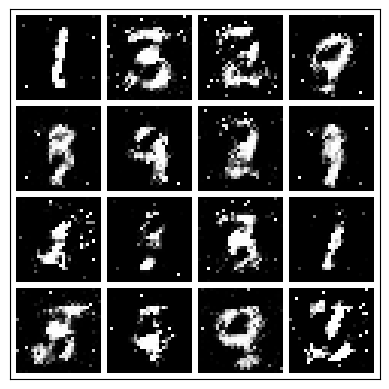

-------------------------------------
                Epoch 7:
                Step: 2500 |
                D_real Loss: 0.0808 |
                D_fake Loss: 0.1513 |
                D_total Loss: 0.2321 |
                G_Loss: 2.462 |
                Real_score 0.928 |
                Fake_score 0.120
            


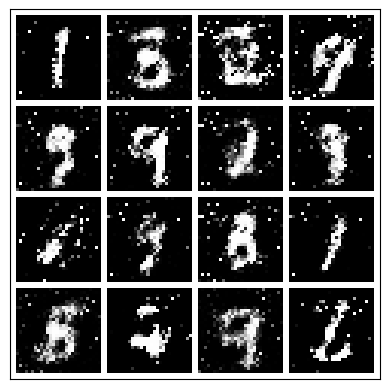

-------------------------------------
                Epoch 7:
                Step: 3000 |
                D_real Loss: 0.6916 |
                D_fake Loss: 0.2322 |
                D_total Loss: 0.9239 |
                G_Loss: 1.476 |
                Real_score 0.607 |
                Fake_score 0.200
            


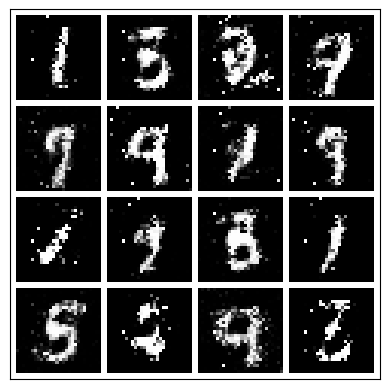

-------------------------------------
                Epoch 7:
                Step: 3500 |
                D_real Loss: 0.2511 |
                D_fake Loss: 0.3822 |
                D_total Loss: 0.6333 |
                G_Loss: 1.617 |
                Real_score 0.834 |
                Fake_score 0.301
            


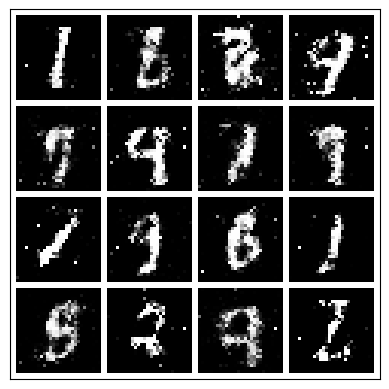

 14%|█▍        | 7/50 [07:42<49:09, 68.60s/it]

-------------------------------------
                Epoch 8:
                Step: 0 |
                D_real Loss: 0.3105 |
                D_fake Loss: 0.3541 |
                D_total Loss: 0.6647 |
                G_Loss: 1.567 |
                Real_score 0.807 |
                Fake_score 0.246
            


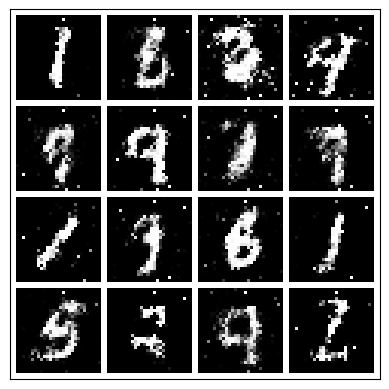

-------------------------------------
                Epoch 8:
                Step: 500 |
                D_real Loss: 0.6441 |
                D_fake Loss: 0.1475 |
                D_total Loss: 0.7916 |
                G_Loss: 2.005 |
                Real_score 0.672 |
                Fake_score 0.135
            


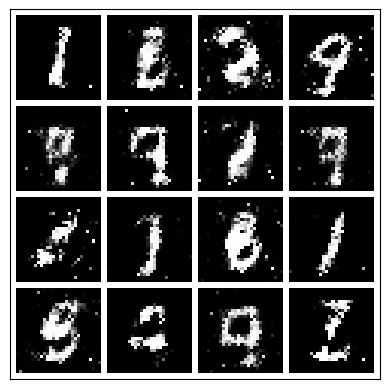

-------------------------------------
                Epoch 8:
                Step: 1000 |
                D_real Loss: 0.1827 |
                D_fake Loss: 0.1723 |
                D_total Loss: 0.3551 |
                G_Loss: 2.009 |
                Real_score 0.851 |
                Fake_score 0.151
            


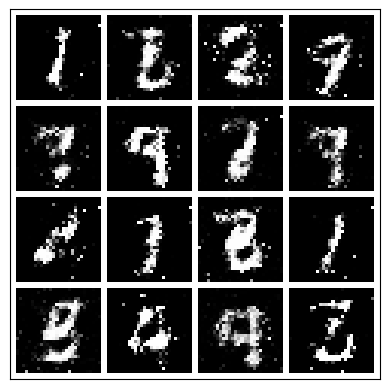

-------------------------------------
                Epoch 8:
                Step: 1500 |
                D_real Loss: 0.4871 |
                D_fake Loss: 0.2392 |
                D_total Loss: 0.7263 |
                G_Loss: 1.572 |
                Real_score 0.693 |
                Fake_score 0.187
            


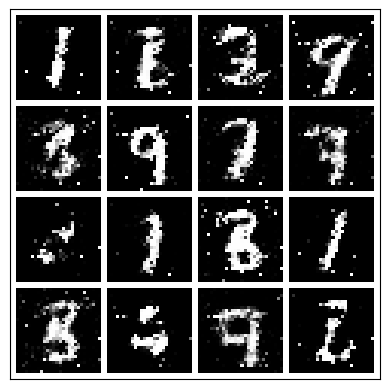

-------------------------------------
                Epoch 8:
                Step: 2000 |
                D_real Loss: 0.4733 |
                D_fake Loss: 0.4216 |
                D_total Loss: 0.8949 |
                G_Loss: 2.018 |
                Real_score 0.688 |
                Fake_score 0.212
            


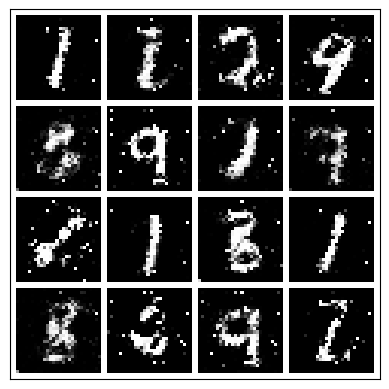

-------------------------------------
                Epoch 8:
                Step: 2500 |
                D_real Loss: 0.6188 |
                D_fake Loss: 0.7252 |
                D_total Loss: 1.3440 |
                G_Loss: 1.350 |
                Real_score 0.650 |
                Fake_score 0.465
            


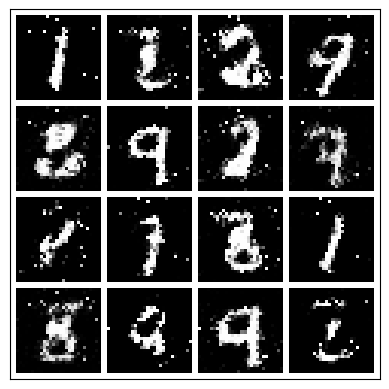

-------------------------------------
                Epoch 8:
                Step: 3000 |
                D_real Loss: 0.3034 |
                D_fake Loss: 0.3227 |
                D_total Loss: 0.6260 |
                G_Loss: 1.725 |
                Real_score 0.813 |
                Fake_score 0.261
            


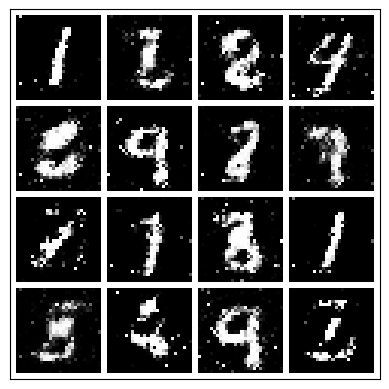

-------------------------------------
                Epoch 8:
                Step: 3500 |
                D_real Loss: 0.1813 |
                D_fake Loss: 0.3460 |
                D_total Loss: 0.5273 |
                G_Loss: 2.023 |
                Real_score 0.873 |
                Fake_score 0.274
            


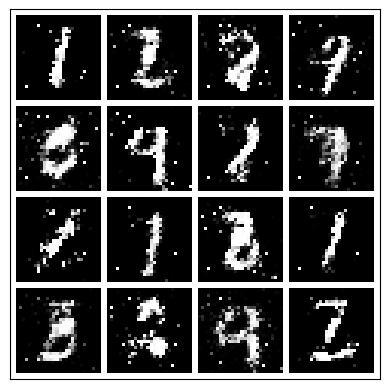

 16%|█▌        | 8/50 [08:49<47:40, 68.11s/it]

-------------------------------------
                Epoch 9:
                Step: 0 |
                D_real Loss: 0.4203 |
                D_fake Loss: 0.4506 |
                D_total Loss: 0.8709 |
                G_Loss: 1.496 |
                Real_score 0.719 |
                Fake_score 0.318
            


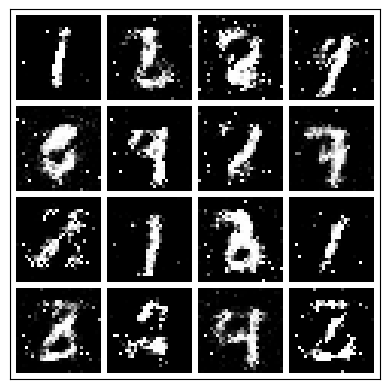

-------------------------------------
                Epoch 9:
                Step: 500 |
                D_real Loss: 0.2881 |
                D_fake Loss: 0.5220 |
                D_total Loss: 0.8101 |
                G_Loss: 2.173 |
                Real_score 0.817 |
                Fake_score 0.342
            


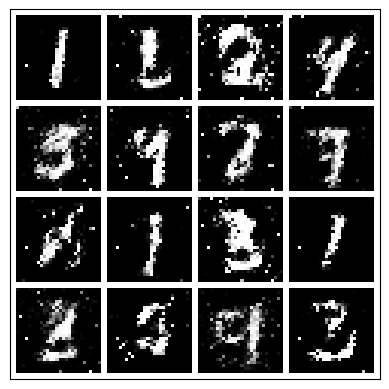

-------------------------------------
                Epoch 9:
                Step: 1000 |
                D_real Loss: 0.2638 |
                D_fake Loss: 0.5405 |
                D_total Loss: 0.8042 |
                G_Loss: 1.435 |
                Real_score 0.830 |
                Fake_score 0.348
            


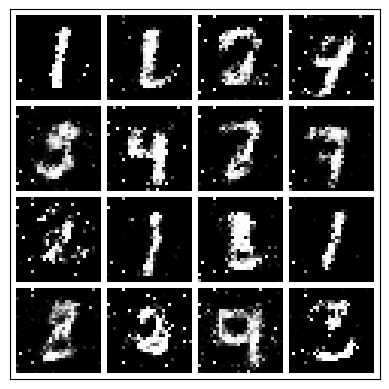

-------------------------------------
                Epoch 9:
                Step: 1500 |
                D_real Loss: 0.2700 |
                D_fake Loss: 0.5056 |
                D_total Loss: 0.7756 |
                G_Loss: 1.628 |
                Real_score 0.807 |
                Fake_score 0.292
            


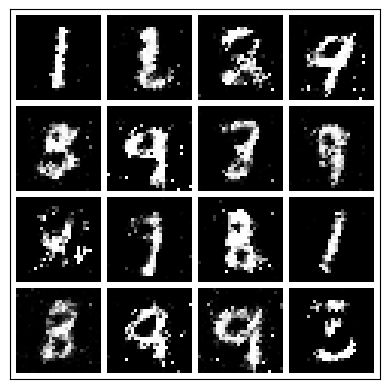

-------------------------------------
                Epoch 9:
                Step: 2000 |
                D_real Loss: 0.5650 |
                D_fake Loss: 0.4570 |
                D_total Loss: 1.0220 |
                G_Loss: 1.763 |
                Real_score 0.649 |
                Fake_score 0.330
            


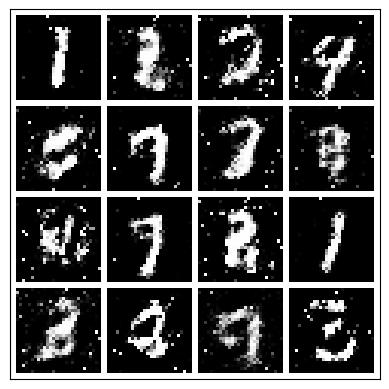

-------------------------------------
                Epoch 9:
                Step: 2500 |
                D_real Loss: 0.1657 |
                D_fake Loss: 0.4584 |
                D_total Loss: 0.6241 |
                G_Loss: 1.074 |
                Real_score 0.891 |
                Fake_score 0.348
            


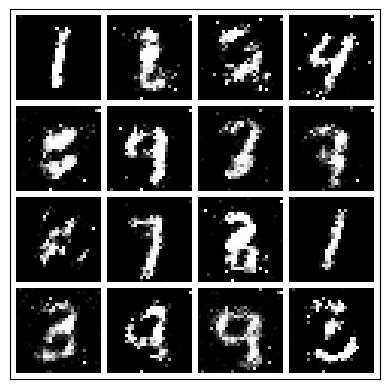

-------------------------------------
                Epoch 9:
                Step: 3000 |
                D_real Loss: 0.2547 |
                D_fake Loss: 0.1835 |
                D_total Loss: 0.4382 |
                G_Loss: 2.087 |
                Real_score 0.815 |
                Fake_score 0.162
            


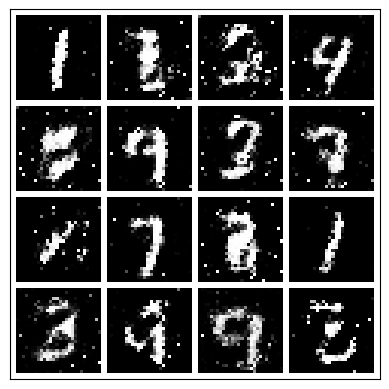

-------------------------------------
                Epoch 9:
                Step: 3500 |
                D_real Loss: 0.3647 |
                D_fake Loss: 0.6921 |
                D_total Loss: 1.0567 |
                G_Loss: 1.558 |
                Real_score 0.781 |
                Fake_score 0.266
            


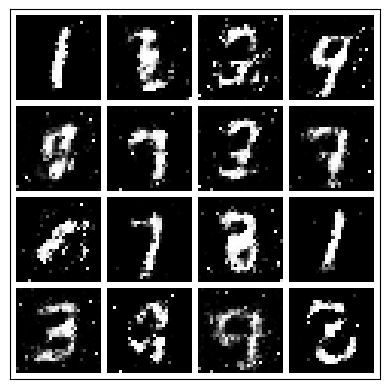

 18%|█▊        | 9/50 [10:00<47:08, 68.98s/it]

-------------------------------------
                Epoch 10:
                Step: 0 |
                D_real Loss: 0.5220 |
                D_fake Loss: 0.4346 |
                D_total Loss: 0.9566 |
                G_Loss: 1.397 |
                Real_score 0.682 |
                Fake_score 0.298
            


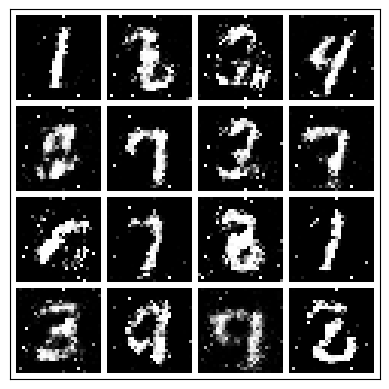

-------------------------------------
                Epoch 10:
                Step: 500 |
                D_real Loss: 0.2758 |
                D_fake Loss: 0.5410 |
                D_total Loss: 0.8168 |
                G_Loss: 1.900 |
                Real_score 0.804 |
                Fake_score 0.326
            


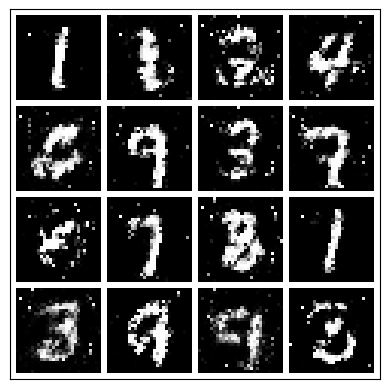

-------------------------------------
                Epoch 10:
                Step: 1000 |
                D_real Loss: 0.3673 |
                D_fake Loss: 0.2292 |
                D_total Loss: 0.5964 |
                G_Loss: 1.778 |
                Real_score 0.758 |
                Fake_score 0.187
            


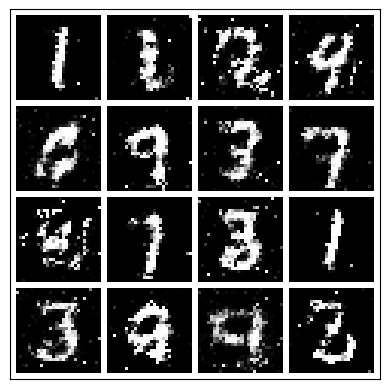

-------------------------------------
                Epoch 10:
                Step: 1500 |
                D_real Loss: 0.3595 |
                D_fake Loss: 0.5387 |
                D_total Loss: 0.8982 |
                G_Loss: 1.784 |
                Real_score 0.761 |
                Fake_score 0.321
            


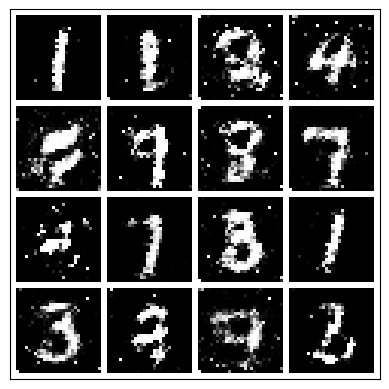

-------------------------------------
                Epoch 10:
                Step: 2000 |
                D_real Loss: 0.1618 |
                D_fake Loss: 0.6955 |
                D_total Loss: 0.8573 |
                G_Loss: 1.543 |
                Real_score 0.880 |
                Fake_score 0.409
            


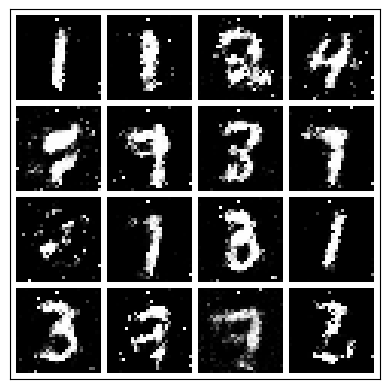

-------------------------------------
                Epoch 10:
                Step: 2500 |
                D_real Loss: 0.3198 |
                D_fake Loss: 0.3051 |
                D_total Loss: 0.6249 |
                G_Loss: 1.553 |
                Real_score 0.808 |
                Fake_score 0.246
            


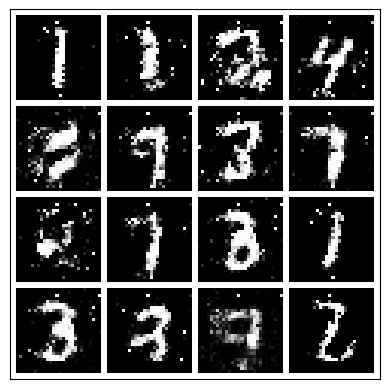

-------------------------------------
                Epoch 10:
                Step: 3000 |
                D_real Loss: 0.4463 |
                D_fake Loss: 0.2196 |
                D_total Loss: 0.6658 |
                G_Loss: 2.121 |
                Real_score 0.706 |
                Fake_score 0.191
            


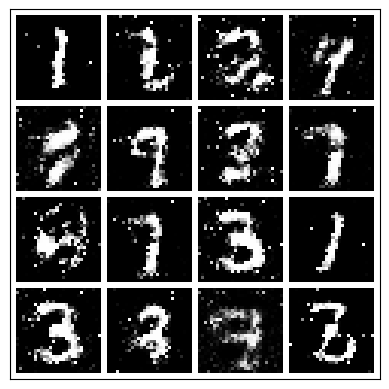

-------------------------------------
                Epoch 10:
                Step: 3500 |
                D_real Loss: 0.3422 |
                D_fake Loss: 0.1981 |
                D_total Loss: 0.5404 |
                G_Loss: 1.643 |
                Real_score 0.770 |
                Fake_score 0.167
            


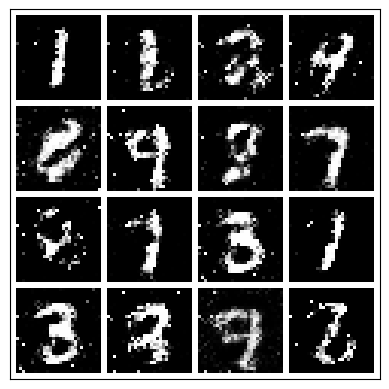

 20%|██        | 10/50 [11:06<45:21, 68.03s/it]

-------------------------------------
                Epoch 11:
                Step: 0 |
                D_real Loss: 0.3718 |
                D_fake Loss: 0.5206 |
                D_total Loss: 0.8924 |
                G_Loss: 1.512 |
                Real_score 0.758 |
                Fake_score 0.313
            


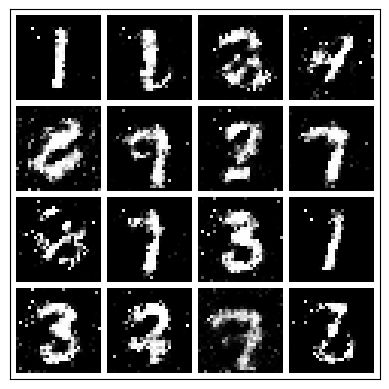

-------------------------------------
                Epoch 11:
                Step: 500 |
                D_real Loss: 0.1842 |
                D_fake Loss: 0.2847 |
                D_total Loss: 0.4689 |
                G_Loss: 2.178 |
                Real_score 0.882 |
                Fake_score 0.226
            


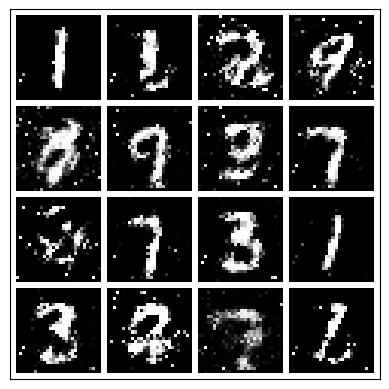

-------------------------------------
                Epoch 11:
                Step: 1000 |
                D_real Loss: 0.5012 |
                D_fake Loss: 0.2850 |
                D_total Loss: 0.7862 |
                G_Loss: 2.241 |
                Real_score 0.725 |
                Fake_score 0.223
            


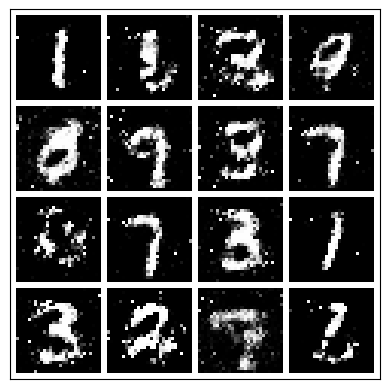

-------------------------------------
                Epoch 11:
                Step: 1500 |
                D_real Loss: 0.3825 |
                D_fake Loss: 0.8485 |
                D_total Loss: 1.2311 |
                G_Loss: 1.335 |
                Real_score 0.773 |
                Fake_score 0.455
            


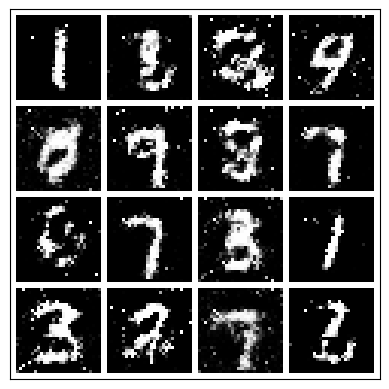

-------------------------------------
                Epoch 11:
                Step: 2000 |
                D_real Loss: 0.1114 |
                D_fake Loss: 0.8009 |
                D_total Loss: 0.9122 |
                G_Loss: 1.037 |
                Real_score 0.917 |
                Fake_score 0.464
            


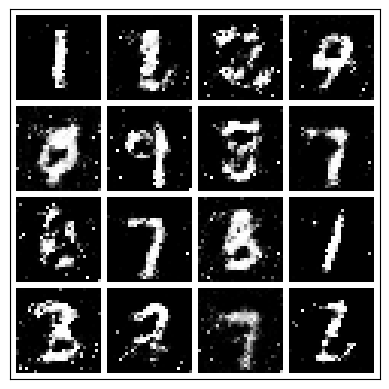

-------------------------------------
                Epoch 11:
                Step: 2500 |
                D_real Loss: 0.7032 |
                D_fake Loss: 0.2424 |
                D_total Loss: 0.9456 |
                G_Loss: 1.921 |
                Real_score 0.587 |
                Fake_score 0.209
            


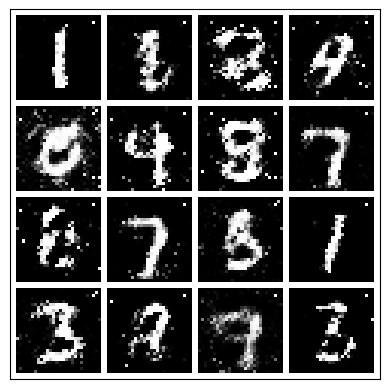

-------------------------------------
                Epoch 11:
                Step: 3000 |
                D_real Loss: 0.1612 |
                D_fake Loss: 0.2327 |
                D_total Loss: 0.3939 |
                G_Loss: 1.819 |
                Real_score 0.884 |
                Fake_score 0.199
            


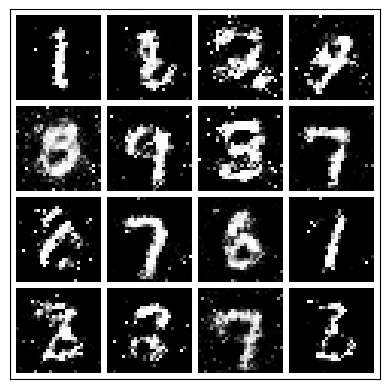

-------------------------------------
                Epoch 11:
                Step: 3500 |
                D_real Loss: 0.6433 |
                D_fake Loss: 0.4083 |
                D_total Loss: 1.0516 |
                G_Loss: 1.397 |
                Real_score 0.625 |
                Fake_score 0.279
            


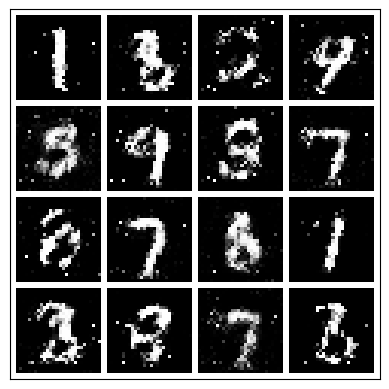

 22%|██▏       | 11/50 [12:13<43:59, 67.68s/it]

-------------------------------------
                Epoch 12:
                Step: 0 |
                D_real Loss: 0.6284 |
                D_fake Loss: 0.1947 |
                D_total Loss: 0.8231 |
                G_Loss: 2.075 |
                Real_score 0.646 |
                Fake_score 0.165
            


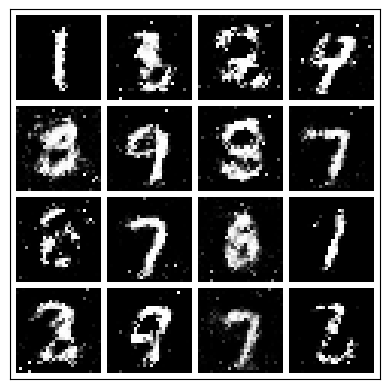

-------------------------------------
                Epoch 12:
                Step: 500 |
                D_real Loss: 0.2945 |
                D_fake Loss: 0.2564 |
                D_total Loss: 0.5509 |
                G_Loss: 2.120 |
                Real_score 0.786 |
                Fake_score 0.217
            


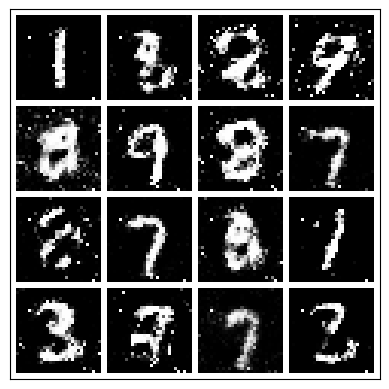

-------------------------------------
                Epoch 12:
                Step: 1000 |
                D_real Loss: 0.5413 |
                D_fake Loss: 0.2547 |
                D_total Loss: 0.7960 |
                G_Loss: 1.713 |
                Real_score 0.652 |
                Fake_score 0.217
            


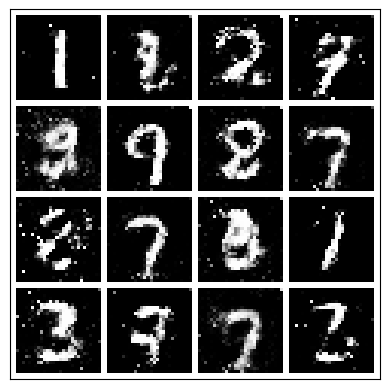

-------------------------------------
                Epoch 12:
                Step: 1500 |
                D_real Loss: 0.3217 |
                D_fake Loss: 0.6141 |
                D_total Loss: 0.9358 |
                G_Loss: 1.231 |
                Real_score 0.785 |
                Fake_score 0.345
            


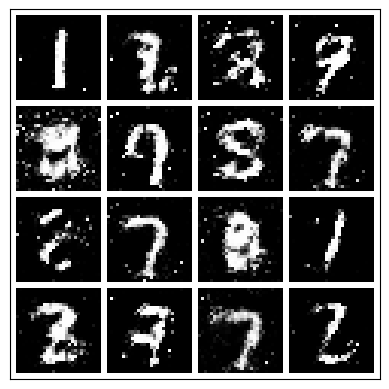

-------------------------------------
                Epoch 12:
                Step: 2000 |
                D_real Loss: 0.2831 |
                D_fake Loss: 0.5436 |
                D_total Loss: 0.8267 |
                G_Loss: 1.242 |
                Real_score 0.777 |
                Fake_score 0.333
            


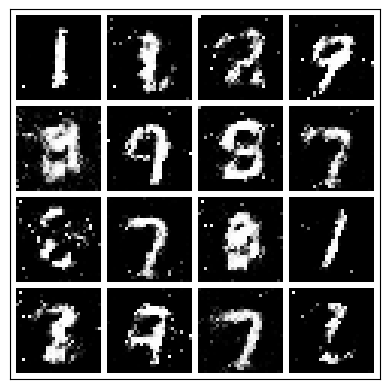

-------------------------------------
                Epoch 12:
                Step: 2500 |
                D_real Loss: 0.6232 |
                D_fake Loss: 0.8440 |
                D_total Loss: 1.4672 |
                G_Loss: 1.164 |
                Real_score 0.638 |
                Fake_score 0.430
            


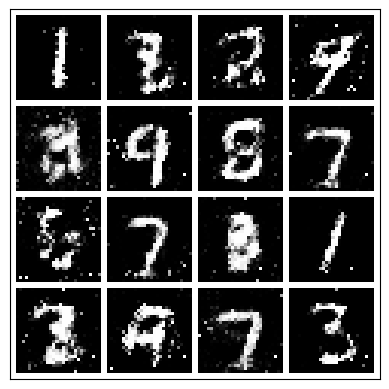

-------------------------------------
                Epoch 12:
                Step: 3000 |
                D_real Loss: 0.5674 |
                D_fake Loss: 0.7994 |
                D_total Loss: 1.3667 |
                G_Loss: 1.152 |
                Real_score 0.639 |
                Fake_score 0.435
            


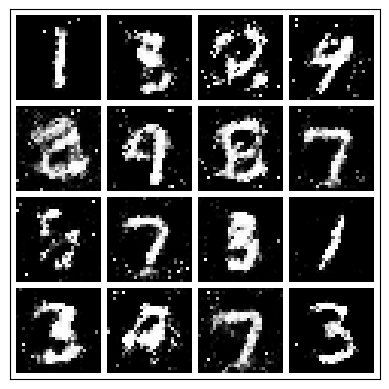

-------------------------------------
                Epoch 12:
                Step: 3500 |
                D_real Loss: 0.6468 |
                D_fake Loss: 0.3172 |
                D_total Loss: 0.9640 |
                G_Loss: 1.596 |
                Real_score 0.628 |
                Fake_score 0.235
            


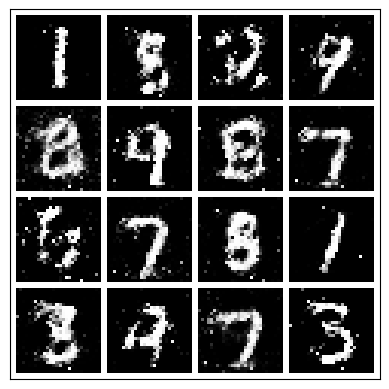

 24%|██▍       | 12/50 [13:20<42:43, 67.46s/it]

-------------------------------------
                Epoch 13:
                Step: 0 |
                D_real Loss: 0.9273 |
                D_fake Loss: 0.3707 |
                D_total Loss: 1.2981 |
                G_Loss: 1.240 |
                Real_score 0.528 |
                Fake_score 0.290
            


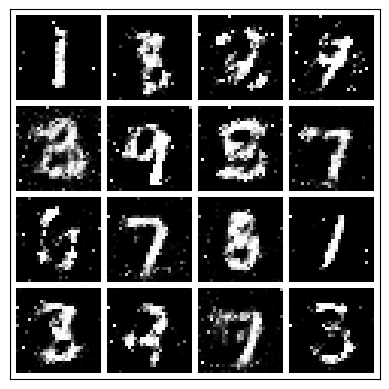

-------------------------------------
                Epoch 13:
                Step: 500 |
                D_real Loss: 0.2268 |
                D_fake Loss: 0.3193 |
                D_total Loss: 0.5461 |
                G_Loss: 1.976 |
                Real_score 0.828 |
                Fake_score 0.241
            


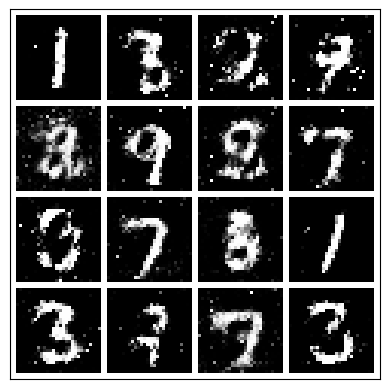

-------------------------------------
                Epoch 13:
                Step: 1000 |
                D_real Loss: 0.8703 |
                D_fake Loss: 0.4247 |
                D_total Loss: 1.2950 |
                G_Loss: 1.363 |
                Real_score 0.518 |
                Fake_score 0.308
            


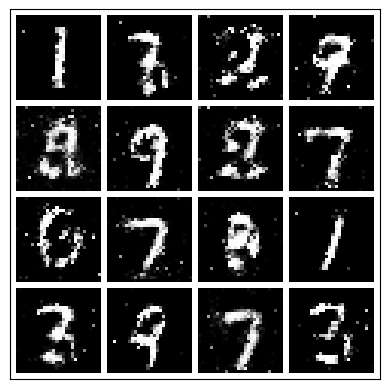

-------------------------------------
                Epoch 13:
                Step: 1500 |
                D_real Loss: 0.3866 |
                D_fake Loss: 0.2303 |
                D_total Loss: 0.6168 |
                G_Loss: 2.041 |
                Real_score 0.751 |
                Fake_score 0.189
            


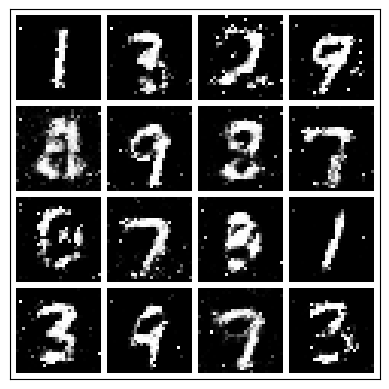

-------------------------------------
                Epoch 13:
                Step: 2000 |
                D_real Loss: 0.5445 |
                D_fake Loss: 0.7391 |
                D_total Loss: 1.2836 |
                G_Loss: 1.208 |
                Real_score 0.698 |
                Fake_score 0.476
            


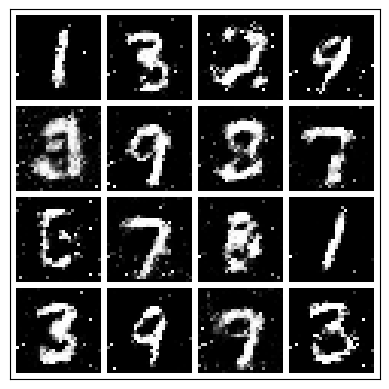

-------------------------------------
                Epoch 13:
                Step: 2500 |
                D_real Loss: 0.5211 |
                D_fake Loss: 0.4211 |
                D_total Loss: 0.9422 |
                G_Loss: 1.113 |
                Real_score 0.709 |
                Fake_score 0.311
            


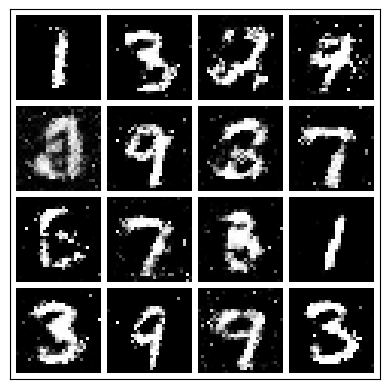

-------------------------------------
                Epoch 13:
                Step: 3000 |
                D_real Loss: 0.5899 |
                D_fake Loss: 0.4354 |
                D_total Loss: 1.0254 |
                G_Loss: 1.520 |
                Real_score 0.653 |
                Fake_score 0.325
            


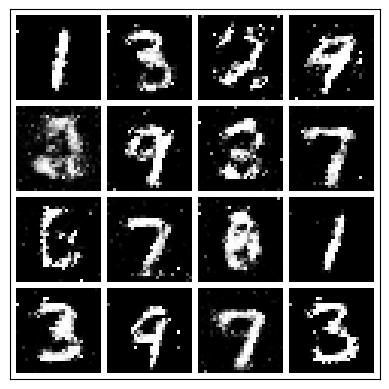

-------------------------------------
                Epoch 13:
                Step: 3500 |
                D_real Loss: 0.6268 |
                D_fake Loss: 0.2756 |
                D_total Loss: 0.9024 |
                G_Loss: 1.906 |
                Real_score 0.635 |
                Fake_score 0.226
            


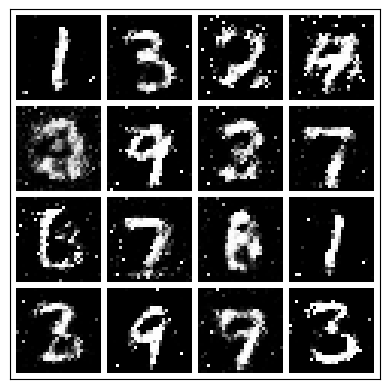

 26%|██▌       | 13/50 [14:27<41:30, 67.32s/it]

-------------------------------------
                Epoch 14:
                Step: 0 |
                D_real Loss: 0.7176 |
                D_fake Loss: 0.5219 |
                D_total Loss: 1.2395 |
                G_Loss: 1.384 |
                Real_score 0.574 |
                Fake_score 0.325
            


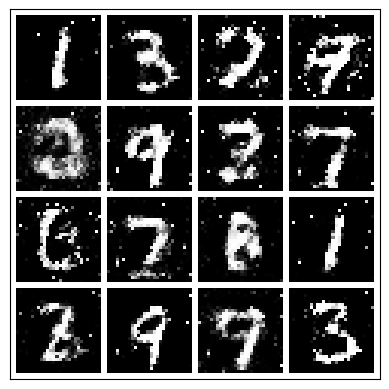

-------------------------------------
                Epoch 14:
                Step: 500 |
                D_real Loss: 0.4466 |
                D_fake Loss: 0.4275 |
                D_total Loss: 0.8742 |
                G_Loss: 1.187 |
                Real_score 0.741 |
                Fake_score 0.328
            


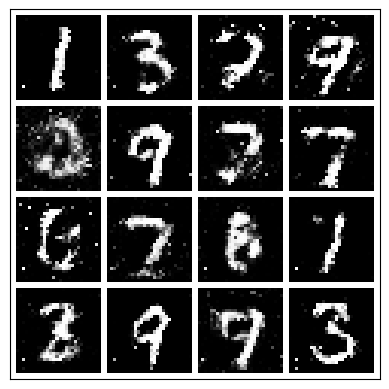

-------------------------------------
                Epoch 14:
                Step: 1000 |
                D_real Loss: 0.5347 |
                D_fake Loss: 0.6147 |
                D_total Loss: 1.1494 |
                G_Loss: 1.339 |
                Real_score 0.632 |
                Fake_score 0.347
            


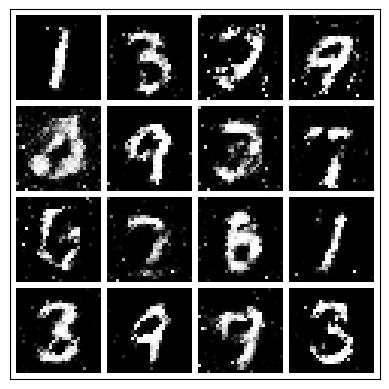

-------------------------------------
                Epoch 14:
                Step: 1500 |
                D_real Loss: 0.3909 |
                D_fake Loss: 0.4661 |
                D_total Loss: 0.8570 |
                G_Loss: 1.652 |
                Real_score 0.731 |
                Fake_score 0.312
            


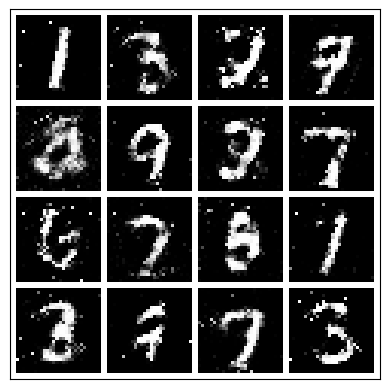

-------------------------------------
                Epoch 14:
                Step: 2000 |
                D_real Loss: 0.3696 |
                D_fake Loss: 0.3143 |
                D_total Loss: 0.6839 |
                G_Loss: 1.470 |
                Real_score 0.737 |
                Fake_score 0.261
            


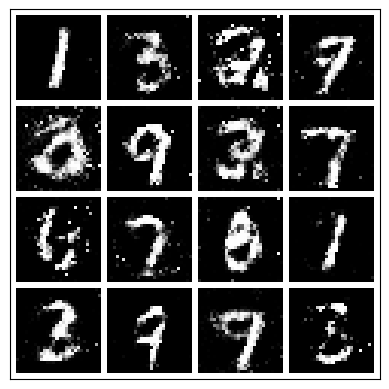

-------------------------------------
                Epoch 14:
                Step: 2500 |
                D_real Loss: 0.5035 |
                D_fake Loss: 0.5547 |
                D_total Loss: 1.0582 |
                G_Loss: 1.510 |
                Real_score 0.695 |
                Fake_score 0.362
            


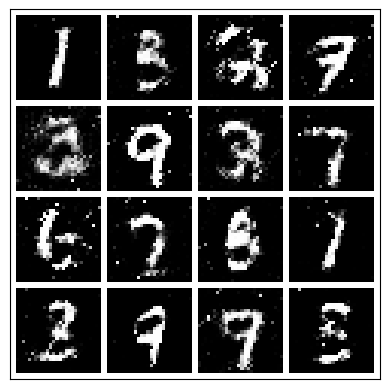

-------------------------------------
                Epoch 14:
                Step: 3000 |
                D_real Loss: 0.6948 |
                D_fake Loss: 0.5281 |
                D_total Loss: 1.2229 |
                G_Loss: 1.369 |
                Real_score 0.617 |
                Fake_score 0.319
            


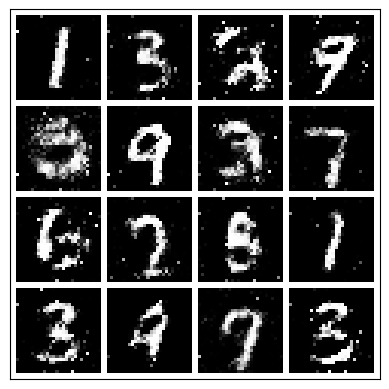

-------------------------------------
                Epoch 14:
                Step: 3500 |
                D_real Loss: 0.6464 |
                D_fake Loss: 0.2806 |
                D_total Loss: 0.9270 |
                G_Loss: 1.707 |
                Real_score 0.626 |
                Fake_score 0.238
            


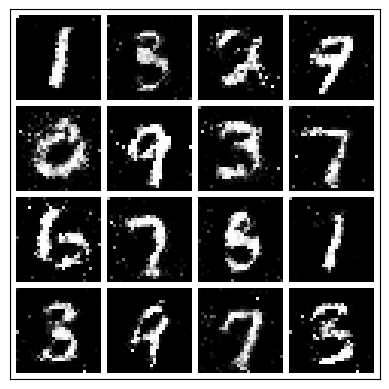

 28%|██▊       | 14/50 [15:34<40:28, 67.47s/it]

-------------------------------------
                Epoch 15:
                Step: 0 |
                D_real Loss: 0.4854 |
                D_fake Loss: 0.5611 |
                D_total Loss: 1.0465 |
                G_Loss: 1.396 |
                Real_score 0.686 |
                Fake_score 0.355
            


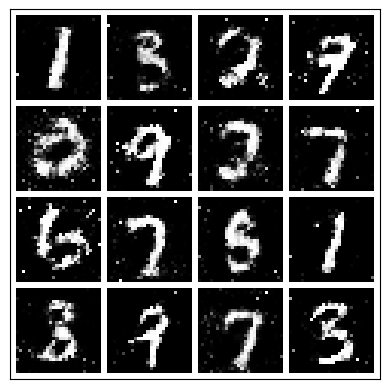

-------------------------------------
                Epoch 15:
                Step: 500 |
                D_real Loss: 0.7169 |
                D_fake Loss: 0.4761 |
                D_total Loss: 1.1930 |
                G_Loss: 1.821 |
                Real_score 0.642 |
                Fake_score 0.272
            


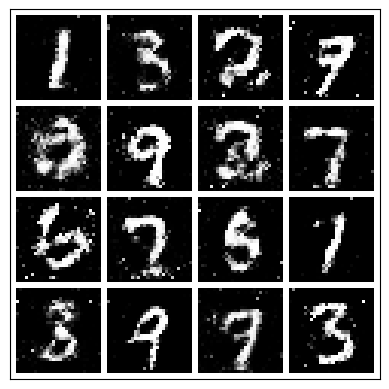

-------------------------------------
                Epoch 15:
                Step: 1000 |
                D_real Loss: 0.3910 |
                D_fake Loss: 0.3568 |
                D_total Loss: 0.7478 |
                G_Loss: 1.176 |
                Real_score 0.744 |
                Fake_score 0.276
            


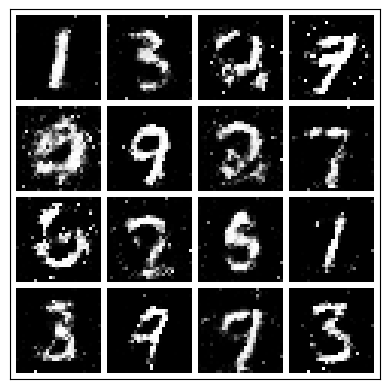

-------------------------------------
                Epoch 15:
                Step: 1500 |
                D_real Loss: 0.6520 |
                D_fake Loss: 0.2299 |
                D_total Loss: 0.8818 |
                G_Loss: 1.711 |
                Real_score 0.619 |
                Fake_score 0.197
            


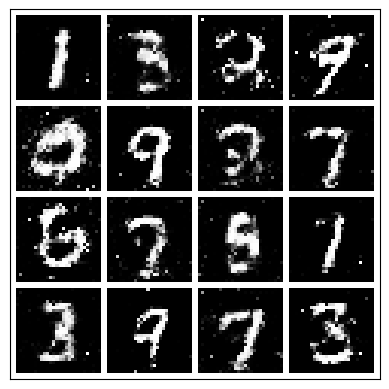

-------------------------------------
                Epoch 15:
                Step: 2000 |
                D_real Loss: 0.3016 |
                D_fake Loss: 0.4683 |
                D_total Loss: 0.7699 |
                G_Loss: 1.274 |
                Real_score 0.768 |
                Fake_score 0.350
            


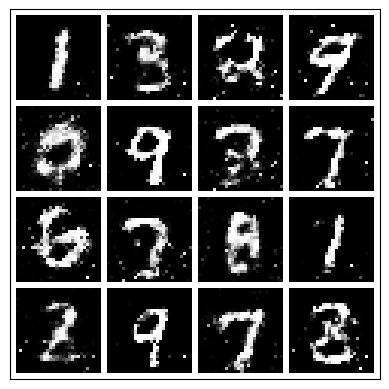

-------------------------------------
                Epoch 15:
                Step: 2500 |
                D_real Loss: 0.2291 |
                D_fake Loss: 0.5077 |
                D_total Loss: 0.7368 |
                G_Loss: 1.269 |
                Real_score 0.820 |
                Fake_score 0.375
            


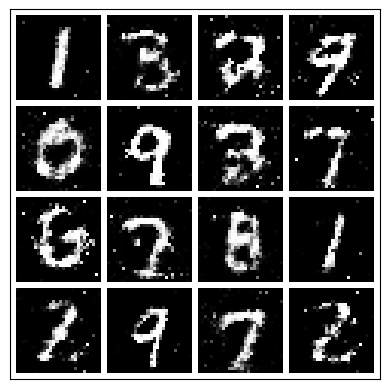

-------------------------------------
                Epoch 15:
                Step: 3000 |
                D_real Loss: 0.5577 |
                D_fake Loss: 0.5745 |
                D_total Loss: 1.1323 |
                G_Loss: 1.431 |
                Real_score 0.673 |
                Fake_score 0.336
            


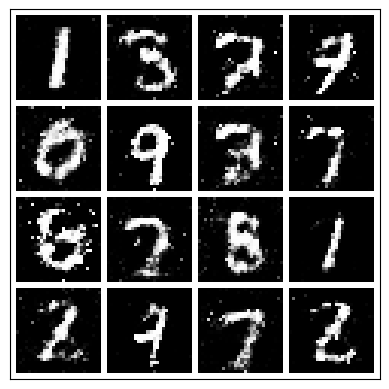

-------------------------------------
                Epoch 15:
                Step: 3500 |
                D_real Loss: 0.5702 |
                D_fake Loss: 0.4698 |
                D_total Loss: 1.0399 |
                G_Loss: 1.543 |
                Real_score 0.666 |
                Fake_score 0.317
            


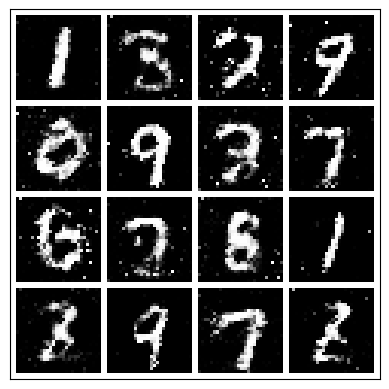

 30%|███       | 15/50 [16:42<39:25, 67.58s/it]

-------------------------------------
                Epoch 16:
                Step: 0 |
                D_real Loss: 0.2976 |
                D_fake Loss: 0.3033 |
                D_total Loss: 0.6010 |
                G_Loss: 1.448 |
                Real_score 0.779 |
                Fake_score 0.249
            


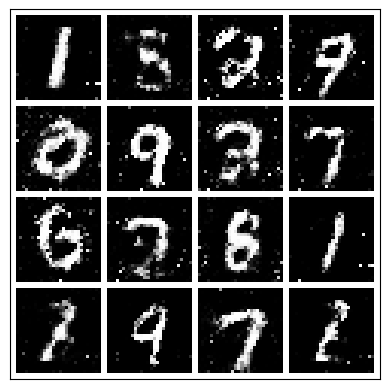

-------------------------------------
                Epoch 16:
                Step: 500 |
                D_real Loss: 0.2661 |
                D_fake Loss: 0.4389 |
                D_total Loss: 0.7050 |
                G_Loss: 1.546 |
                Real_score 0.790 |
                Fake_score 0.300
            


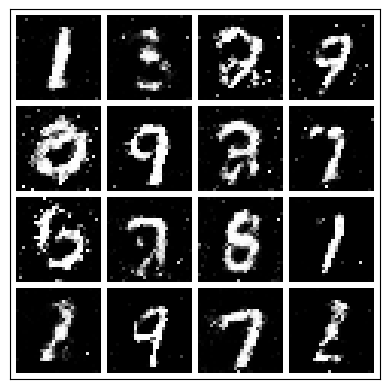

-------------------------------------
                Epoch 16:
                Step: 1000 |
                D_real Loss: 0.4052 |
                D_fake Loss: 0.3904 |
                D_total Loss: 0.7956 |
                G_Loss: 1.148 |
                Real_score 0.711 |
                Fake_score 0.300
            


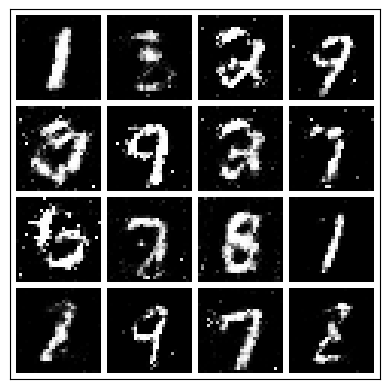

-------------------------------------
                Epoch 16:
                Step: 1500 |
                D_real Loss: 0.4258 |
                D_fake Loss: 0.8151 |
                D_total Loss: 1.2408 |
                G_Loss: 1.298 |
                Real_score 0.690 |
                Fake_score 0.480
            


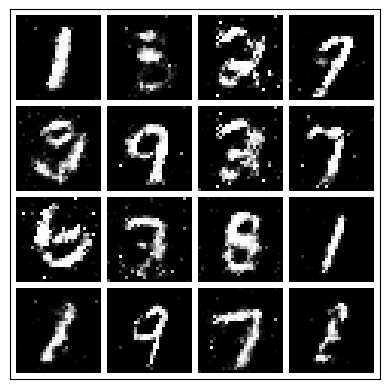

-------------------------------------
                Epoch 16:
                Step: 2000 |
                D_real Loss: 0.8638 |
                D_fake Loss: 0.6264 |
                D_total Loss: 1.4902 |
                G_Loss: 1.607 |
                Real_score 0.535 |
                Fake_score 0.340
            


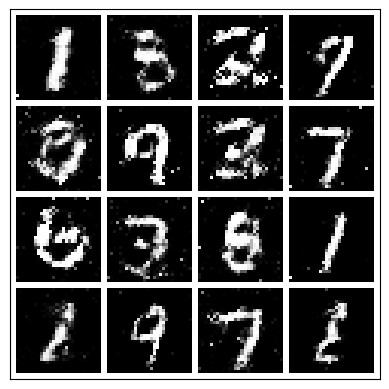

-------------------------------------
                Epoch 16:
                Step: 2500 |
                D_real Loss: 0.3722 |
                D_fake Loss: 0.5037 |
                D_total Loss: 0.8758 |
                G_Loss: 1.289 |
                Real_score 0.750 |
                Fake_score 0.368
            


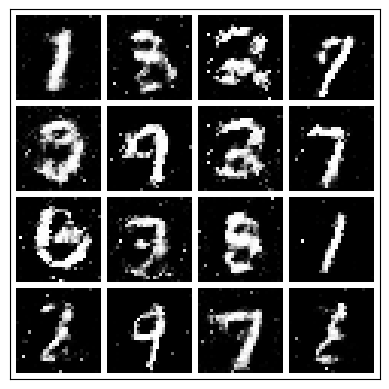

-------------------------------------
                Epoch 16:
                Step: 3000 |
                D_real Loss: 0.4527 |
                D_fake Loss: 0.4807 |
                D_total Loss: 0.9334 |
                G_Loss: 1.417 |
                Real_score 0.726 |
                Fake_score 0.346
            


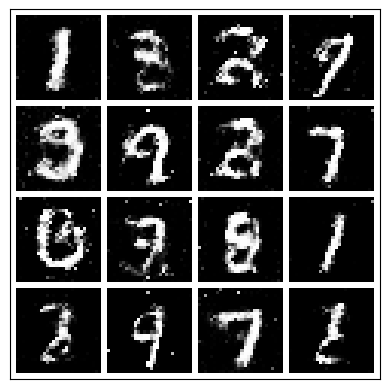

-------------------------------------
                Epoch 16:
                Step: 3500 |
                D_real Loss: 0.8622 |
                D_fake Loss: 0.5134 |
                D_total Loss: 1.3756 |
                G_Loss: 1.337 |
                Real_score 0.488 |
                Fake_score 0.362
            


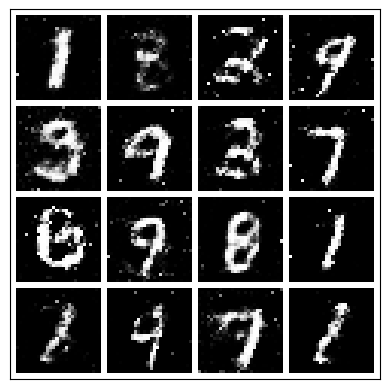

 32%|███▏      | 16/50 [17:51<38:27, 67.87s/it]

-------------------------------------
                Epoch 17:
                Step: 0 |
                D_real Loss: 0.5177 |
                D_fake Loss: 0.3965 |
                D_total Loss: 0.9142 |
                G_Loss: 1.779 |
                Real_score 0.676 |
                Fake_score 0.267
            


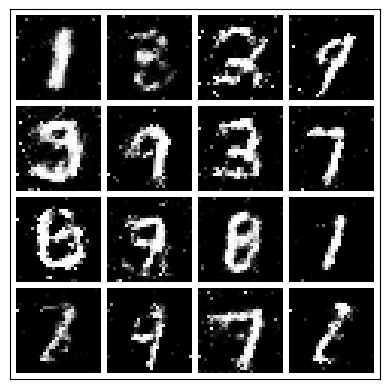

-------------------------------------
                Epoch 17:
                Step: 500 |
                D_real Loss: 0.4825 |
                D_fake Loss: 0.3762 |
                D_total Loss: 0.8588 |
                G_Loss: 1.210 |
                Real_score 0.673 |
                Fake_score 0.276
            


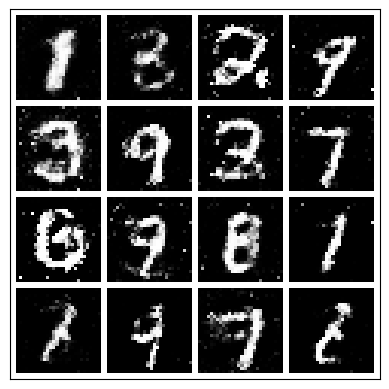

-------------------------------------
                Epoch 17:
                Step: 1000 |
                D_real Loss: 0.5636 |
                D_fake Loss: 0.4266 |
                D_total Loss: 0.9901 |
                G_Loss: 1.844 |
                Real_score 0.658 |
                Fake_score 0.246
            


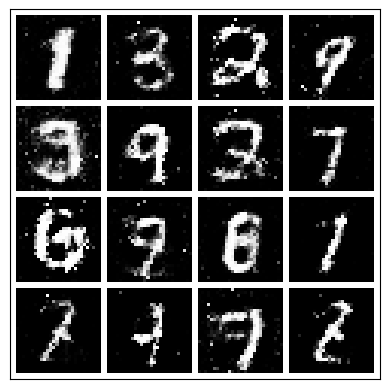

-------------------------------------
                Epoch 17:
                Step: 1500 |
                D_real Loss: 0.1362 |
                D_fake Loss: 0.4424 |
                D_total Loss: 0.5785 |
                G_Loss: 1.266 |
                Real_score 0.885 |
                Fake_score 0.305
            


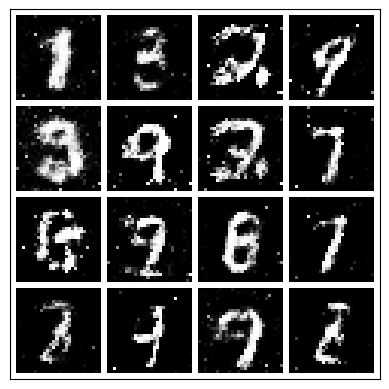

-------------------------------------
                Epoch 17:
                Step: 2000 |
                D_real Loss: 0.5012 |
                D_fake Loss: 0.5403 |
                D_total Loss: 1.0415 |
                G_Loss: 1.150 |
                Real_score 0.662 |
                Fake_score 0.373
            


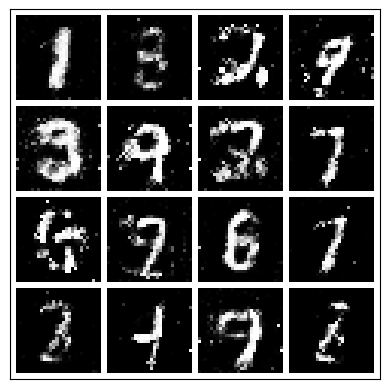

-------------------------------------
                Epoch 17:
                Step: 2500 |
                D_real Loss: 0.5053 |
                D_fake Loss: 0.2941 |
                D_total Loss: 0.7994 |
                G_Loss: 1.220 |
                Real_score 0.659 |
                Fake_score 0.247
            


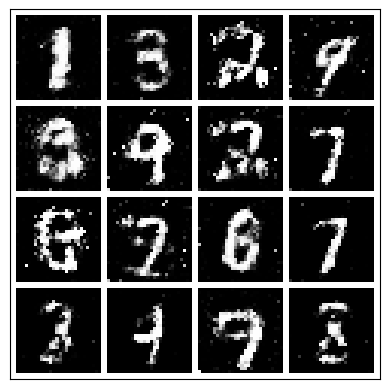

-------------------------------------
                Epoch 17:
                Step: 3000 |
                D_real Loss: 0.3141 |
                D_fake Loss: 0.4361 |
                D_total Loss: 0.7502 |
                G_Loss: 1.457 |
                Real_score 0.775 |
                Fake_score 0.311
            


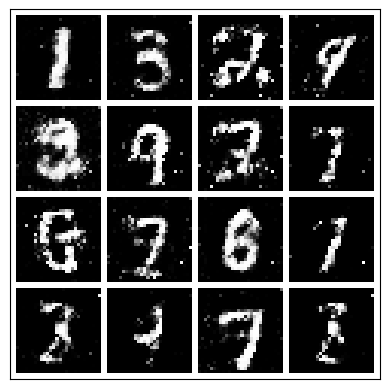

-------------------------------------
                Epoch 17:
                Step: 3500 |
                D_real Loss: 0.2791 |
                D_fake Loss: 0.5176 |
                D_total Loss: 0.7967 |
                G_Loss: 1.206 |
                Real_score 0.805 |
                Fake_score 0.363
            


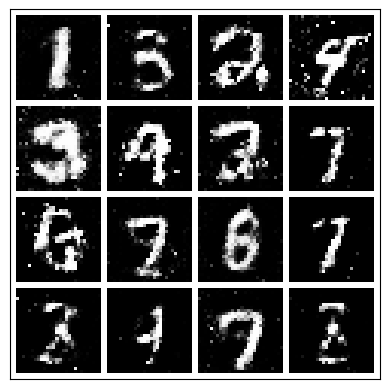

 34%|███▍      | 17/50 [18:59<37:24, 68.02s/it]

-------------------------------------
                Epoch 18:
                Step: 0 |
                D_real Loss: 0.5215 |
                D_fake Loss: 0.5252 |
                D_total Loss: 1.0468 |
                G_Loss: 1.192 |
                Real_score 0.656 |
                Fake_score 0.368
            


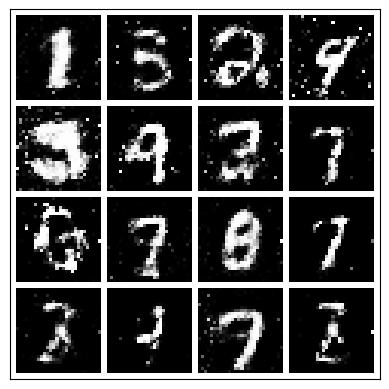

-------------------------------------
                Epoch 18:
                Step: 500 |
                D_real Loss: 0.4295 |
                D_fake Loss: 0.5146 |
                D_total Loss: 0.9442 |
                G_Loss: 1.082 |
                Real_score 0.723 |
                Fake_score 0.383
            


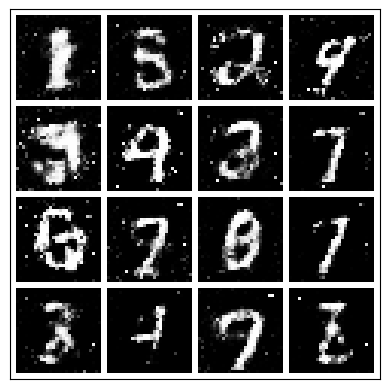

-------------------------------------
                Epoch 18:
                Step: 1000 |
                D_real Loss: 0.3535 |
                D_fake Loss: 0.3281 |
                D_total Loss: 0.6816 |
                G_Loss: 1.534 |
                Real_score 0.742 |
                Fake_score 0.262
            


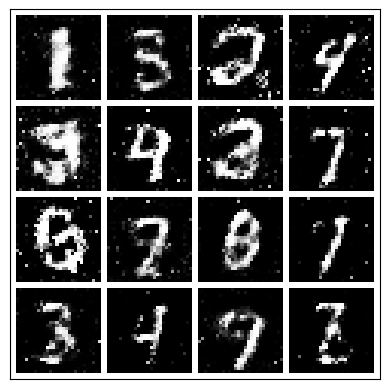

-------------------------------------
                Epoch 18:
                Step: 1500 |
                D_real Loss: 0.3716 |
                D_fake Loss: 0.3648 |
                D_total Loss: 0.7365 |
                G_Loss: 1.344 |
                Real_score 0.749 |
                Fake_score 0.283
            


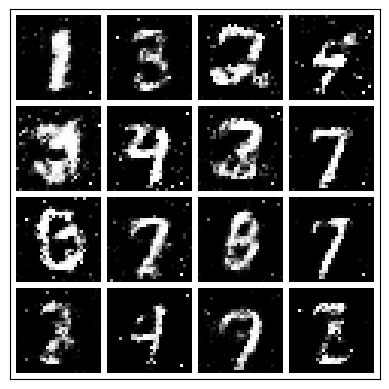

-------------------------------------
                Epoch 18:
                Step: 2000 |
                D_real Loss: 0.6820 |
                D_fake Loss: 0.3477 |
                D_total Loss: 1.0297 |
                G_Loss: 1.262 |
                Real_score 0.587 |
                Fake_score 0.276
            


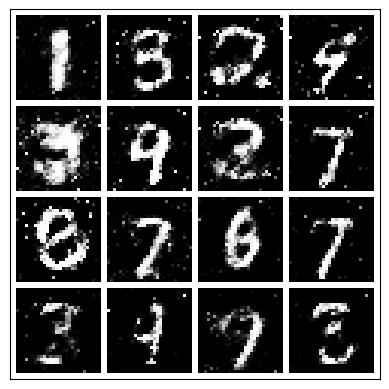

-------------------------------------
                Epoch 18:
                Step: 2500 |
                D_real Loss: 0.3578 |
                D_fake Loss: 0.4399 |
                D_total Loss: 0.7976 |
                G_Loss: 1.052 |
                Real_score 0.740 |
                Fake_score 0.336
            


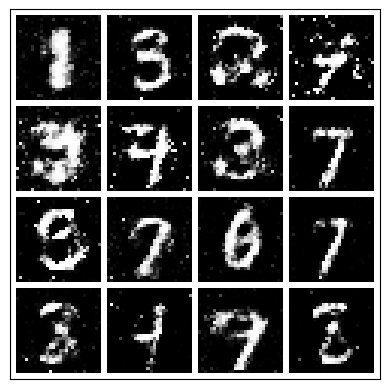

-------------------------------------
                Epoch 18:
                Step: 3000 |
                D_real Loss: 0.6703 |
                D_fake Loss: 0.3266 |
                D_total Loss: 0.9970 |
                G_Loss: 1.304 |
                Real_score 0.606 |
                Fake_score 0.271
            


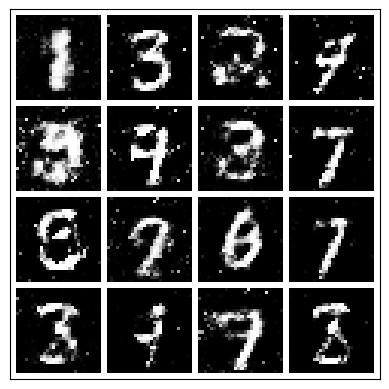

-------------------------------------
                Epoch 18:
                Step: 3500 |
                D_real Loss: 0.6299 |
                D_fake Loss: 0.4101 |
                D_total Loss: 1.0401 |
                G_Loss: 1.656 |
                Real_score 0.598 |
                Fake_score 0.304
            


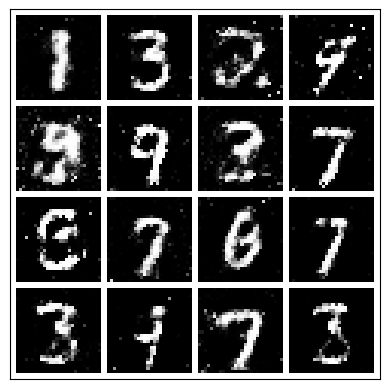

 36%|███▌      | 18/50 [20:09<36:34, 68.57s/it]

-------------------------------------
                Epoch 19:
                Step: 0 |
                D_real Loss: 0.5571 |
                D_fake Loss: 0.3946 |
                D_total Loss: 0.9517 |
                G_Loss: 1.365 |
                Real_score 0.628 |
                Fake_score 0.307
            


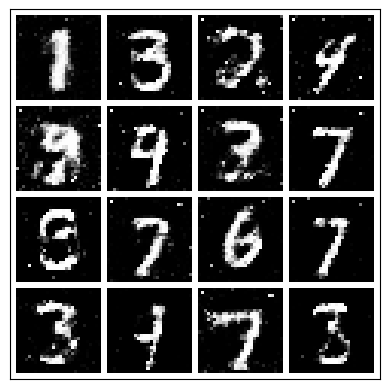

-------------------------------------
                Epoch 19:
                Step: 500 |
                D_real Loss: 0.6968 |
                D_fake Loss: 0.4683 |
                D_total Loss: 1.1651 |
                G_Loss: 1.202 |
                Real_score 0.579 |
                Fake_score 0.345
            


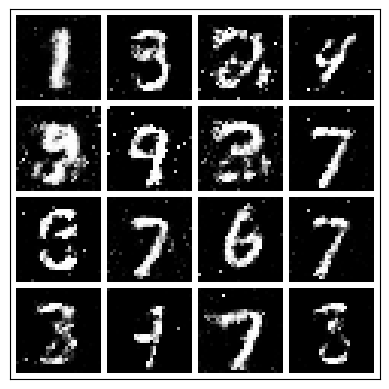

-------------------------------------
                Epoch 19:
                Step: 1000 |
                D_real Loss: 0.5349 |
                D_fake Loss: 0.4142 |
                D_total Loss: 0.9491 |
                G_Loss: 1.166 |
                Real_score 0.638 |
                Fake_score 0.319
            


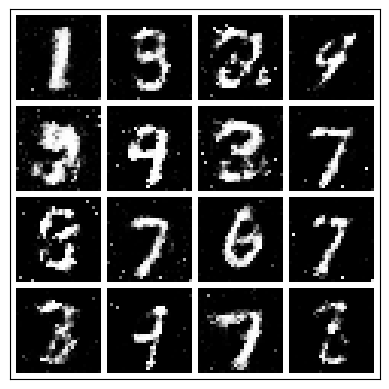

-------------------------------------
                Epoch 19:
                Step: 1500 |
                D_real Loss: 0.2202 |
                D_fake Loss: 0.2985 |
                D_total Loss: 0.5186 |
                G_Loss: 1.448 |
                Real_score 0.829 |
                Fake_score 0.252
            


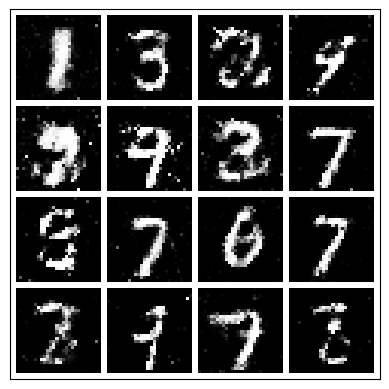

-------------------------------------
                Epoch 19:
                Step: 2000 |
                D_real Loss: 0.4832 |
                D_fake Loss: 0.3800 |
                D_total Loss: 0.8632 |
                G_Loss: 1.264 |
                Real_score 0.664 |
                Fake_score 0.306
            


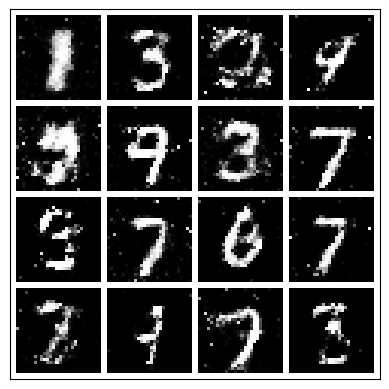

-------------------------------------
                Epoch 19:
                Step: 2500 |
                D_real Loss: 0.3918 |
                D_fake Loss: 0.4725 |
                D_total Loss: 0.8643 |
                G_Loss: 1.069 |
                Real_score 0.742 |
                Fake_score 0.354
            


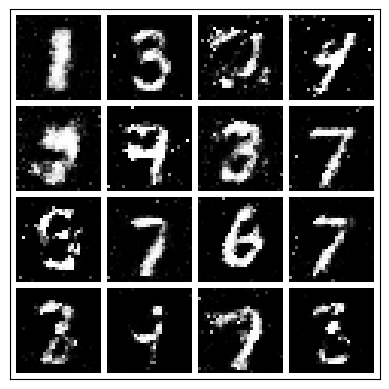

-------------------------------------
                Epoch 19:
                Step: 3000 |
                D_real Loss: 0.5849 |
                D_fake Loss: 0.2819 |
                D_total Loss: 0.8668 |
                G_Loss: 1.821 |
                Real_score 0.625 |
                Fake_score 0.230
            


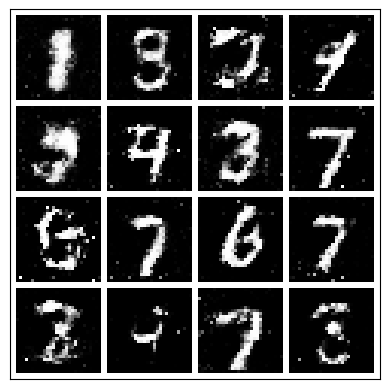

-------------------------------------
                Epoch 19:
                Step: 3500 |
                D_real Loss: 0.3073 |
                D_fake Loss: 0.4480 |
                D_total Loss: 0.7553 |
                G_Loss: 1.227 |
                Real_score 0.784 |
                Fake_score 0.334
            


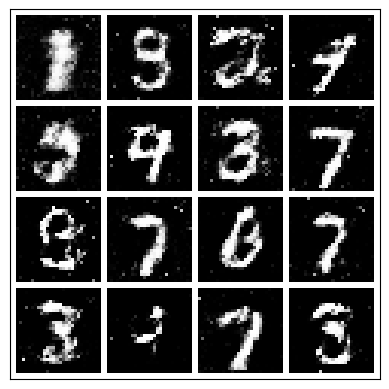

 38%|███▊      | 19/50 [21:19<35:37, 68.96s/it]

-------------------------------------
                Epoch 20:
                Step: 0 |
                D_real Loss: 0.6773 |
                D_fake Loss: 0.4833 |
                D_total Loss: 1.1606 |
                G_Loss: 1.517 |
                Real_score 0.587 |
                Fake_score 0.352
            


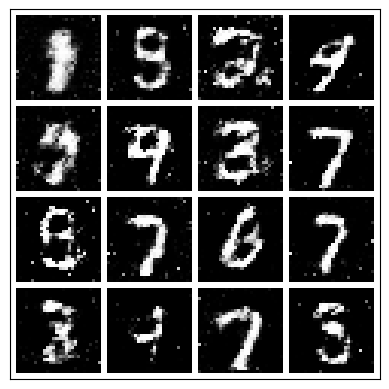

-------------------------------------
                Epoch 20:
                Step: 500 |
                D_real Loss: 0.6640 |
                D_fake Loss: 0.2383 |
                D_total Loss: 0.9023 |
                G_Loss: 1.539 |
                Real_score 0.614 |
                Fake_score 0.203
            


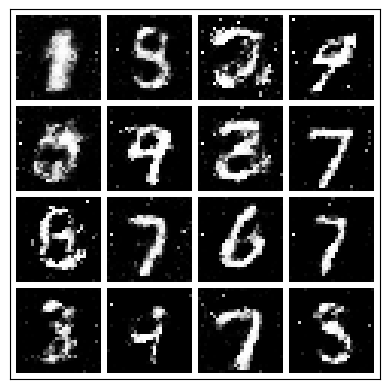

-------------------------------------
                Epoch 20:
                Step: 1000 |
                D_real Loss: 0.3553 |
                D_fake Loss: 0.5285 |
                D_total Loss: 0.8838 |
                G_Loss: 0.925 |
                Real_score 0.744 |
                Fake_score 0.398
            


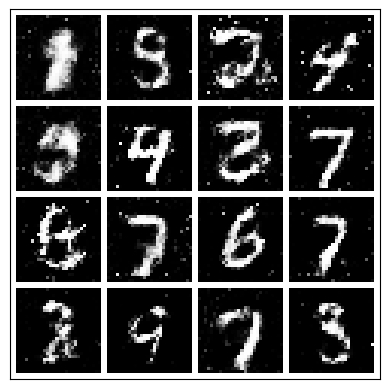

-------------------------------------
                Epoch 20:
                Step: 1500 |
                D_real Loss: 0.5128 |
                D_fake Loss: 0.5777 |
                D_total Loss: 1.0905 |
                G_Loss: 1.393 |
                Real_score 0.644 |
                Fake_score 0.359
            


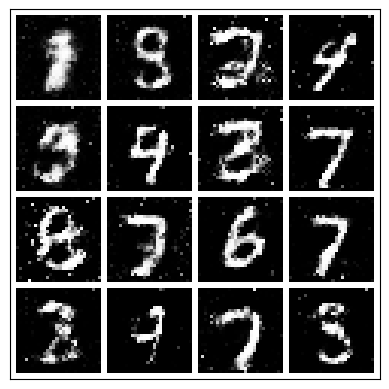

-------------------------------------
                Epoch 20:
                Step: 2000 |
                D_real Loss: 0.6812 |
                D_fake Loss: 0.4366 |
                D_total Loss: 1.1177 |
                G_Loss: 1.635 |
                Real_score 0.592 |
                Fake_score 0.292
            


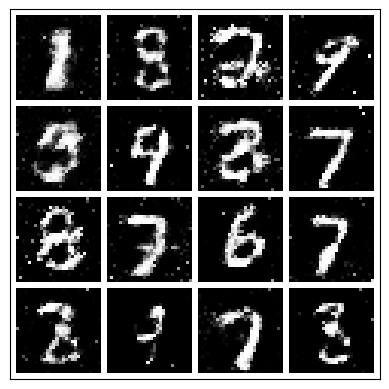

-------------------------------------
                Epoch 20:
                Step: 2500 |
                D_real Loss: 0.3893 |
                D_fake Loss: 0.8412 |
                D_total Loss: 1.2304 |
                G_Loss: 1.264 |
                Real_score 0.731 |
                Fake_score 0.437
            


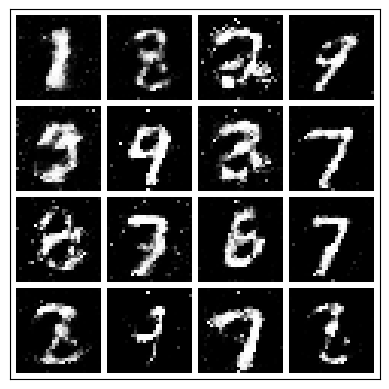

-------------------------------------
                Epoch 20:
                Step: 3000 |
                D_real Loss: 0.4405 |
                D_fake Loss: 0.8356 |
                D_total Loss: 1.2761 |
                G_Loss: 1.170 |
                Real_score 0.703 |
                Fake_score 0.468
            


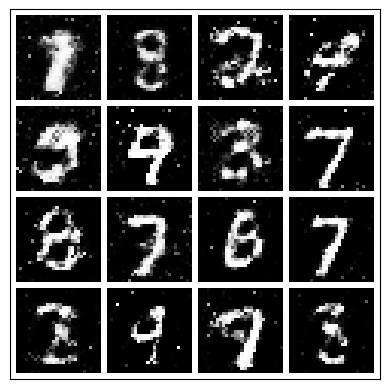

-------------------------------------
                Epoch 20:
                Step: 3500 |
                D_real Loss: 0.4091 |
                D_fake Loss: 0.4486 |
                D_total Loss: 0.8577 |
                G_Loss: 1.289 |
                Real_score 0.707 |
                Fake_score 0.313
            


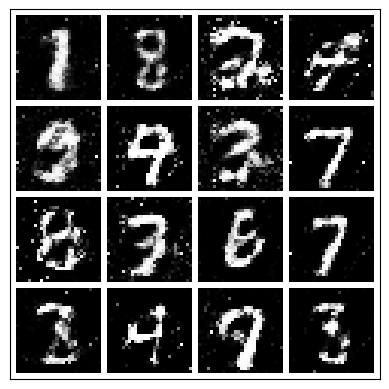

 40%|████      | 20/50 [22:31<34:59, 69.98s/it]

-------------------------------------
                Epoch 21:
                Step: 0 |
                D_real Loss: 0.9777 |
                D_fake Loss: 0.3840 |
                D_total Loss: 1.3617 |
                G_Loss: 1.443 |
                Real_score 0.448 |
                Fake_score 0.306
            


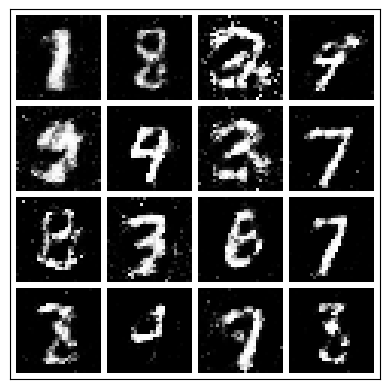

-------------------------------------
                Epoch 21:
                Step: 500 |
                D_real Loss: 0.7370 |
                D_fake Loss: 0.4047 |
                D_total Loss: 1.1417 |
                G_Loss: 1.271 |
                Real_score 0.573 |
                Fake_score 0.313
            


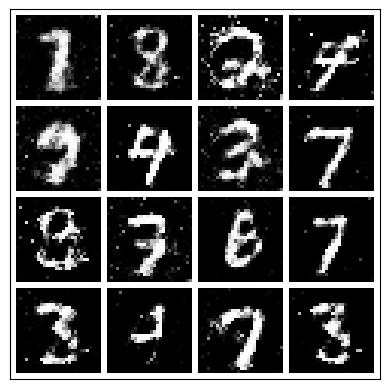

-------------------------------------
                Epoch 21:
                Step: 1000 |
                D_real Loss: 0.2763 |
                D_fake Loss: 0.6091 |
                D_total Loss: 0.8854 |
                G_Loss: 1.310 |
                Real_score 0.796 |
                Fake_score 0.396
            


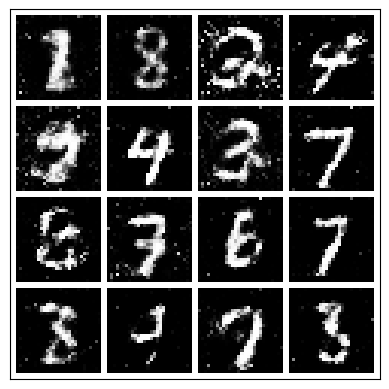

-------------------------------------
                Epoch 21:
                Step: 1500 |
                D_real Loss: 0.4423 |
                D_fake Loss: 0.5240 |
                D_total Loss: 0.9663 |
                G_Loss: 1.311 |
                Real_score 0.673 |
                Fake_score 0.331
            


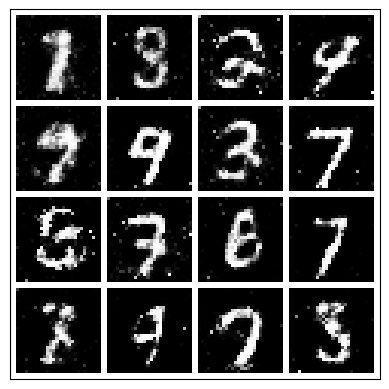

-------------------------------------
                Epoch 21:
                Step: 2000 |
                D_real Loss: 0.5951 |
                D_fake Loss: 0.4578 |
                D_total Loss: 1.0529 |
                G_Loss: 1.388 |
                Real_score 0.639 |
                Fake_score 0.326
            


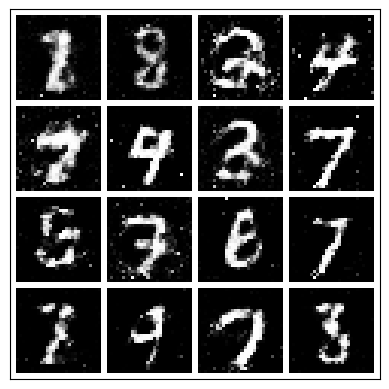

-------------------------------------
                Epoch 21:
                Step: 2500 |
                D_real Loss: 0.4347 |
                D_fake Loss: 0.5762 |
                D_total Loss: 1.0109 |
                G_Loss: 1.230 |
                Real_score 0.697 |
                Fake_score 0.399
            


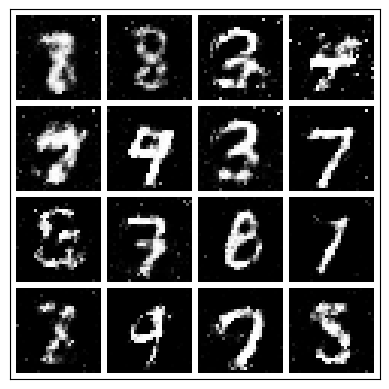

-------------------------------------
                Epoch 21:
                Step: 3000 |
                D_real Loss: 0.4180 |
                D_fake Loss: 0.5352 |
                D_total Loss: 0.9532 |
                G_Loss: 1.038 |
                Real_score 0.726 |
                Fake_score 0.380
            


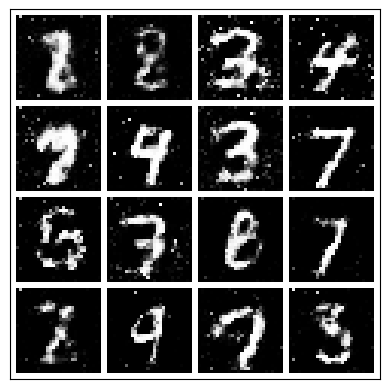

-------------------------------------
                Epoch 21:
                Step: 3500 |
                D_real Loss: 0.4656 |
                D_fake Loss: 0.3172 |
                D_total Loss: 0.7828 |
                G_Loss: 1.598 |
                Real_score 0.716 |
                Fake_score 0.256
            


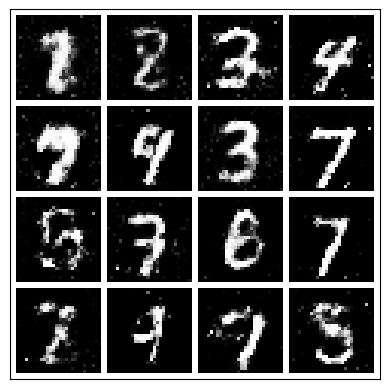

 42%|████▏     | 21/50 [23:45<34:18, 70.98s/it]

-------------------------------------
                Epoch 22:
                Step: 0 |
                D_real Loss: 0.5903 |
                D_fake Loss: 0.5073 |
                D_total Loss: 1.0976 |
                G_Loss: 1.441 |
                Real_score 0.645 |
                Fake_score 0.336
            


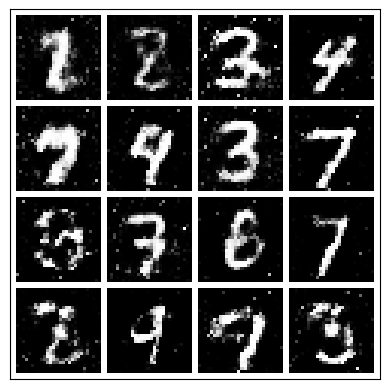

-------------------------------------
                Epoch 22:
                Step: 500 |
                D_real Loss: 0.5612 |
                D_fake Loss: 0.4609 |
                D_total Loss: 1.0221 |
                G_Loss: 1.271 |
                Real_score 0.611 |
                Fake_score 0.348
            


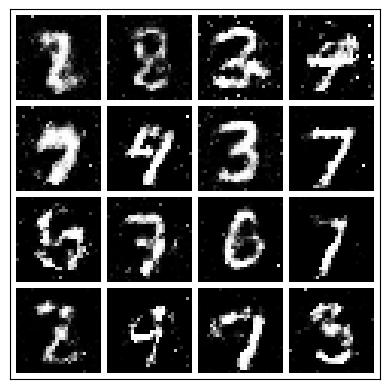

-------------------------------------
                Epoch 22:
                Step: 1000 |
                D_real Loss: 0.6191 |
                D_fake Loss: 0.5916 |
                D_total Loss: 1.2107 |
                G_Loss: 0.901 |
                Real_score 0.625 |
                Fake_score 0.406
            


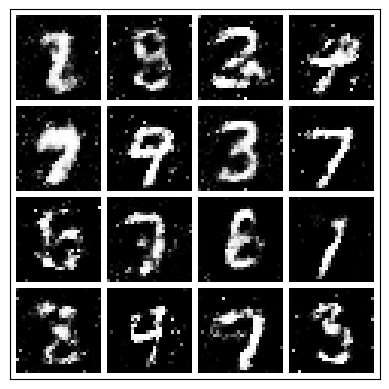

-------------------------------------
                Epoch 22:
                Step: 1500 |
                D_real Loss: 0.4181 |
                D_fake Loss: 0.4780 |
                D_total Loss: 0.8960 |
                G_Loss: 1.375 |
                Real_score 0.699 |
                Fake_score 0.330
            


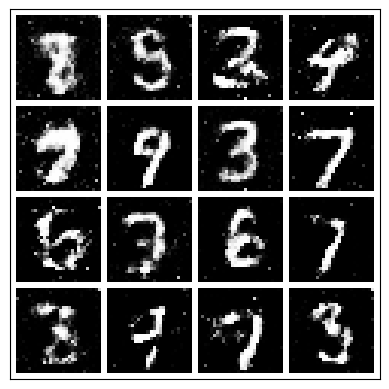

-------------------------------------
                Epoch 22:
                Step: 2000 |
                D_real Loss: 0.5630 |
                D_fake Loss: 0.5568 |
                D_total Loss: 1.1198 |
                G_Loss: 1.458 |
                Real_score 0.621 |
                Fake_score 0.401
            


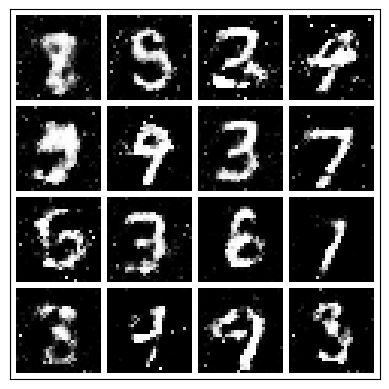

-------------------------------------
                Epoch 22:
                Step: 2500 |
                D_real Loss: 0.5360 |
                D_fake Loss: 0.7551 |
                D_total Loss: 1.2912 |
                G_Loss: 1.043 |
                Real_score 0.629 |
                Fake_score 0.455
            


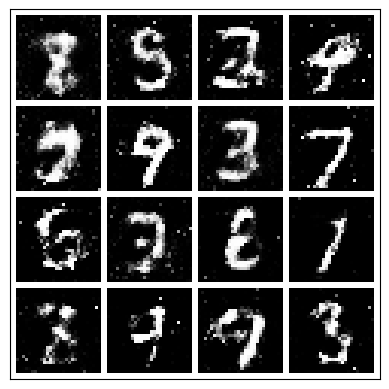

-------------------------------------
                Epoch 22:
                Step: 3000 |
                D_real Loss: 0.5702 |
                D_fake Loss: 0.4999 |
                D_total Loss: 1.0701 |
                G_Loss: 1.197 |
                Real_score 0.670 |
                Fake_score 0.323
            


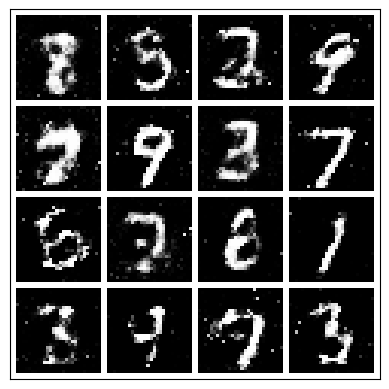

-------------------------------------
                Epoch 22:
                Step: 3500 |
                D_real Loss: 0.4668 |
                D_fake Loss: 0.3516 |
                D_total Loss: 0.8184 |
                G_Loss: 1.292 |
                Real_score 0.715 |
                Fake_score 0.266
            


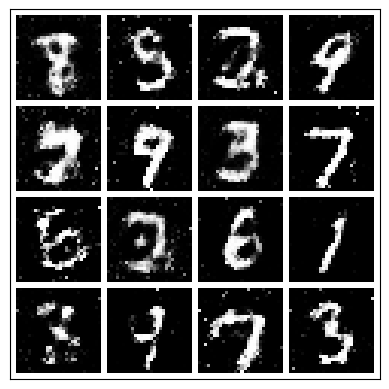

 44%|████▍     | 22/50 [24:59<33:35, 71.97s/it]

-------------------------------------
                Epoch 23:
                Step: 0 |
                D_real Loss: 0.3146 |
                D_fake Loss: 0.3931 |
                D_total Loss: 0.7077 |
                G_Loss: 1.348 |
                Real_score 0.780 |
                Fake_score 0.310
            


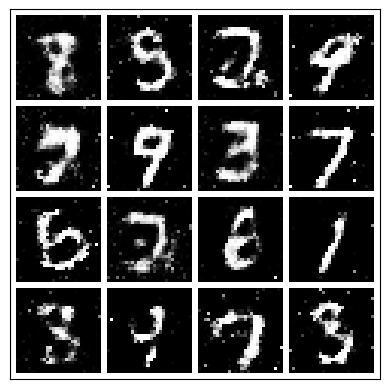

-------------------------------------
                Epoch 23:
                Step: 500 |
                D_real Loss: 0.4574 |
                D_fake Loss: 0.4736 |
                D_total Loss: 0.9309 |
                G_Loss: 1.284 |
                Real_score 0.686 |
                Fake_score 0.341
            


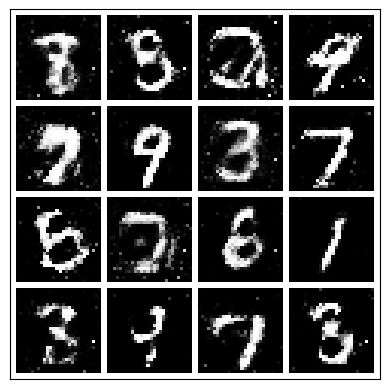

-------------------------------------
                Epoch 23:
                Step: 1000 |
                D_real Loss: 0.4358 |
                D_fake Loss: 0.4952 |
                D_total Loss: 0.9310 |
                G_Loss: 1.281 |
                Real_score 0.704 |
                Fake_score 0.357
            


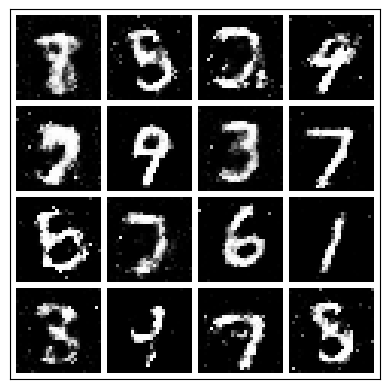

-------------------------------------
                Epoch 23:
                Step: 1500 |
                D_real Loss: 0.8063 |
                D_fake Loss: 0.4254 |
                D_total Loss: 1.2316 |
                G_Loss: 1.438 |
                Real_score 0.585 |
                Fake_score 0.323
            


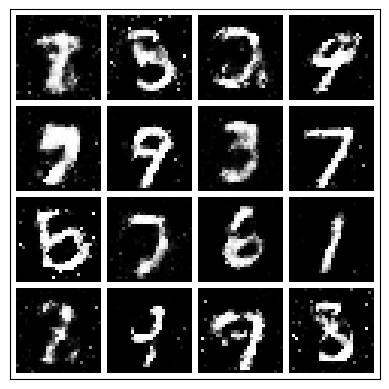

-------------------------------------
                Epoch 23:
                Step: 2000 |
                D_real Loss: 0.5751 |
                D_fake Loss: 0.5189 |
                D_total Loss: 1.0940 |
                G_Loss: 1.165 |
                Real_score 0.631 |
                Fake_score 0.362
            


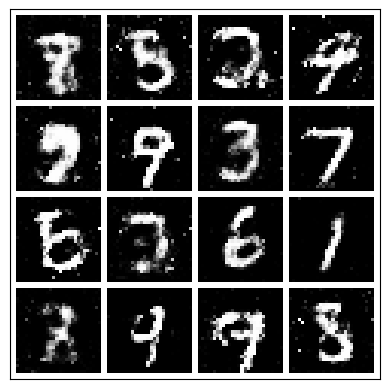

-------------------------------------
                Epoch 23:
                Step: 2500 |
                D_real Loss: 0.6299 |
                D_fake Loss: 0.5071 |
                D_total Loss: 1.1370 |
                G_Loss: 0.997 |
                Real_score 0.578 |
                Fake_score 0.357
            


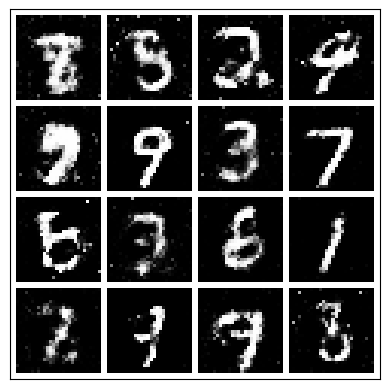

-------------------------------------
                Epoch 23:
                Step: 3000 |
                D_real Loss: 0.5378 |
                D_fake Loss: 0.3592 |
                D_total Loss: 0.8970 |
                G_Loss: 1.516 |
                Real_score 0.640 |
                Fake_score 0.296
            


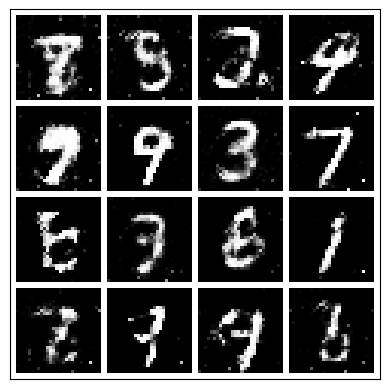

-------------------------------------
                Epoch 23:
                Step: 3500 |
                D_real Loss: 0.5272 |
                D_fake Loss: 0.4301 |
                D_total Loss: 0.9573 |
                G_Loss: 1.428 |
                Real_score 0.659 |
                Fake_score 0.310
            


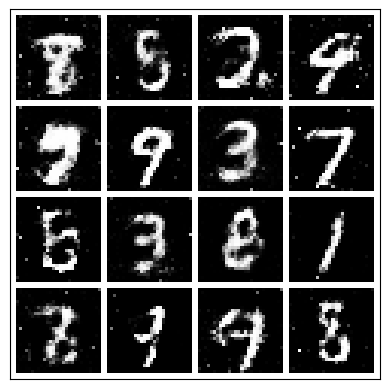

 46%|████▌     | 23/50 [26:14<32:46, 72.84s/it]

-------------------------------------
                Epoch 24:
                Step: 0 |
                D_real Loss: 0.5471 |
                D_fake Loss: 0.4446 |
                D_total Loss: 0.9917 |
                G_Loss: 1.279 |
                Real_score 0.630 |
                Fake_score 0.340
            


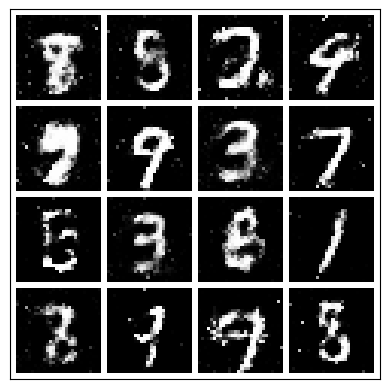

-------------------------------------
                Epoch 24:
                Step: 500 |
                D_real Loss: 0.4395 |
                D_fake Loss: 0.4433 |
                D_total Loss: 0.8828 |
                G_Loss: 1.473 |
                Real_score 0.704 |
                Fake_score 0.319
            


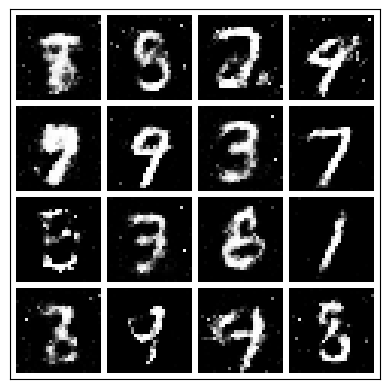

-------------------------------------
                Epoch 24:
                Step: 1000 |
                D_real Loss: 0.4749 |
                D_fake Loss: 0.4190 |
                D_total Loss: 0.8939 |
                G_Loss: 1.394 |
                Real_score 0.689 |
                Fake_score 0.313
            


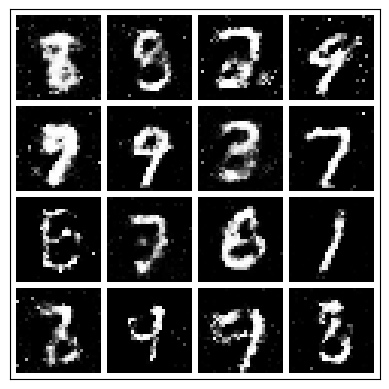

-------------------------------------
                Epoch 24:
                Step: 1500 |
                D_real Loss: 0.5454 |
                D_fake Loss: 0.2789 |
                D_total Loss: 0.8243 |
                G_Loss: 1.423 |
                Real_score 0.650 |
                Fake_score 0.236
            


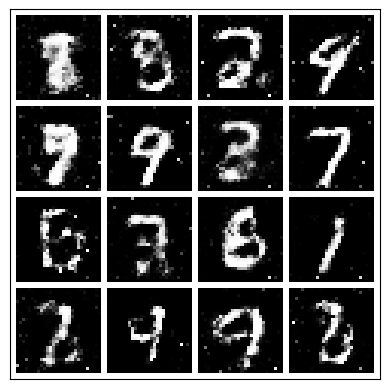

-------------------------------------
                Epoch 24:
                Step: 2000 |
                D_real Loss: 0.4652 |
                D_fake Loss: 0.4716 |
                D_total Loss: 0.9368 |
                G_Loss: 1.340 |
                Real_score 0.661 |
                Fake_score 0.344
            


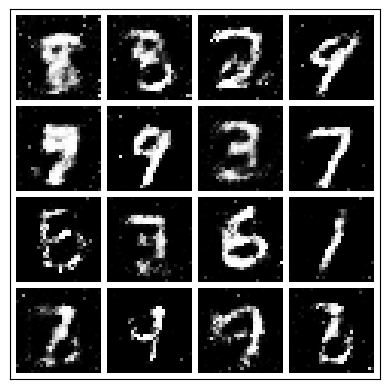

-------------------------------------
                Epoch 24:
                Step: 2500 |
                D_real Loss: 0.5948 |
                D_fake Loss: 0.5551 |
                D_total Loss: 1.1499 |
                G_Loss: 0.824 |
                Real_score 0.627 |
                Fake_score 0.403
            


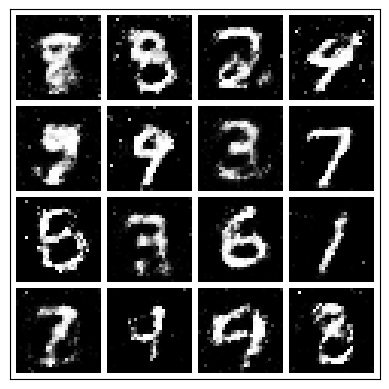

-------------------------------------
                Epoch 24:
                Step: 3000 |
                D_real Loss: 0.6063 |
                D_fake Loss: 0.4531 |
                D_total Loss: 1.0594 |
                G_Loss: 1.344 |
                Real_score 0.607 |
                Fake_score 0.338
            


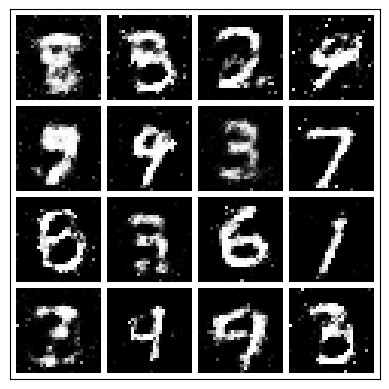

-------------------------------------
                Epoch 24:
                Step: 3500 |
                D_real Loss: 0.7895 |
                D_fake Loss: 0.3690 |
                D_total Loss: 1.1585 |
                G_Loss: 1.347 |
                Real_score 0.491 |
                Fake_score 0.290
            


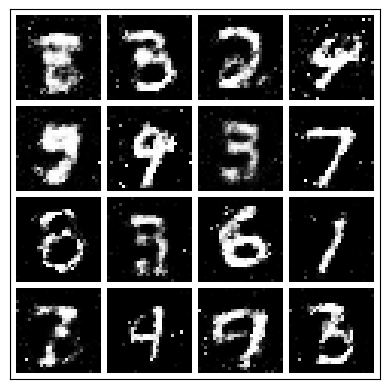

 48%|████▊     | 24/50 [27:30<32:03, 73.98s/it]

-------------------------------------
                Epoch 25:
                Step: 0 |
                D_real Loss: 0.4290 |
                D_fake Loss: 0.5739 |
                D_total Loss: 1.0030 |
                G_Loss: 1.112 |
                Real_score 0.710 |
                Fake_score 0.383
            


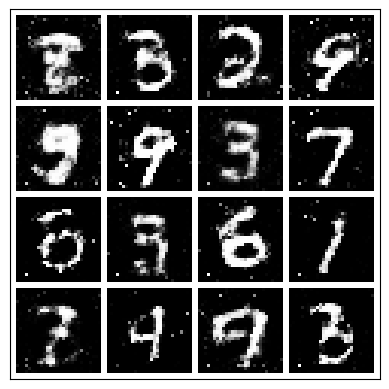

-------------------------------------
                Epoch 25:
                Step: 500 |
                D_real Loss: 0.6996 |
                D_fake Loss: 0.6738 |
                D_total Loss: 1.3734 |
                G_Loss: 1.355 |
                Real_score 0.545 |
                Fake_score 0.429
            


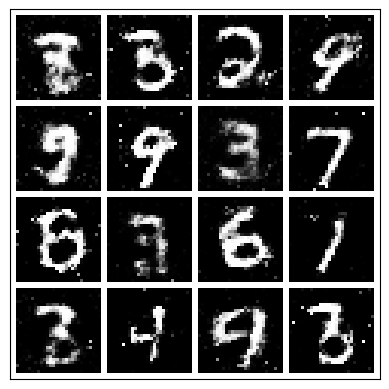

-------------------------------------
                Epoch 25:
                Step: 1000 |
                D_real Loss: 0.7249 |
                D_fake Loss: 0.3563 |
                D_total Loss: 1.0813 |
                G_Loss: 1.101 |
                Real_score 0.595 |
                Fake_score 0.285
            


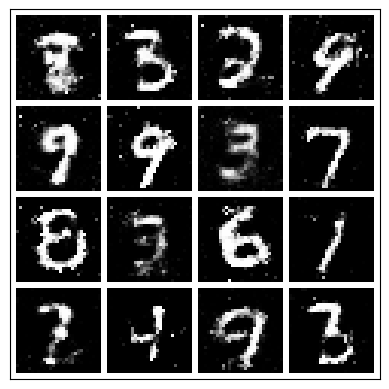

-------------------------------------
                Epoch 25:
                Step: 1500 |
                D_real Loss: 0.5786 |
                D_fake Loss: 0.4121 |
                D_total Loss: 0.9907 |
                G_Loss: 1.204 |
                Real_score 0.631 |
                Fake_score 0.323
            


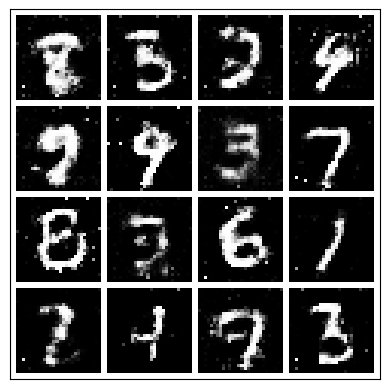

-------------------------------------
                Epoch 25:
                Step: 2000 |
                D_real Loss: 0.4098 |
                D_fake Loss: 0.5310 |
                D_total Loss: 0.9408 |
                G_Loss: 1.036 |
                Real_score 0.692 |
                Fake_score 0.382
            


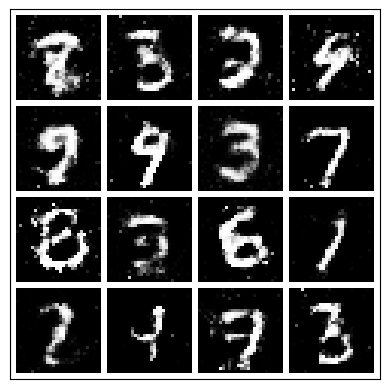

-------------------------------------
                Epoch 25:
                Step: 2500 |
                D_real Loss: 0.3062 |
                D_fake Loss: 0.5492 |
                D_total Loss: 0.8553 |
                G_Loss: 0.889 |
                Real_score 0.762 |
                Fake_score 0.386
            


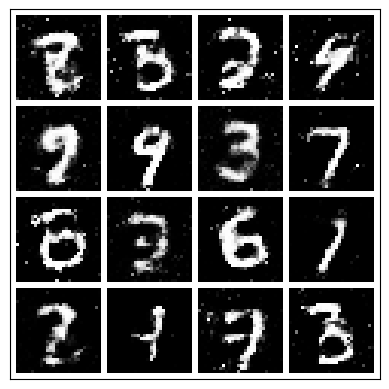

-------------------------------------
                Epoch 25:
                Step: 3000 |
                D_real Loss: 0.3772 |
                D_fake Loss: 0.3931 |
                D_total Loss: 0.7703 |
                G_Loss: 0.915 |
                Real_score 0.744 |
                Fake_score 0.302
            


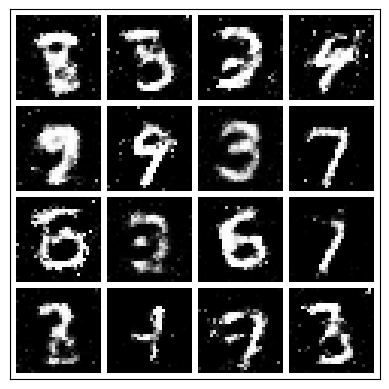

-------------------------------------
                Epoch 25:
                Step: 3500 |
                D_real Loss: 0.4336 |
                D_fake Loss: 0.5807 |
                D_total Loss: 1.0143 |
                G_Loss: 1.204 |
                Real_score 0.699 |
                Fake_score 0.386
            


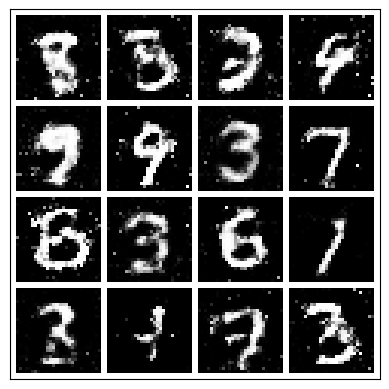

 50%|█████     | 25/50 [28:48<31:16, 75.06s/it]

-------------------------------------
                Epoch 26:
                Step: 0 |
                D_real Loss: 0.3558 |
                D_fake Loss: 0.6599 |
                D_total Loss: 1.0157 |
                G_Loss: 1.023 |
                Real_score 0.749 |
                Fake_score 0.457
            


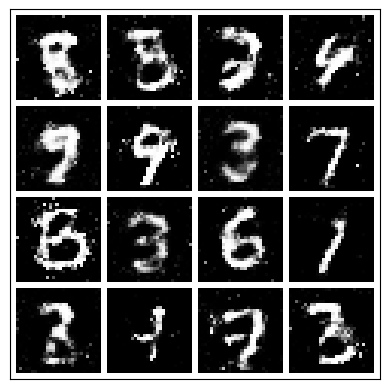

-------------------------------------
                Epoch 26:
                Step: 500 |
                D_real Loss: 0.5544 |
                D_fake Loss: 0.3965 |
                D_total Loss: 0.9508 |
                G_Loss: 1.232 |
                Real_score 0.613 |
                Fake_score 0.307
            


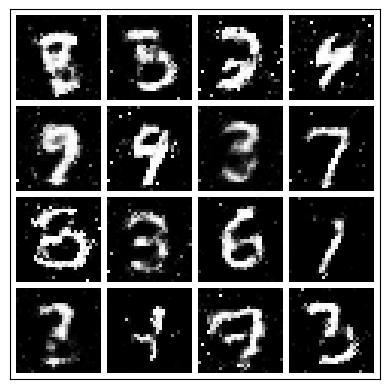

-------------------------------------
                Epoch 26:
                Step: 1000 |
                D_real Loss: 0.6722 |
                D_fake Loss: 0.4800 |
                D_total Loss: 1.1522 |
                G_Loss: 1.296 |
                Real_score 0.600 |
                Fake_score 0.343
            


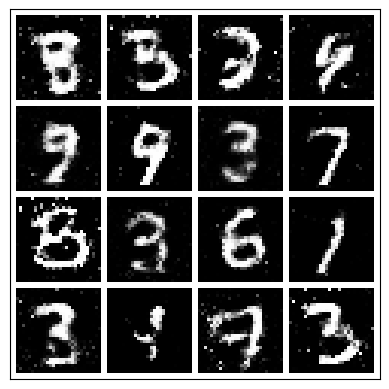

-------------------------------------
                Epoch 26:
                Step: 1500 |
                D_real Loss: 0.6563 |
                D_fake Loss: 0.6039 |
                D_total Loss: 1.2602 |
                G_Loss: 1.409 |
                Real_score 0.580 |
                Fake_score 0.343
            


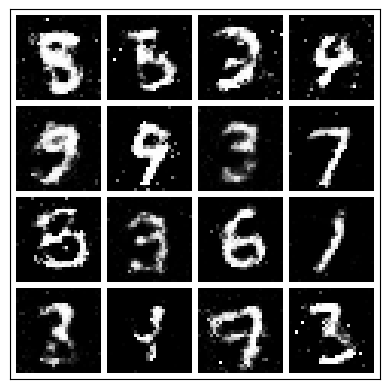

-------------------------------------
                Epoch 26:
                Step: 2000 |
                D_real Loss: 0.6989 |
                D_fake Loss: 0.5124 |
                D_total Loss: 1.2113 |
                G_Loss: 1.098 |
                Real_score 0.570 |
                Fake_score 0.339
            


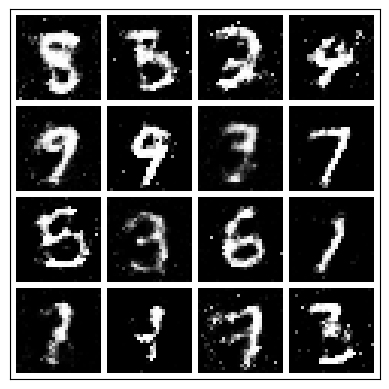

-------------------------------------
                Epoch 26:
                Step: 2500 |
                D_real Loss: 0.3299 |
                D_fake Loss: 0.5529 |
                D_total Loss: 0.8828 |
                G_Loss: 0.947 |
                Real_score 0.753 |
                Fake_score 0.374
            


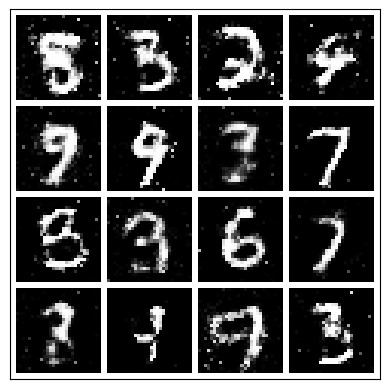

-------------------------------------
                Epoch 26:
                Step: 3000 |
                D_real Loss: 0.8273 |
                D_fake Loss: 0.3555 |
                D_total Loss: 1.1828 |
                G_Loss: 1.383 |
                Real_score 0.507 |
                Fake_score 0.283
            


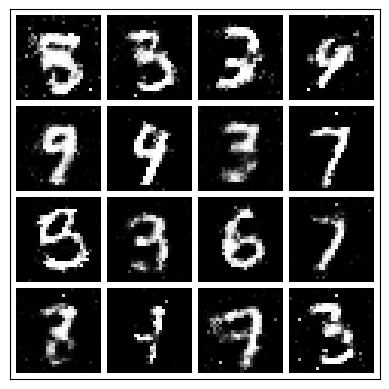

-------------------------------------
                Epoch 26:
                Step: 3500 |
                D_real Loss: 0.6989 |
                D_fake Loss: 0.4314 |
                D_total Loss: 1.1303 |
                G_Loss: 0.980 |
                Real_score 0.574 |
                Fake_score 0.327
            


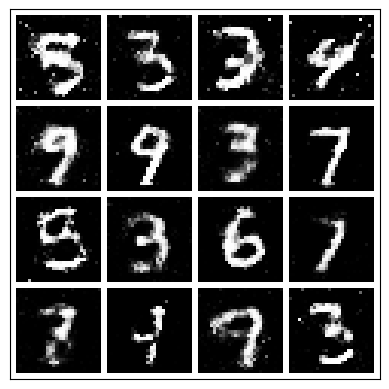

 52%|█████▏    | 26/50 [30:06<30:22, 75.94s/it]

-------------------------------------
                Epoch 27:
                Step: 0 |
                D_real Loss: 0.5948 |
                D_fake Loss: 0.3681 |
                D_total Loss: 0.9629 |
                G_Loss: 1.110 |
                Real_score 0.624 |
                Fake_score 0.293
            


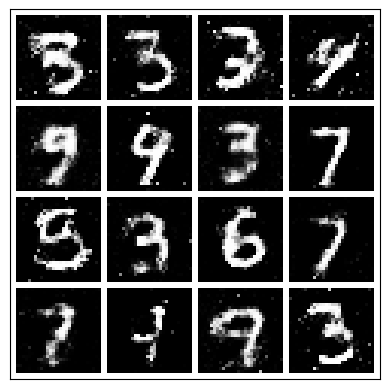

-------------------------------------
                Epoch 27:
                Step: 500 |
                D_real Loss: 0.4794 |
                D_fake Loss: 0.5603 |
                D_total Loss: 1.0397 |
                G_Loss: 1.286 |
                Real_score 0.663 |
                Fake_score 0.392
            


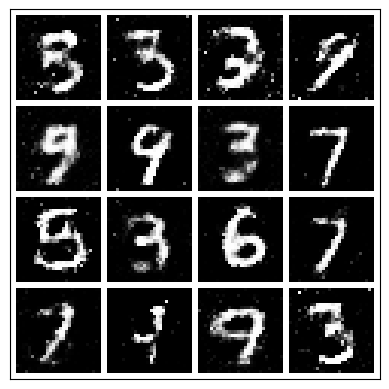

-------------------------------------
                Epoch 27:
                Step: 1000 |
                D_real Loss: 0.6404 |
                D_fake Loss: 0.6704 |
                D_total Loss: 1.3108 |
                G_Loss: 0.968 |
                Real_score 0.586 |
                Fake_score 0.453
            


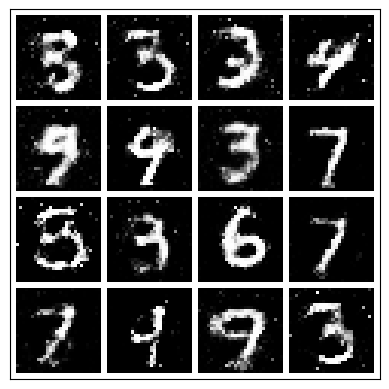

-------------------------------------
                Epoch 27:
                Step: 1500 |
                D_real Loss: 0.6486 |
                D_fake Loss: 0.5107 |
                D_total Loss: 1.1593 |
                G_Loss: 1.237 |
                Real_score 0.588 |
                Fake_score 0.357
            


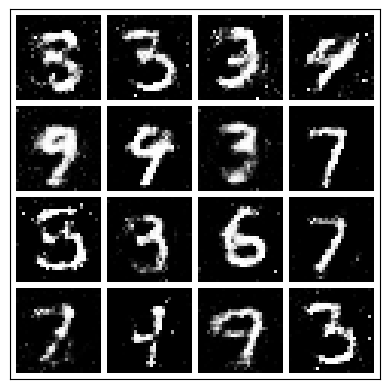

-------------------------------------
                Epoch 27:
                Step: 2000 |
                D_real Loss: 0.8132 |
                D_fake Loss: 0.3154 |
                D_total Loss: 1.1287 |
                G_Loss: 1.359 |
                Real_score 0.589 |
                Fake_score 0.254
            


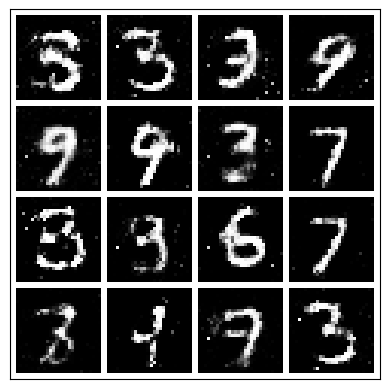

-------------------------------------
                Epoch 27:
                Step: 2500 |
                D_real Loss: 0.8011 |
                D_fake Loss: 0.4458 |
                D_total Loss: 1.2468 |
                G_Loss: 1.562 |
                Real_score 0.542 |
                Fake_score 0.346
            


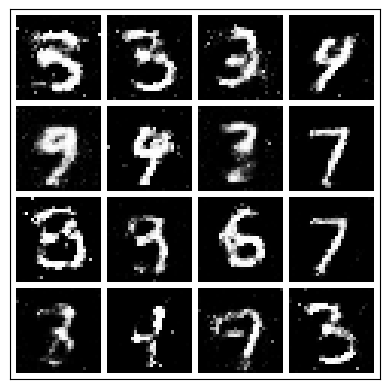

-------------------------------------
                Epoch 27:
                Step: 3000 |
                D_real Loss: 0.5909 |
                D_fake Loss: 0.5967 |
                D_total Loss: 1.1876 |
                G_Loss: 1.156 |
                Real_score 0.598 |
                Fake_score 0.327
            


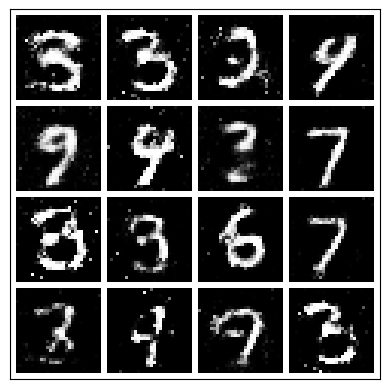

-------------------------------------
                Epoch 27:
                Step: 3500 |
                D_real Loss: 0.4911 |
                D_fake Loss: 0.4224 |
                D_total Loss: 0.9134 |
                G_Loss: 1.058 |
                Real_score 0.643 |
                Fake_score 0.329
            


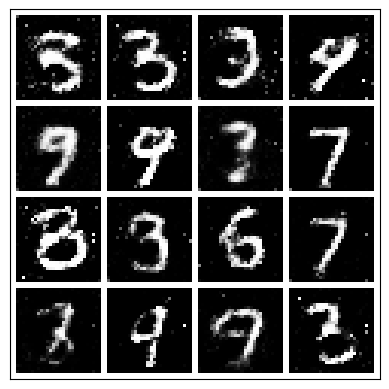

 54%|█████▍    | 27/50 [31:24<29:21, 76.60s/it]

-------------------------------------
                Epoch 28:
                Step: 0 |
                D_real Loss: 0.5001 |
                D_fake Loss: 0.5741 |
                D_total Loss: 1.0742 |
                G_Loss: 1.061 |
                Real_score 0.644 |
                Fake_score 0.389
            


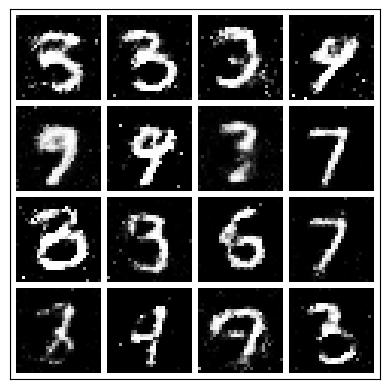

-------------------------------------
                Epoch 28:
                Step: 500 |
                D_real Loss: 0.6181 |
                D_fake Loss: 0.5514 |
                D_total Loss: 1.1695 |
                G_Loss: 1.097 |
                Real_score 0.576 |
                Fake_score 0.395
            


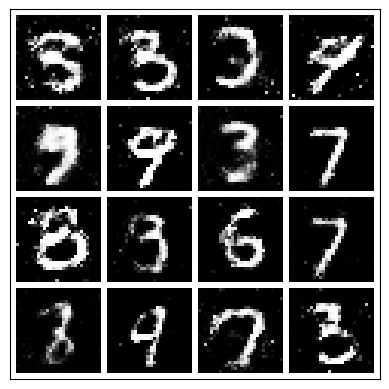

-------------------------------------
                Epoch 28:
                Step: 1000 |
                D_real Loss: 0.4338 |
                D_fake Loss: 0.6183 |
                D_total Loss: 1.0521 |
                G_Loss: 1.075 |
                Real_score 0.691 |
                Fake_score 0.414
            


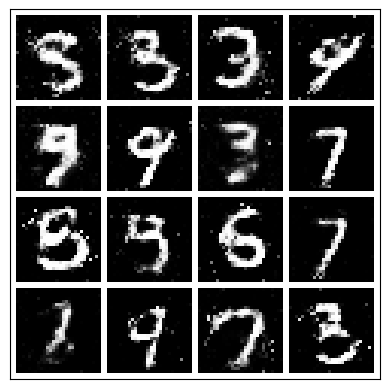

-------------------------------------
                Epoch 28:
                Step: 1500 |
                D_real Loss: 0.6937 |
                D_fake Loss: 0.4510 |
                D_total Loss: 1.1447 |
                G_Loss: 1.538 |
                Real_score 0.577 |
                Fake_score 0.331
            


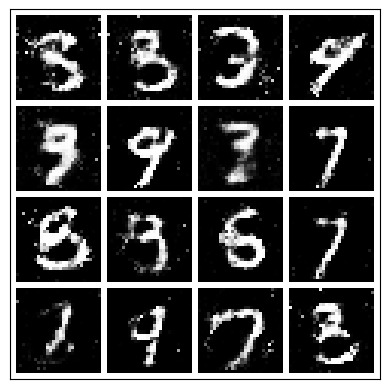

-------------------------------------
                Epoch 28:
                Step: 2000 |
                D_real Loss: 0.7943 |
                D_fake Loss: 0.4459 |
                D_total Loss: 1.2402 |
                G_Loss: 1.124 |
                Real_score 0.506 |
                Fake_score 0.330
            


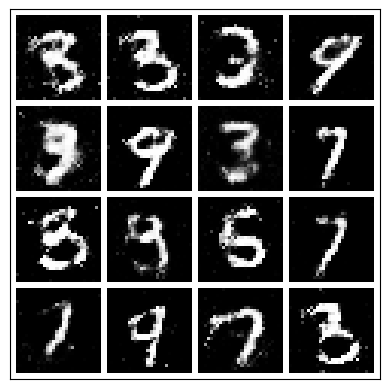

-------------------------------------
                Epoch 28:
                Step: 2500 |
                D_real Loss: 0.6057 |
                D_fake Loss: 0.5543 |
                D_total Loss: 1.1600 |
                G_Loss: 1.417 |
                Real_score 0.610 |
                Fake_score 0.394
            


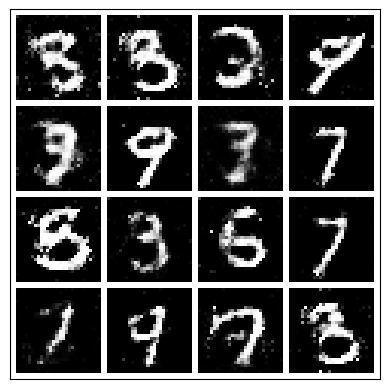

-------------------------------------
                Epoch 28:
                Step: 3000 |
                D_real Loss: 0.2927 |
                D_fake Loss: 0.4755 |
                D_total Loss: 0.7682 |
                G_Loss: 1.174 |
                Real_score 0.777 |
                Fake_score 0.370
            


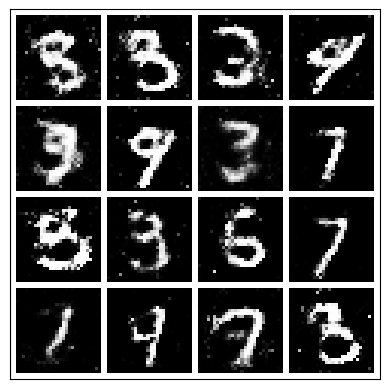

-------------------------------------
                Epoch 28:
                Step: 3500 |
                D_real Loss: 0.5949 |
                D_fake Loss: 0.5785 |
                D_total Loss: 1.1734 |
                G_Loss: 1.284 |
                Real_score 0.632 |
                Fake_score 0.402
            


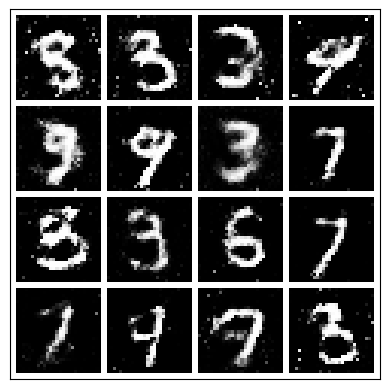

 56%|█████▌    | 28/50 [32:42<28:16, 77.11s/it]

-------------------------------------
                Epoch 29:
                Step: 0 |
                D_real Loss: 0.4813 |
                D_fake Loss: 0.5309 |
                D_total Loss: 1.0122 |
                G_Loss: 1.139 |
                Real_score 0.654 |
                Fake_score 0.387
            


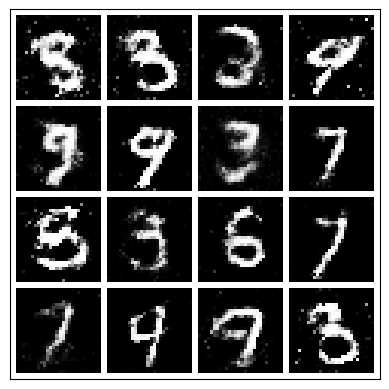

-------------------------------------
                Epoch 29:
                Step: 500 |
                D_real Loss: 0.7126 |
                D_fake Loss: 0.4952 |
                D_total Loss: 1.2078 |
                G_Loss: 1.118 |
                Real_score 0.570 |
                Fake_score 0.374
            


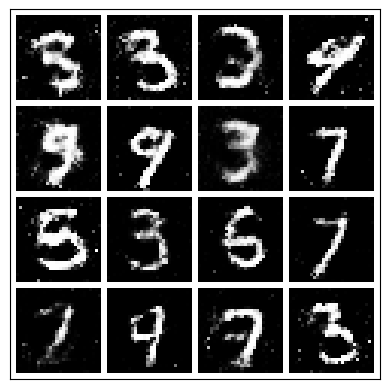

-------------------------------------
                Epoch 29:
                Step: 1000 |
                D_real Loss: 0.4735 |
                D_fake Loss: 0.3840 |
                D_total Loss: 0.8575 |
                G_Loss: 1.090 |
                Real_score 0.655 |
                Fake_score 0.303
            


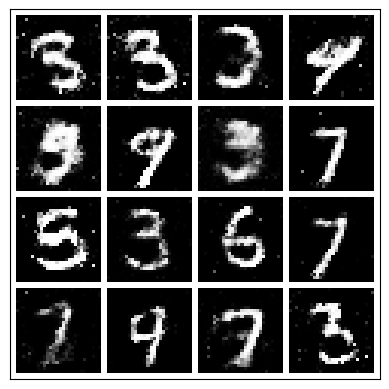

-------------------------------------
                Epoch 29:
                Step: 1500 |
                D_real Loss: 0.7125 |
                D_fake Loss: 0.5184 |
                D_total Loss: 1.2310 |
                G_Loss: 1.098 |
                Real_score 0.559 |
                Fake_score 0.385
            


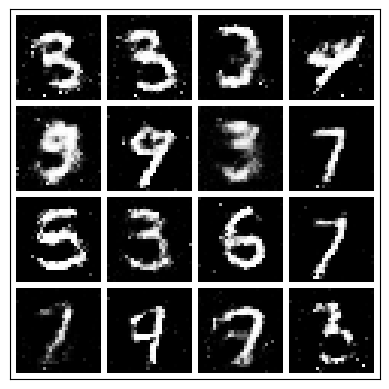

-------------------------------------
                Epoch 29:
                Step: 2000 |
                D_real Loss: 0.4299 |
                D_fake Loss: 0.6715 |
                D_total Loss: 1.1015 |
                G_Loss: 1.352 |
                Real_score 0.686 |
                Fake_score 0.420
            


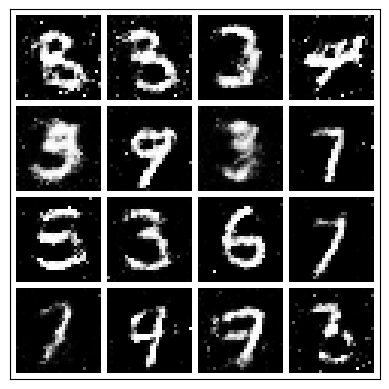

-------------------------------------
                Epoch 29:
                Step: 2500 |
                D_real Loss: 0.5639 |
                D_fake Loss: 0.5152 |
                D_total Loss: 1.0791 |
                G_Loss: 0.846 |
                Real_score 0.617 |
                Fake_score 0.381
            


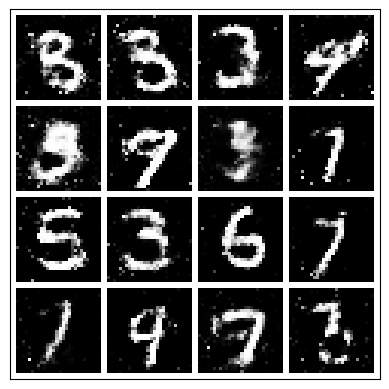

-------------------------------------
                Epoch 29:
                Step: 3000 |
                D_real Loss: 0.5327 |
                D_fake Loss: 0.5356 |
                D_total Loss: 1.0683 |
                G_Loss: 0.895 |
                Real_score 0.646 |
                Fake_score 0.385
            


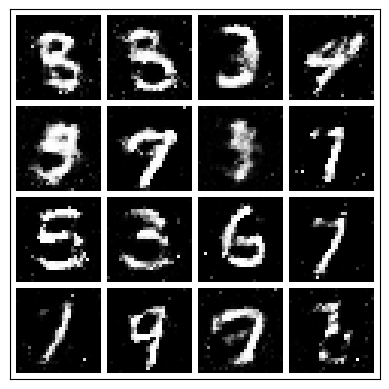

-------------------------------------
                Epoch 29:
                Step: 3500 |
                D_real Loss: 0.5872 |
                D_fake Loss: 0.4621 |
                D_total Loss: 1.0493 |
                G_Loss: 1.274 |
                Real_score 0.640 |
                Fake_score 0.354
            


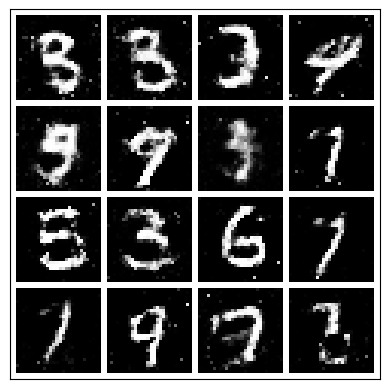

 58%|█████▊    | 29/50 [34:00<27:04, 77.34s/it]

-------------------------------------
                Epoch 30:
                Step: 0 |
                D_real Loss: 0.5030 |
                D_fake Loss: 0.7188 |
                D_total Loss: 1.2218 |
                G_Loss: 0.935 |
                Real_score 0.629 |
                Fake_score 0.452
            


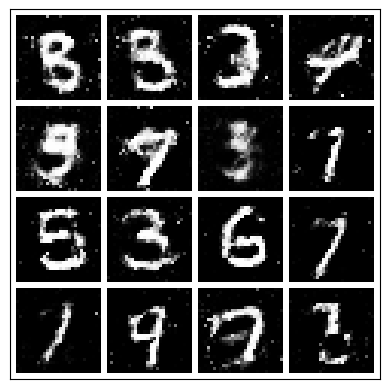

-------------------------------------
                Epoch 30:
                Step: 500 |
                D_real Loss: 0.3653 |
                D_fake Loss: 0.5987 |
                D_total Loss: 0.9640 |
                G_Loss: 1.066 |
                Real_score 0.725 |
                Fake_score 0.391
            


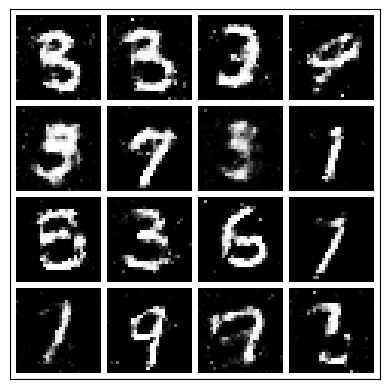

-------------------------------------
                Epoch 30:
                Step: 1000 |
                D_real Loss: 0.4787 |
                D_fake Loss: 0.7548 |
                D_total Loss: 1.2335 |
                G_Loss: 0.838 |
                Real_score 0.660 |
                Fake_score 0.488
            


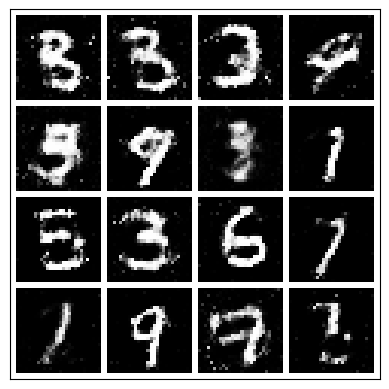

-------------------------------------
                Epoch 30:
                Step: 1500 |
                D_real Loss: 0.4277 |
                D_fake Loss: 0.5649 |
                D_total Loss: 0.9926 |
                G_Loss: 1.200 |
                Real_score 0.722 |
                Fake_score 0.382
            


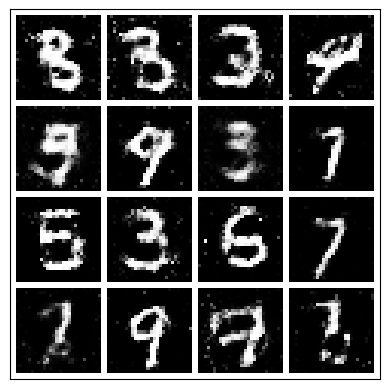

-------------------------------------
                Epoch 30:
                Step: 2000 |
                D_real Loss: 0.5996 |
                D_fake Loss: 0.4764 |
                D_total Loss: 1.0760 |
                G_Loss: 1.085 |
                Real_score 0.624 |
                Fake_score 0.359
            


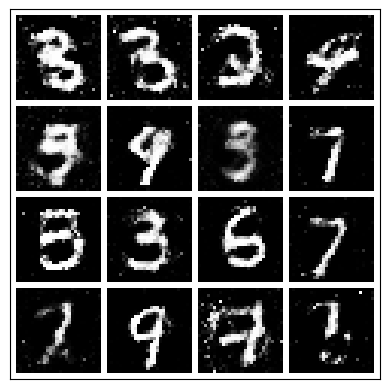

-------------------------------------
                Epoch 30:
                Step: 2500 |
                D_real Loss: 0.5498 |
                D_fake Loss: 0.5722 |
                D_total Loss: 1.1220 |
                G_Loss: 1.252 |
                Real_score 0.634 |
                Fake_score 0.399
            


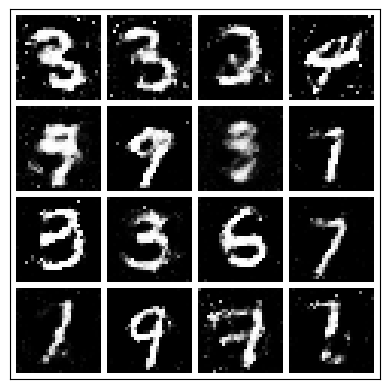

-------------------------------------
                Epoch 30:
                Step: 3000 |
                D_real Loss: 0.6249 |
                D_fake Loss: 0.6992 |
                D_total Loss: 1.3241 |
                G_Loss: 1.073 |
                Real_score 0.586 |
                Fake_score 0.412
            


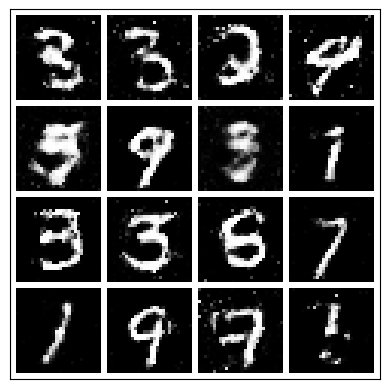

-------------------------------------
                Epoch 30:
                Step: 3500 |
                D_real Loss: 0.6756 |
                D_fake Loss: 0.4995 |
                D_total Loss: 1.1751 |
                G_Loss: 0.817 |
                Real_score 0.602 |
                Fake_score 0.319
            


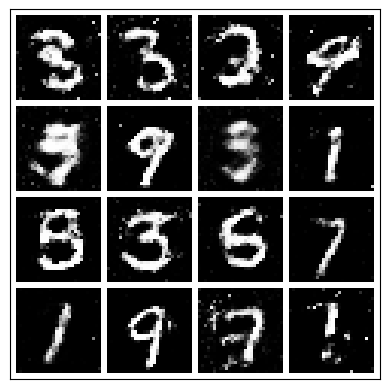

 60%|██████    | 30/50 [35:17<25:45, 77.25s/it]

-------------------------------------
                Epoch 31:
                Step: 0 |
                D_real Loss: 0.9162 |
                D_fake Loss: 0.4627 |
                D_total Loss: 1.3789 |
                G_Loss: 1.298 |
                Real_score 0.456 |
                Fake_score 0.354
            


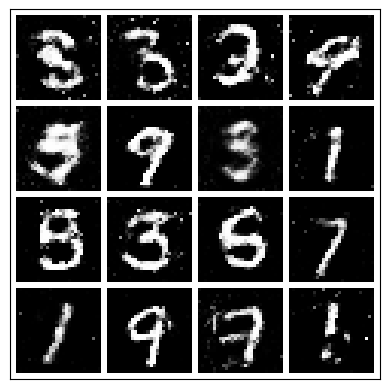

-------------------------------------
                Epoch 31:
                Step: 500 |
                D_real Loss: 0.7575 |
                D_fake Loss: 0.5533 |
                D_total Loss: 1.3108 |
                G_Loss: 1.025 |
                Real_score 0.545 |
                Fake_score 0.383
            


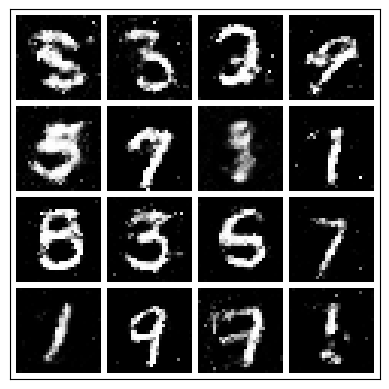

-------------------------------------
                Epoch 31:
                Step: 1000 |
                D_real Loss: 0.4702 |
                D_fake Loss: 0.6110 |
                D_total Loss: 1.0811 |
                G_Loss: 1.138 |
                Real_score 0.675 |
                Fake_score 0.433
            


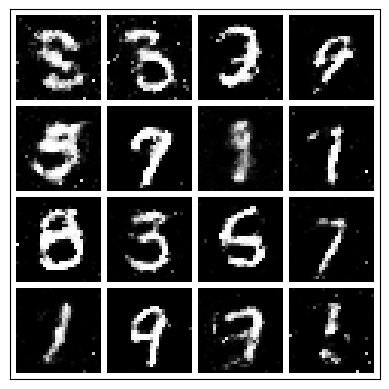

-------------------------------------
                Epoch 31:
                Step: 1500 |
                D_real Loss: 0.5138 |
                D_fake Loss: 0.5173 |
                D_total Loss: 1.0311 |
                G_Loss: 1.188 |
                Real_score 0.664 |
                Fake_score 0.344
            


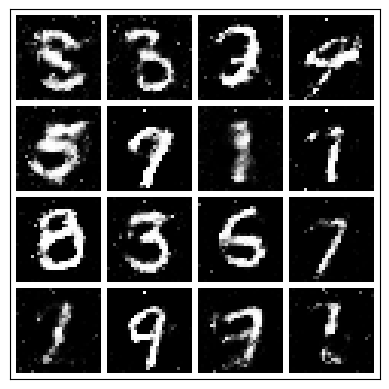

-------------------------------------
                Epoch 31:
                Step: 2000 |
                D_real Loss: 0.5887 |
                D_fake Loss: 0.4978 |
                D_total Loss: 1.0865 |
                G_Loss: 0.963 |
                Real_score 0.629 |
                Fake_score 0.373
            


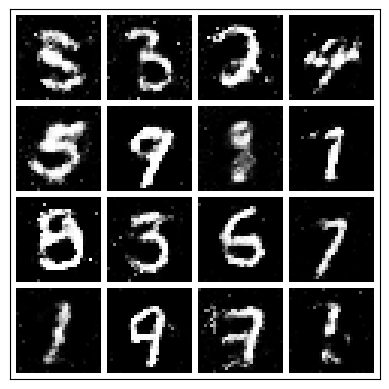

-------------------------------------
                Epoch 31:
                Step: 2500 |
                D_real Loss: 0.5978 |
                D_fake Loss: 0.4108 |
                D_total Loss: 1.0086 |
                G_Loss: 1.203 |
                Real_score 0.607 |
                Fake_score 0.310
            


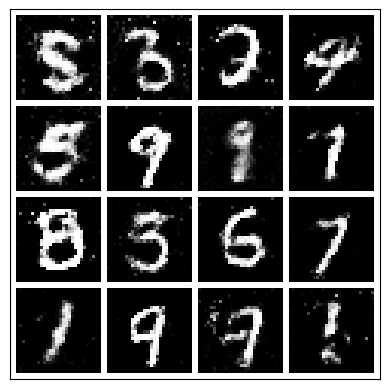

-------------------------------------
                Epoch 31:
                Step: 3000 |
                D_real Loss: 0.3675 |
                D_fake Loss: 0.5423 |
                D_total Loss: 0.9098 |
                G_Loss: 1.157 |
                Real_score 0.727 |
                Fake_score 0.404
            


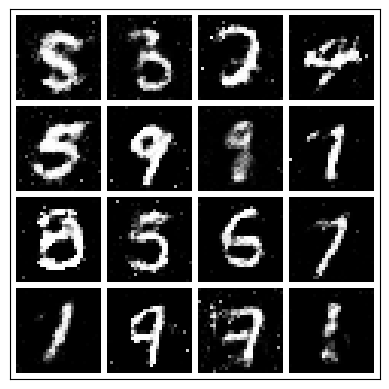

-------------------------------------
                Epoch 31:
                Step: 3500 |
                D_real Loss: 0.6632 |
                D_fake Loss: 0.4788 |
                D_total Loss: 1.1419 |
                G_Loss: 1.078 |
                Real_score 0.548 |
                Fake_score 0.359
            


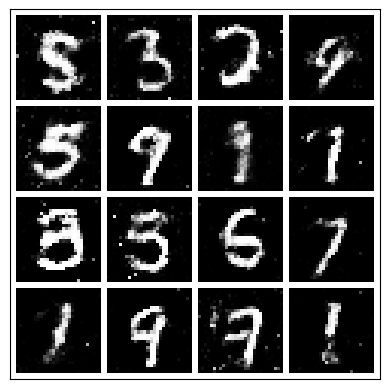

 62%|██████▏   | 31/50 [36:34<24:24, 77.05s/it]

-------------------------------------
                Epoch 32:
                Step: 0 |
                D_real Loss: 0.6888 |
                D_fake Loss: 0.4577 |
                D_total Loss: 1.1465 |
                G_Loss: 0.917 |
                Real_score 0.540 |
                Fake_score 0.355
            


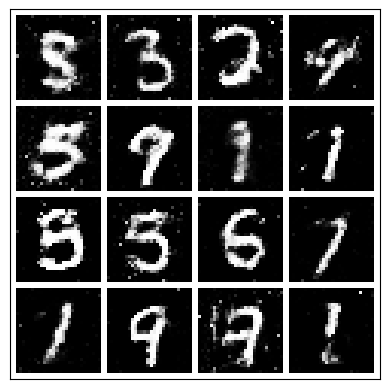

-------------------------------------
                Epoch 32:
                Step: 500 |
                D_real Loss: 0.7006 |
                D_fake Loss: 0.5335 |
                D_total Loss: 1.2341 |
                G_Loss: 0.919 |
                Real_score 0.560 |
                Fake_score 0.389
            


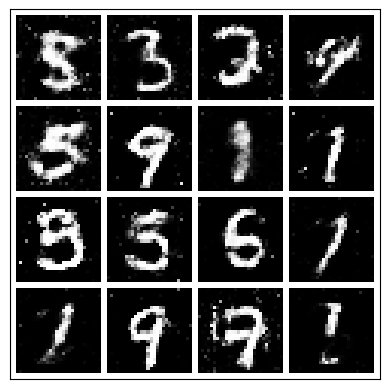

-------------------------------------
                Epoch 32:
                Step: 1000 |
                D_real Loss: 0.6905 |
                D_fake Loss: 0.5502 |
                D_total Loss: 1.2407 |
                G_Loss: 1.259 |
                Real_score 0.588 |
                Fake_score 0.326
            


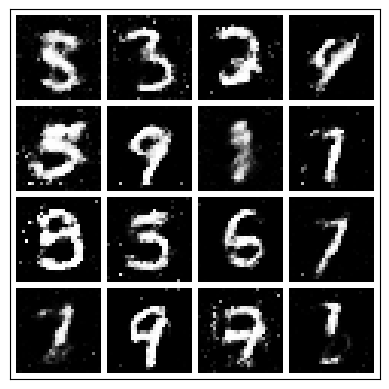

-------------------------------------
                Epoch 32:
                Step: 1500 |
                D_real Loss: 0.6688 |
                D_fake Loss: 0.5390 |
                D_total Loss: 1.2078 |
                G_Loss: 0.924 |
                Real_score 0.571 |
                Fake_score 0.408
            


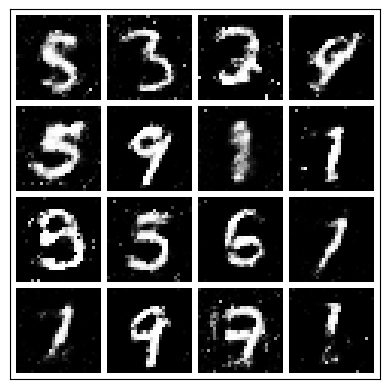

-------------------------------------
                Epoch 32:
                Step: 2000 |
                D_real Loss: 0.7879 |
                D_fake Loss: 0.4975 |
                D_total Loss: 1.2854 |
                G_Loss: 1.211 |
                Real_score 0.548 |
                Fake_score 0.340
            


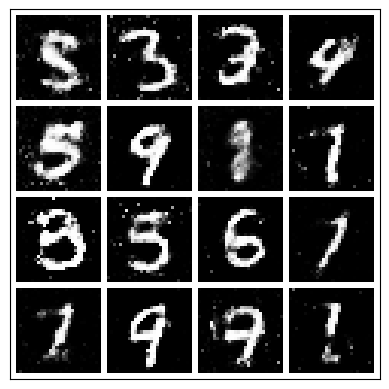

-------------------------------------
                Epoch 32:
                Step: 2500 |
                D_real Loss: 0.5263 |
                D_fake Loss: 0.4547 |
                D_total Loss: 0.9810 |
                G_Loss: 1.549 |
                Real_score 0.638 |
                Fake_score 0.340
            


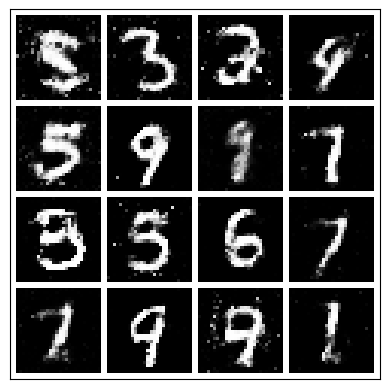

-------------------------------------
                Epoch 32:
                Step: 3000 |
                D_real Loss: 0.5399 |
                D_fake Loss: 0.6907 |
                D_total Loss: 1.2306 |
                G_Loss: 1.161 |
                Real_score 0.610 |
                Fake_score 0.459
            


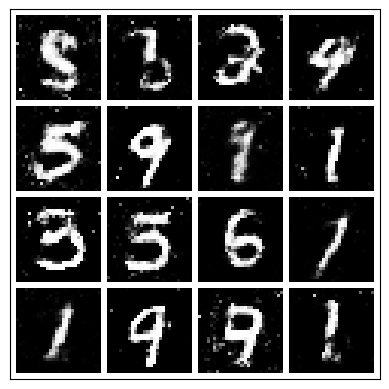

-------------------------------------
                Epoch 32:
                Step: 3500 |
                D_real Loss: 0.5559 |
                D_fake Loss: 0.4080 |
                D_total Loss: 0.9639 |
                G_Loss: 1.278 |
                Real_score 0.664 |
                Fake_score 0.306
            


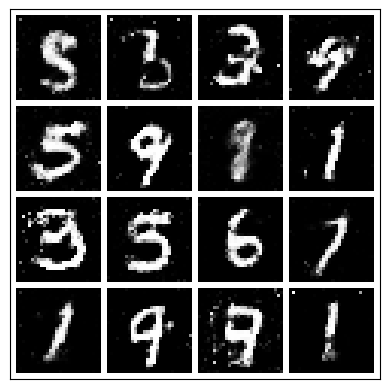

 64%|██████▍   | 32/50 [37:51<23:08, 77.13s/it]

-------------------------------------
                Epoch 33:
                Step: 0 |
                D_real Loss: 0.5797 |
                D_fake Loss: 0.5977 |
                D_total Loss: 1.1774 |
                G_Loss: 1.168 |
                Real_score 0.626 |
                Fake_score 0.353
            


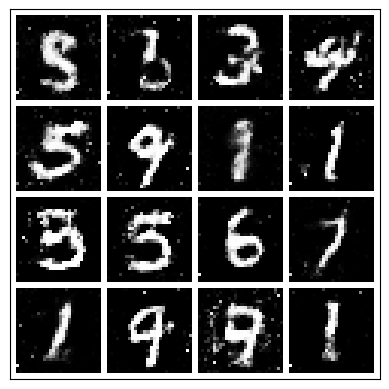

-------------------------------------
                Epoch 33:
                Step: 500 |
                D_real Loss: 0.5588 |
                D_fake Loss: 0.5444 |
                D_total Loss: 1.1031 |
                G_Loss: 1.346 |
                Real_score 0.610 |
                Fake_score 0.368
            


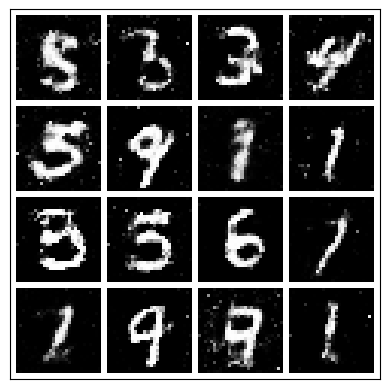

-------------------------------------
                Epoch 33:
                Step: 1000 |
                D_real Loss: 0.6674 |
                D_fake Loss: 0.4895 |
                D_total Loss: 1.1569 |
                G_Loss: 1.332 |
                Real_score 0.565 |
                Fake_score 0.363
            


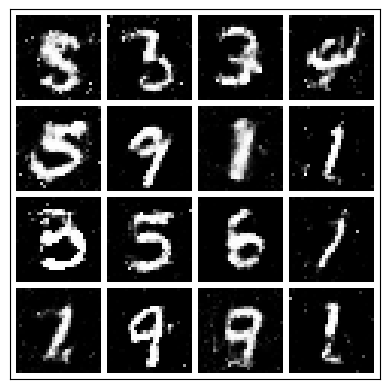

-------------------------------------
                Epoch 33:
                Step: 1500 |
                D_real Loss: 0.5517 |
                D_fake Loss: 0.4373 |
                D_total Loss: 0.9890 |
                G_Loss: 1.069 |
                Real_score 0.624 |
                Fake_score 0.344
            


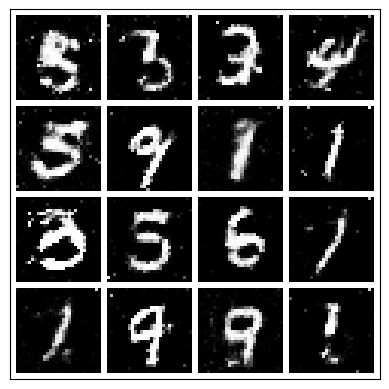

-------------------------------------
                Epoch 33:
                Step: 2000 |
                D_real Loss: 0.4103 |
                D_fake Loss: 0.5264 |
                D_total Loss: 0.9366 |
                G_Loss: 1.038 |
                Real_score 0.716 |
                Fake_score 0.379
            


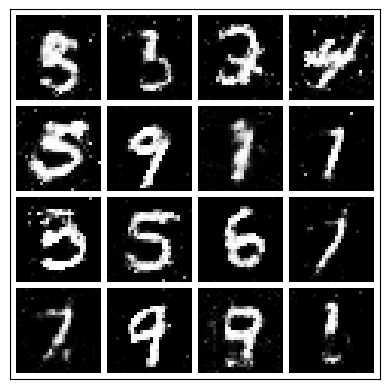

-------------------------------------
                Epoch 33:
                Step: 2500 |
                D_real Loss: 0.4442 |
                D_fake Loss: 0.4794 |
                D_total Loss: 0.9236 |
                G_Loss: 1.315 |
                Real_score 0.698 |
                Fake_score 0.346
            


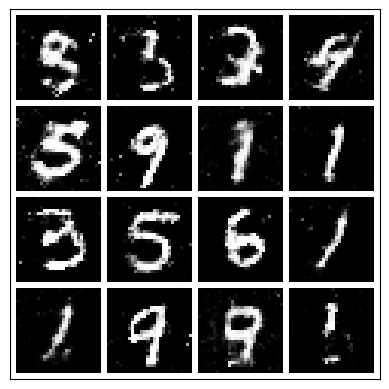

-------------------------------------
                Epoch 33:
                Step: 3000 |
                D_real Loss: 0.7594 |
                D_fake Loss: 0.6108 |
                D_total Loss: 1.3702 |
                G_Loss: 1.118 |
                Real_score 0.540 |
                Fake_score 0.398
            


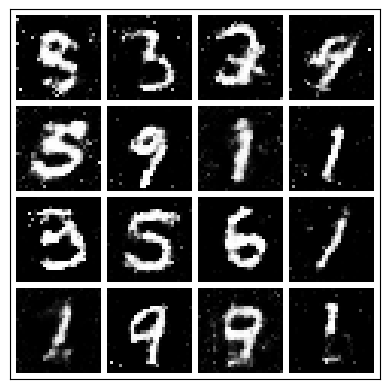

-------------------------------------
                Epoch 33:
                Step: 3500 |
                D_real Loss: 0.4797 |
                D_fake Loss: 0.4906 |
                D_total Loss: 0.9702 |
                G_Loss: 0.845 |
                Real_score 0.661 |
                Fake_score 0.370
            


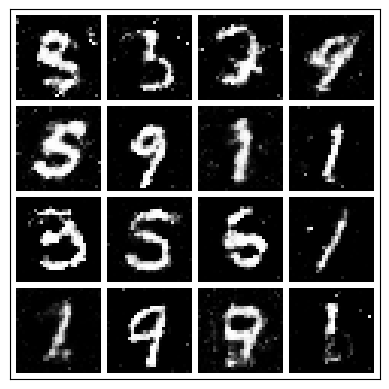

 66%|██████▌   | 33/50 [39:09<21:56, 77.44s/it]

-------------------------------------
                Epoch 34:
                Step: 0 |
                D_real Loss: 0.6910 |
                D_fake Loss: 0.4819 |
                D_total Loss: 1.1730 |
                G_Loss: 1.328 |
                Real_score 0.533 |
                Fake_score 0.343
            


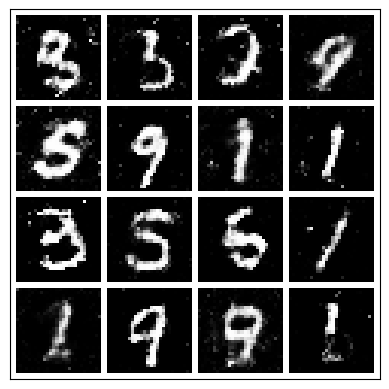

-------------------------------------
                Epoch 34:
                Step: 500 |
                D_real Loss: 0.5318 |
                D_fake Loss: 0.4945 |
                D_total Loss: 1.0263 |
                G_Loss: 0.996 |
                Real_score 0.626 |
                Fake_score 0.351
            


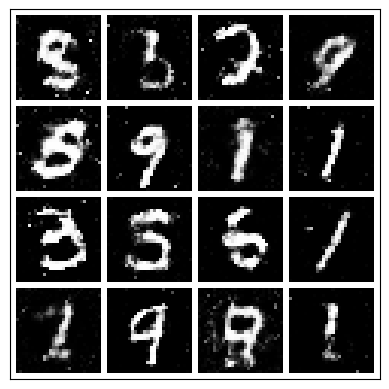

-------------------------------------
                Epoch 34:
                Step: 1000 |
                D_real Loss: 0.4305 |
                D_fake Loss: 0.4636 |
                D_total Loss: 0.8941 |
                G_Loss: 0.835 |
                Real_score 0.687 |
                Fake_score 0.356
            


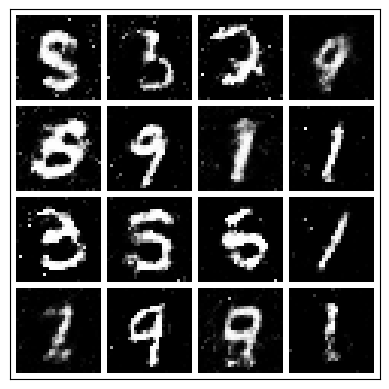

-------------------------------------
                Epoch 34:
                Step: 1500 |
                D_real Loss: 0.6116 |
                D_fake Loss: 0.6069 |
                D_total Loss: 1.2185 |
                G_Loss: 1.035 |
                Real_score 0.582 |
                Fake_score 0.402
            


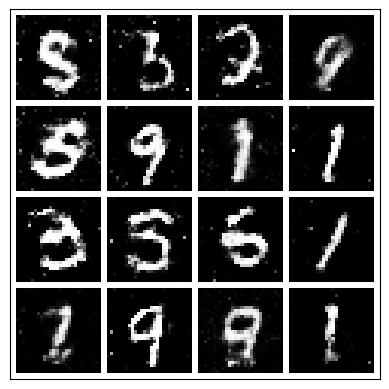

-------------------------------------
                Epoch 34:
                Step: 2000 |
                D_real Loss: 0.5075 |
                D_fake Loss: 0.4731 |
                D_total Loss: 0.9806 |
                G_Loss: 1.305 |
                Real_score 0.651 |
                Fake_score 0.328
            


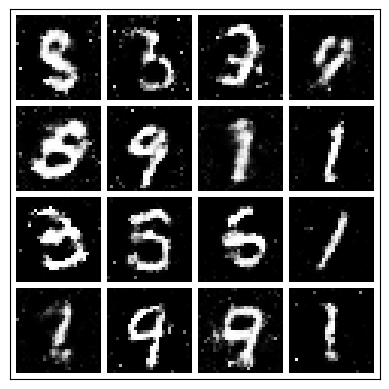

-------------------------------------
                Epoch 34:
                Step: 2500 |
                D_real Loss: 0.5467 |
                D_fake Loss: 0.5589 |
                D_total Loss: 1.1056 |
                G_Loss: 1.106 |
                Real_score 0.610 |
                Fake_score 0.378
            


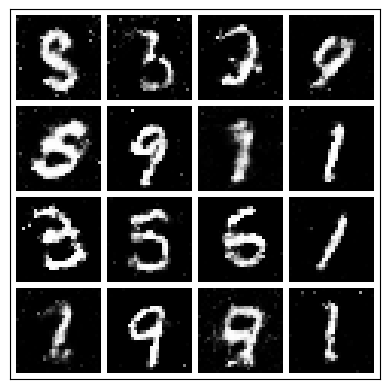

-------------------------------------
                Epoch 34:
                Step: 3000 |
                D_real Loss: 0.6039 |
                D_fake Loss: 0.5818 |
                D_total Loss: 1.1857 |
                G_Loss: 1.028 |
                Real_score 0.589 |
                Fake_score 0.412
            


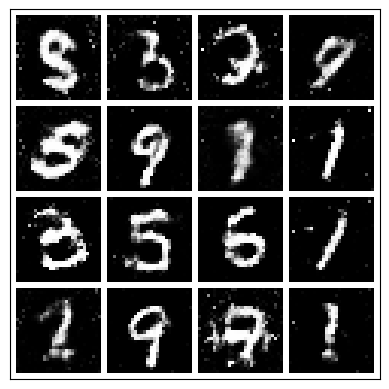

-------------------------------------
                Epoch 34:
                Step: 3500 |
                D_real Loss: 0.4162 |
                D_fake Loss: 0.5053 |
                D_total Loss: 0.9215 |
                G_Loss: 1.358 |
                Real_score 0.690 |
                Fake_score 0.363
            


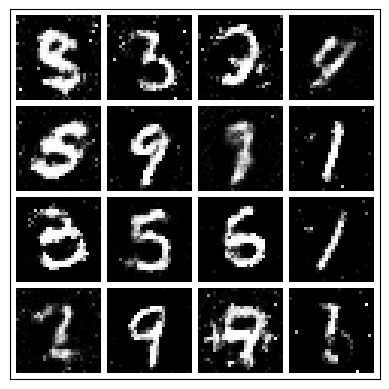

 68%|██████▊   | 34/50 [40:26<20:35, 77.23s/it]

-------------------------------------
                Epoch 35:
                Step: 0 |
                D_real Loss: 0.5092 |
                D_fake Loss: 0.4325 |
                D_total Loss: 0.9417 |
                G_Loss: 1.128 |
                Real_score 0.639 |
                Fake_score 0.335
            


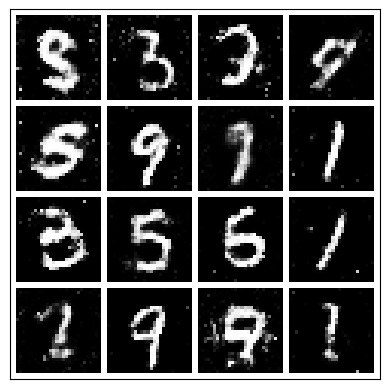

-------------------------------------
                Epoch 35:
                Step: 500 |
                D_real Loss: 0.6603 |
                D_fake Loss: 0.6836 |
                D_total Loss: 1.3439 |
                G_Loss: 0.875 |
                Real_score 0.621 |
                Fake_score 0.476
            


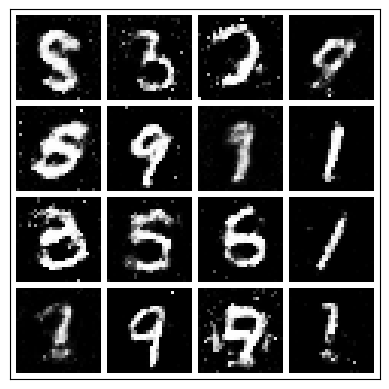

-------------------------------------
                Epoch 35:
                Step: 1000 |
                D_real Loss: 0.7170 |
                D_fake Loss: 0.3998 |
                D_total Loss: 1.1168 |
                G_Loss: 1.173 |
                Real_score 0.558 |
                Fake_score 0.320
            


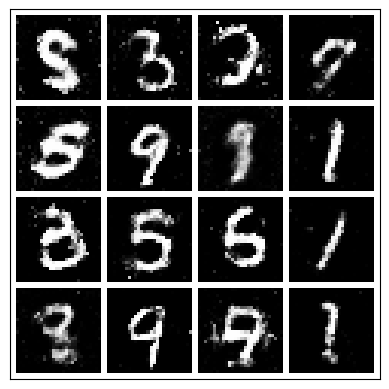

-------------------------------------
                Epoch 35:
                Step: 1500 |
                D_real Loss: 0.6666 |
                D_fake Loss: 0.7747 |
                D_total Loss: 1.4413 |
                G_Loss: 1.133 |
                Real_score 0.560 |
                Fake_score 0.409
            


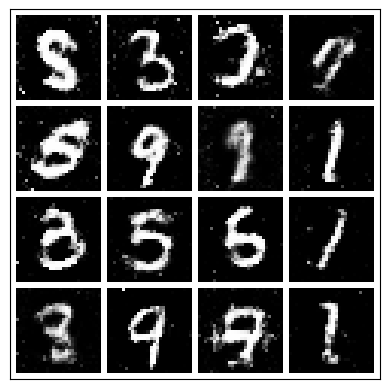

-------------------------------------
                Epoch 35:
                Step: 2000 |
                D_real Loss: 0.4653 |
                D_fake Loss: 0.6699 |
                D_total Loss: 1.1351 |
                G_Loss: 0.955 |
                Real_score 0.688 |
                Fake_score 0.451
            


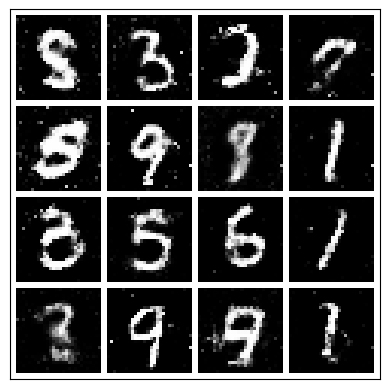

-------------------------------------
                Epoch 35:
                Step: 2500 |
                D_real Loss: 0.5579 |
                D_fake Loss: 0.5384 |
                D_total Loss: 1.0963 |
                G_Loss: 1.467 |
                Real_score 0.644 |
                Fake_score 0.359
            


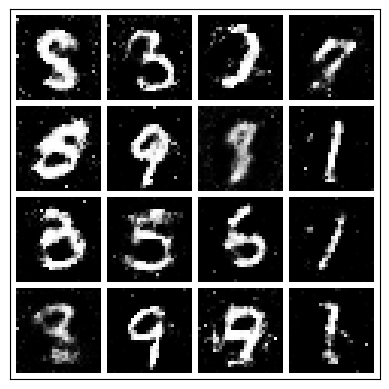

-------------------------------------
                Epoch 35:
                Step: 3000 |
                D_real Loss: 0.4975 |
                D_fake Loss: 0.6172 |
                D_total Loss: 1.1147 |
                G_Loss: 0.929 |
                Real_score 0.659 |
                Fake_score 0.450
            


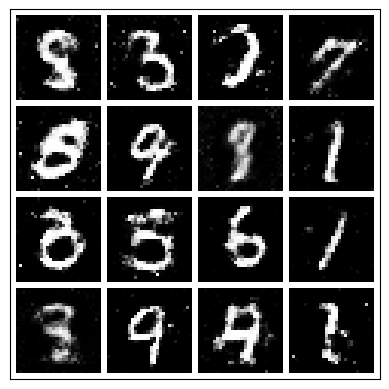

-------------------------------------
                Epoch 35:
                Step: 3500 |
                D_real Loss: 0.5884 |
                D_fake Loss: 0.5028 |
                D_total Loss: 1.0911 |
                G_Loss: 1.050 |
                Real_score 0.620 |
                Fake_score 0.347
            


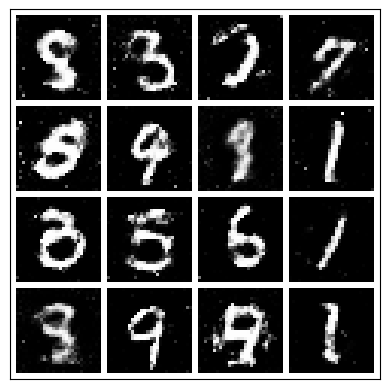

 70%|███████   | 35/50 [41:43<19:16, 77.09s/it]

-------------------------------------
                Epoch 36:
                Step: 0 |
                D_real Loss: 0.4553 |
                D_fake Loss: 0.3822 |
                D_total Loss: 0.8375 |
                G_Loss: 1.195 |
                Real_score 0.665 |
                Fake_score 0.297
            


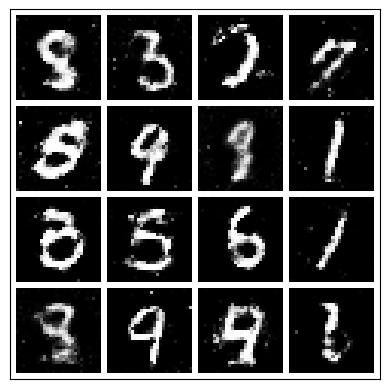

-------------------------------------
                Epoch 36:
                Step: 500 |
                D_real Loss: 0.4700 |
                D_fake Loss: 0.8415 |
                D_total Loss: 1.3114 |
                G_Loss: 1.027 |
                Real_score 0.668 |
                Fake_score 0.466
            


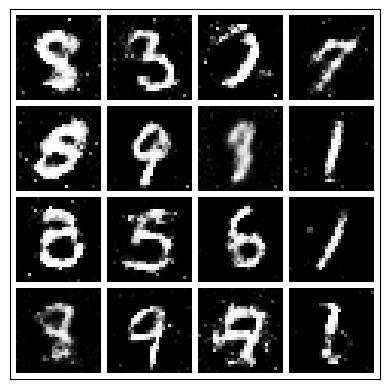

-------------------------------------
                Epoch 36:
                Step: 1000 |
                D_real Loss: 0.5375 |
                D_fake Loss: 0.5748 |
                D_total Loss: 1.1123 |
                G_Loss: 1.063 |
                Real_score 0.618 |
                Fake_score 0.406
            


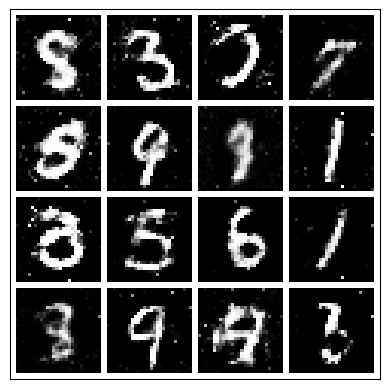

-------------------------------------
                Epoch 36:
                Step: 1500 |
                D_real Loss: 0.6540 |
                D_fake Loss: 0.3816 |
                D_total Loss: 1.0356 |
                G_Loss: 1.295 |
                Real_score 0.556 |
                Fake_score 0.312
            


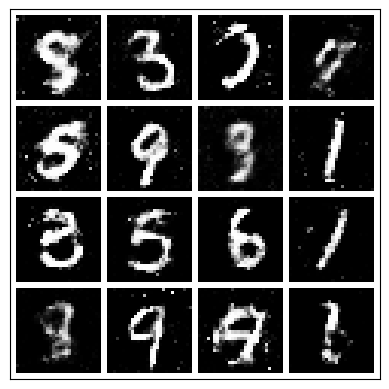

-------------------------------------
                Epoch 36:
                Step: 2000 |
                D_real Loss: 0.6456 |
                D_fake Loss: 0.5191 |
                D_total Loss: 1.1647 |
                G_Loss: 0.906 |
                Real_score 0.567 |
                Fake_score 0.385
            


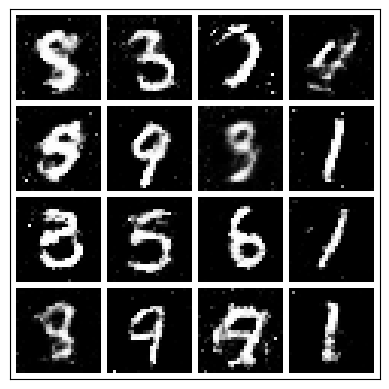

-------------------------------------
                Epoch 36:
                Step: 2500 |
                D_real Loss: 0.8783 |
                D_fake Loss: 0.4248 |
                D_total Loss: 1.3030 |
                G_Loss: 1.140 |
                Real_score 0.472 |
                Fake_score 0.327
            


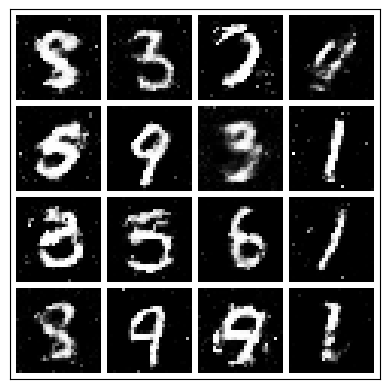

-------------------------------------
                Epoch 36:
                Step: 3000 |
                D_real Loss: 0.4699 |
                D_fake Loss: 0.6258 |
                D_total Loss: 1.0957 |
                G_Loss: 1.039 |
                Real_score 0.664 |
                Fake_score 0.437
            


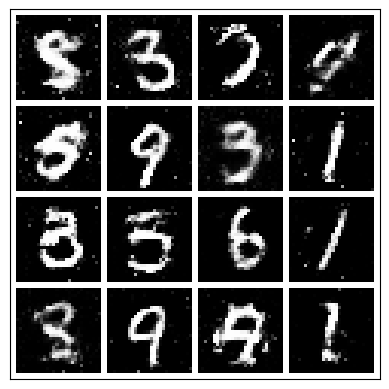

-------------------------------------
                Epoch 36:
                Step: 3500 |
                D_real Loss: 0.6788 |
                D_fake Loss: 0.3788 |
                D_total Loss: 1.0576 |
                G_Loss: 1.181 |
                Real_score 0.541 |
                Fake_score 0.287
            


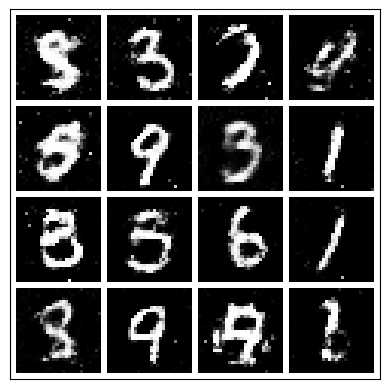

 72%|███████▏  | 36/50 [43:01<18:04, 77.45s/it]

-------------------------------------
                Epoch 37:
                Step: 0 |
                D_real Loss: 0.4882 |
                D_fake Loss: 0.8562 |
                D_total Loss: 1.3444 |
                G_Loss: 0.993 |
                Real_score 0.664 |
                Fake_score 0.500
            


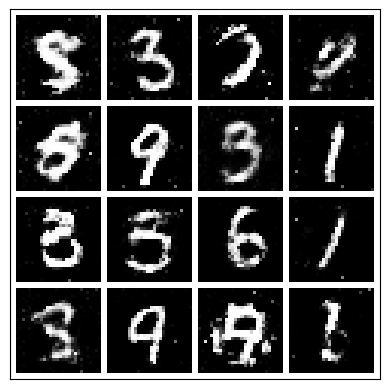

-------------------------------------
                Epoch 37:
                Step: 500 |
                D_real Loss: 0.5717 |
                D_fake Loss: 0.5310 |
                D_total Loss: 1.1028 |
                G_Loss: 1.188 |
                Real_score 0.600 |
                Fake_score 0.390
            


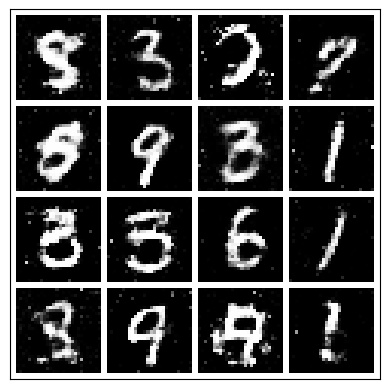

-------------------------------------
                Epoch 37:
                Step: 1000 |
                D_real Loss: 0.5885 |
                D_fake Loss: 0.4444 |
                D_total Loss: 1.0329 |
                G_Loss: 1.356 |
                Real_score 0.616 |
                Fake_score 0.334
            


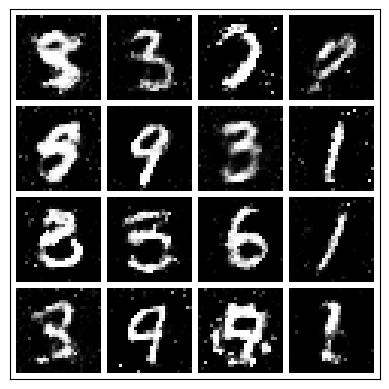

-------------------------------------
                Epoch 37:
                Step: 1500 |
                D_real Loss: 0.3732 |
                D_fake Loss: 0.7279 |
                D_total Loss: 1.1011 |
                G_Loss: 1.113 |
                Real_score 0.717 |
                Fake_score 0.470
            


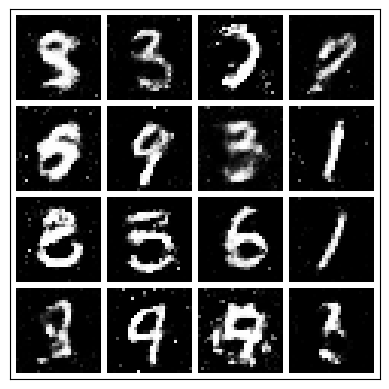

-------------------------------------
                Epoch 37:
                Step: 2000 |
                D_real Loss: 0.6724 |
                D_fake Loss: 0.4370 |
                D_total Loss: 1.1094 |
                G_Loss: 1.146 |
                Real_score 0.566 |
                Fake_score 0.317
            


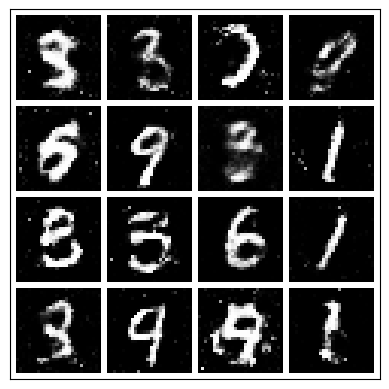

-------------------------------------
                Epoch 37:
                Step: 2500 |
                D_real Loss: 0.4888 |
                D_fake Loss: 0.5005 |
                D_total Loss: 0.9893 |
                G_Loss: 0.965 |
                Real_score 0.655 |
                Fake_score 0.369
            


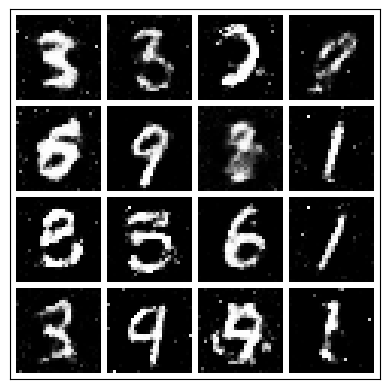

-------------------------------------
                Epoch 37:
                Step: 3000 |
                D_real Loss: 0.4689 |
                D_fake Loss: 0.7259 |
                D_total Loss: 1.1948 |
                G_Loss: 1.011 |
                Real_score 0.660 |
                Fake_score 0.409
            


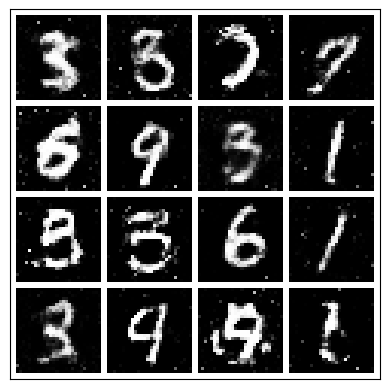

-------------------------------------
                Epoch 37:
                Step: 3500 |
                D_real Loss: 0.5019 |
                D_fake Loss: 0.4616 |
                D_total Loss: 0.9635 |
                G_Loss: 0.982 |
                Real_score 0.659 |
                Fake_score 0.348
            


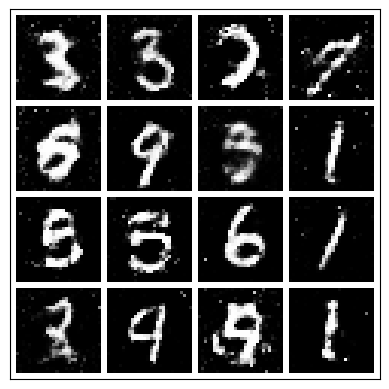

 74%|███████▍  | 37/50 [44:20<16:53, 77.95s/it]

-------------------------------------
                Epoch 38:
                Step: 0 |
                D_real Loss: 0.5750 |
                D_fake Loss: 0.7212 |
                D_total Loss: 1.2962 |
                G_Loss: 0.838 |
                Real_score 0.593 |
                Fake_score 0.472
            


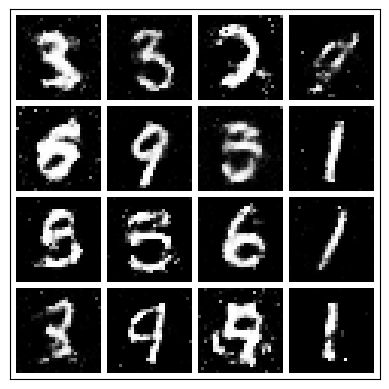

-------------------------------------
                Epoch 38:
                Step: 500 |
                D_real Loss: 0.6705 |
                D_fake Loss: 0.4922 |
                D_total Loss: 1.1626 |
                G_Loss: 0.869 |
                Real_score 0.572 |
                Fake_score 0.342
            


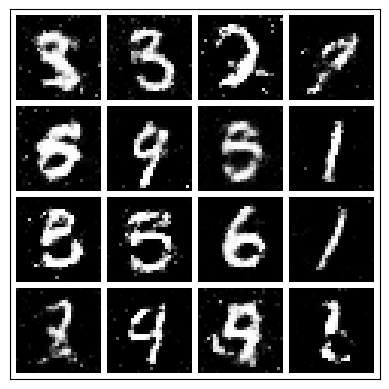

-------------------------------------
                Epoch 38:
                Step: 1000 |
                D_real Loss: 0.5586 |
                D_fake Loss: 0.6331 |
                D_total Loss: 1.1917 |
                G_Loss: 1.222 |
                Real_score 0.630 |
                Fake_score 0.414
            


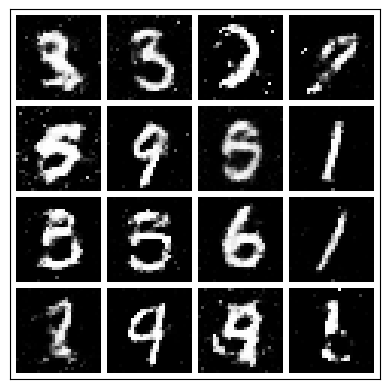

-------------------------------------
                Epoch 38:
                Step: 1500 |
                D_real Loss: 0.4752 |
                D_fake Loss: 0.4539 |
                D_total Loss: 0.9291 |
                G_Loss: 1.251 |
                Real_score 0.655 |
                Fake_score 0.353
            


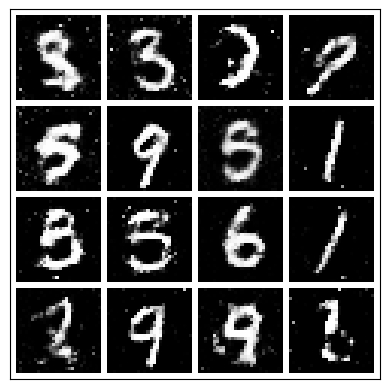

-------------------------------------
                Epoch 38:
                Step: 2000 |
                D_real Loss: 0.7046 |
                D_fake Loss: 0.6112 |
                D_total Loss: 1.3158 |
                G_Loss: 1.011 |
                Real_score 0.557 |
                Fake_score 0.396
            


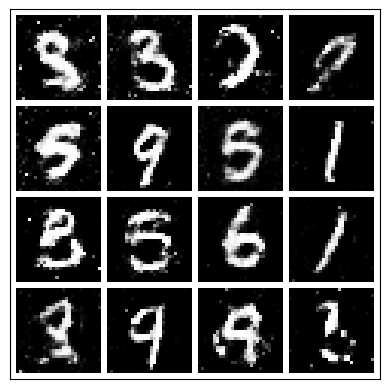

-------------------------------------
                Epoch 38:
                Step: 2500 |
                D_real Loss: 0.3680 |
                D_fake Loss: 0.6175 |
                D_total Loss: 0.9855 |
                G_Loss: 0.855 |
                Real_score 0.707 |
                Fake_score 0.433
            


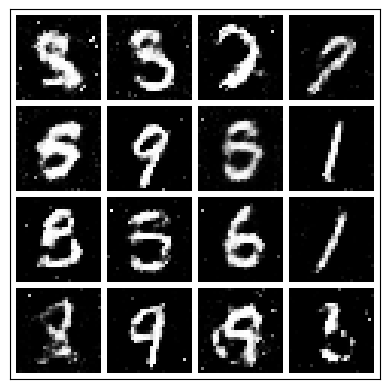

-------------------------------------
                Epoch 38:
                Step: 3000 |
                D_real Loss: 0.4902 |
                D_fake Loss: 0.5094 |
                D_total Loss: 0.9996 |
                G_Loss: 1.105 |
                Real_score 0.685 |
                Fake_score 0.373
            


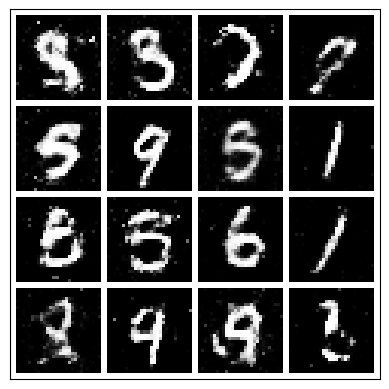

-------------------------------------
                Epoch 38:
                Step: 3500 |
                D_real Loss: 0.4857 |
                D_fake Loss: 0.6919 |
                D_total Loss: 1.1776 |
                G_Loss: 1.014 |
                Real_score 0.642 |
                Fake_score 0.452
            


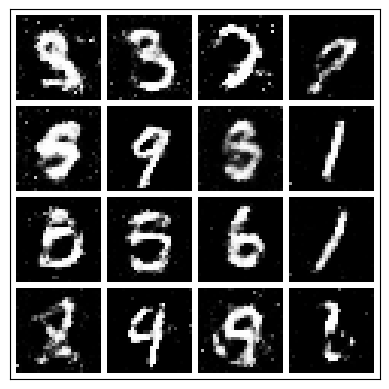

 76%|███████▌  | 38/50 [45:38<15:34, 77.89s/it]

-------------------------------------
                Epoch 39:
                Step: 0 |
                D_real Loss: 0.5220 |
                D_fake Loss: 0.5152 |
                D_total Loss: 1.0372 |
                G_Loss: 0.839 |
                Real_score 0.635 |
                Fake_score 0.372
            


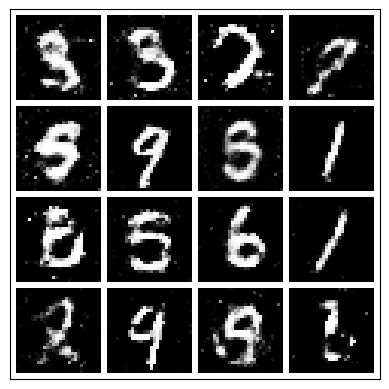

-------------------------------------
                Epoch 39:
                Step: 500 |
                D_real Loss: 0.4983 |
                D_fake Loss: 0.3209 |
                D_total Loss: 0.8192 |
                G_Loss: 1.186 |
                Real_score 0.653 |
                Fake_score 0.272
            


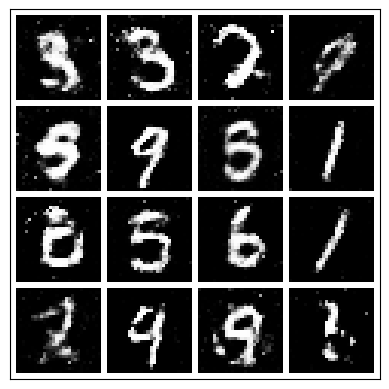

-------------------------------------
                Epoch 39:
                Step: 1000 |
                D_real Loss: 0.6855 |
                D_fake Loss: 0.4065 |
                D_total Loss: 1.0920 |
                G_Loss: 1.200 |
                Real_score 0.542 |
                Fake_score 0.323
            


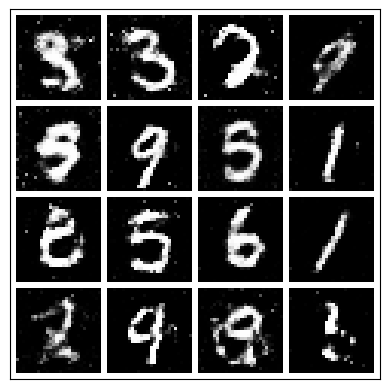

-------------------------------------
                Epoch 39:
                Step: 1500 |
                D_real Loss: 0.7615 |
                D_fake Loss: 0.5780 |
                D_total Loss: 1.3395 |
                G_Loss: 1.104 |
                Real_score 0.516 |
                Fake_score 0.412
            


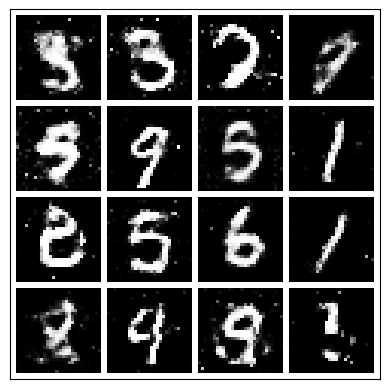

-------------------------------------
                Epoch 39:
                Step: 2000 |
                D_real Loss: 0.6756 |
                D_fake Loss: 0.5754 |
                D_total Loss: 1.2510 |
                G_Loss: 1.095 |
                Real_score 0.563 |
                Fake_score 0.402
            


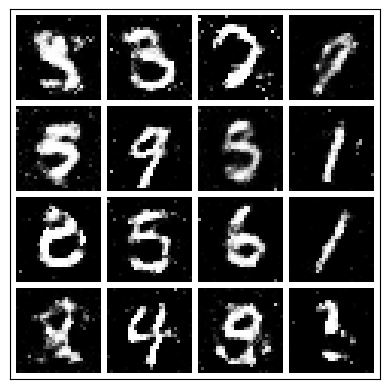

-------------------------------------
                Epoch 39:
                Step: 2500 |
                D_real Loss: 0.5924 |
                D_fake Loss: 0.7945 |
                D_total Loss: 1.3869 |
                G_Loss: 1.218 |
                Real_score 0.606 |
                Fake_score 0.476
            


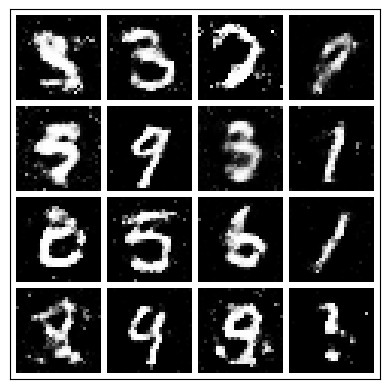

-------------------------------------
                Epoch 39:
                Step: 3000 |
                D_real Loss: 0.8003 |
                D_fake Loss: 0.5519 |
                D_total Loss: 1.3522 |
                G_Loss: 1.007 |
                Real_score 0.524 |
                Fake_score 0.402
            


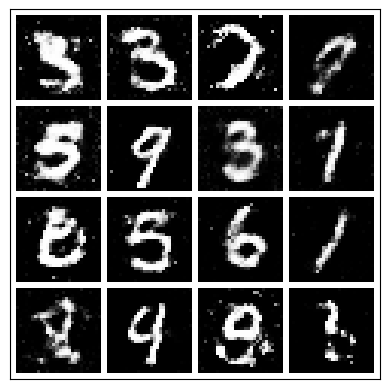

-------------------------------------
                Epoch 39:
                Step: 3500 |
                D_real Loss: 0.5786 |
                D_fake Loss: 0.5469 |
                D_total Loss: 1.1254 |
                G_Loss: 1.059 |
                Real_score 0.588 |
                Fake_score 0.396
            


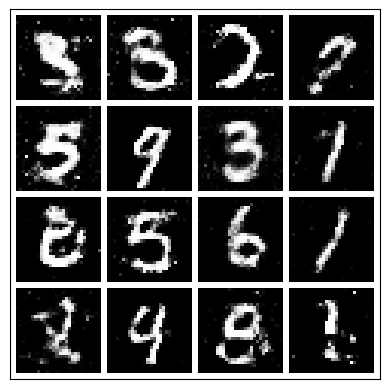

 78%|███████▊  | 39/50 [46:56<14:17, 77.94s/it]

-------------------------------------
                Epoch 40:
                Step: 0 |
                D_real Loss: 0.6085 |
                D_fake Loss: 0.4122 |
                D_total Loss: 1.0206 |
                G_Loss: 1.133 |
                Real_score 0.582 |
                Fake_score 0.316
            


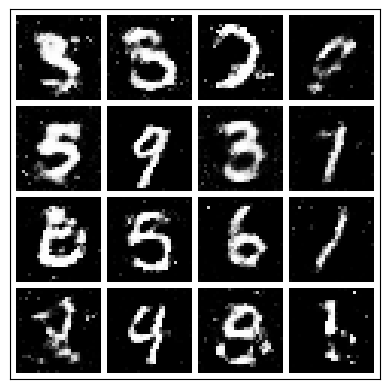

-------------------------------------
                Epoch 40:
                Step: 500 |
                D_real Loss: 0.7402 |
                D_fake Loss: 0.4451 |
                D_total Loss: 1.1853 |
                G_Loss: 1.017 |
                Real_score 0.557 |
                Fake_score 0.339
            


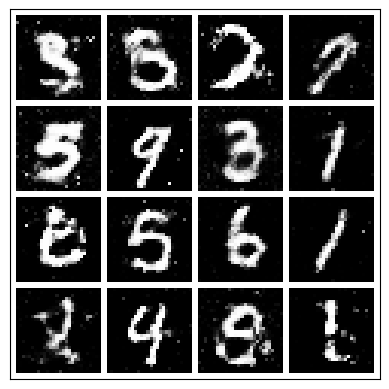

-------------------------------------
                Epoch 40:
                Step: 1000 |
                D_real Loss: 0.5562 |
                D_fake Loss: 0.5178 |
                D_total Loss: 1.0739 |
                G_Loss: 1.184 |
                Real_score 0.613 |
                Fake_score 0.374
            


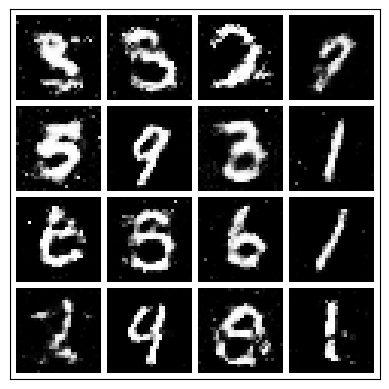

-------------------------------------
                Epoch 40:
                Step: 1500 |
                D_real Loss: 0.6094 |
                D_fake Loss: 0.5407 |
                D_total Loss: 1.1501 |
                G_Loss: 1.355 |
                Real_score 0.596 |
                Fake_score 0.356
            


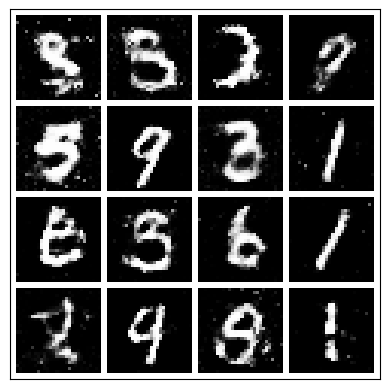

-------------------------------------
                Epoch 40:
                Step: 2000 |
                D_real Loss: 0.8534 |
                D_fake Loss: 0.4531 |
                D_total Loss: 1.3065 |
                G_Loss: 0.815 |
                Real_score 0.466 |
                Fake_score 0.341
            


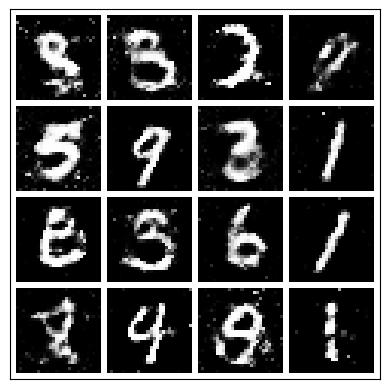

-------------------------------------
                Epoch 40:
                Step: 2500 |
                D_real Loss: 0.5483 |
                D_fake Loss: 0.6000 |
                D_total Loss: 1.1483 |
                G_Loss: 0.862 |
                Real_score 0.623 |
                Fake_score 0.422
            


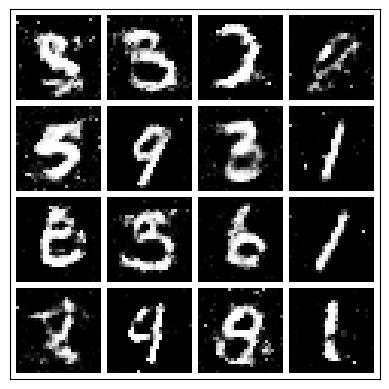

-------------------------------------
                Epoch 40:
                Step: 3000 |
                D_real Loss: 0.5049 |
                D_fake Loss: 0.8440 |
                D_total Loss: 1.3489 |
                G_Loss: 1.127 |
                Real_score 0.631 |
                Fake_score 0.518
            


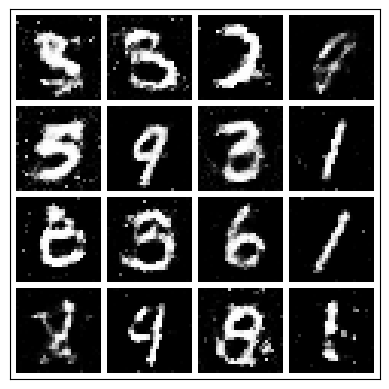

-------------------------------------
                Epoch 40:
                Step: 3500 |
                D_real Loss: 0.7183 |
                D_fake Loss: 0.5173 |
                D_total Loss: 1.2356 |
                G_Loss: 1.205 |
                Real_score 0.535 |
                Fake_score 0.378
            


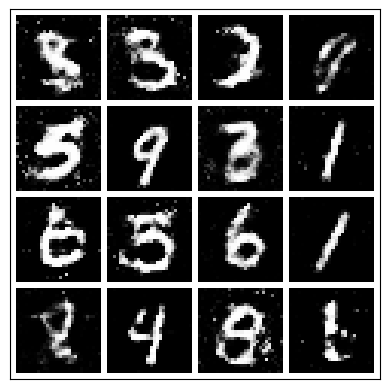

 80%|████████  | 40/50 [48:13<12:57, 77.75s/it]

-------------------------------------
                Epoch 41:
                Step: 0 |
                D_real Loss: 0.4815 |
                D_fake Loss: 0.5153 |
                D_total Loss: 0.9967 |
                G_Loss: 1.147 |
                Real_score 0.649 |
                Fake_score 0.379
            


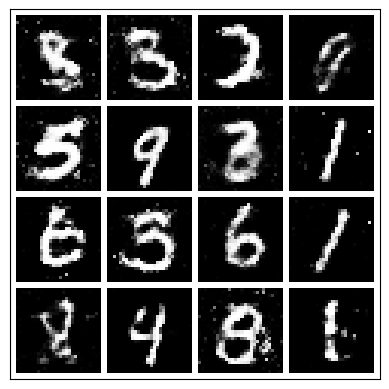

-------------------------------------
                Epoch 41:
                Step: 500 |
                D_real Loss: 0.4920 |
                D_fake Loss: 0.6052 |
                D_total Loss: 1.0972 |
                G_Loss: 0.952 |
                Real_score 0.677 |
                Fake_score 0.417
            


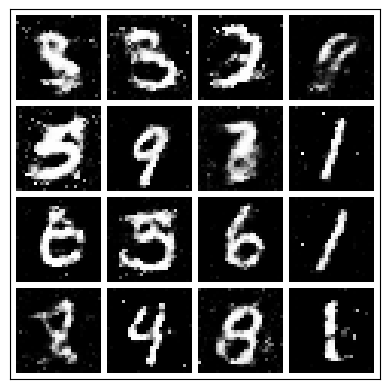

-------------------------------------
                Epoch 41:
                Step: 1000 |
                D_real Loss: 0.5758 |
                D_fake Loss: 0.5153 |
                D_total Loss: 1.0912 |
                G_Loss: 1.141 |
                Real_score 0.606 |
                Fake_score 0.376
            


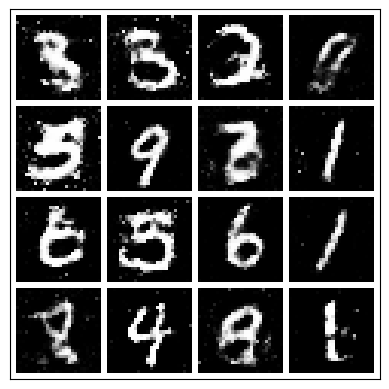

-------------------------------------
                Epoch 41:
                Step: 1500 |
                D_real Loss: 0.4768 |
                D_fake Loss: 0.5230 |
                D_total Loss: 0.9998 |
                G_Loss: 0.962 |
                Real_score 0.669 |
                Fake_score 0.385
            


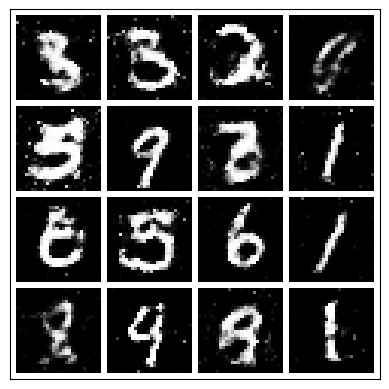

-------------------------------------
                Epoch 41:
                Step: 2000 |
                D_real Loss: 0.8847 |
                D_fake Loss: 0.6274 |
                D_total Loss: 1.5121 |
                G_Loss: 0.959 |
                Real_score 0.451 |
                Fake_score 0.414
            


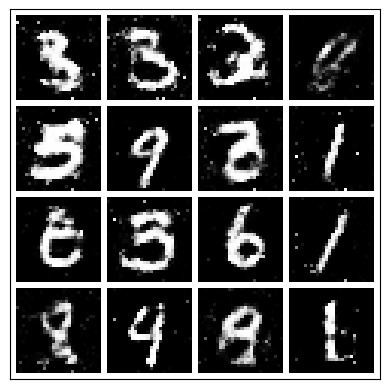

-------------------------------------
                Epoch 41:
                Step: 2500 |
                D_real Loss: 0.7009 |
                D_fake Loss: 0.5879 |
                D_total Loss: 1.2888 |
                G_Loss: 1.239 |
                Real_score 0.585 |
                Fake_score 0.390
            


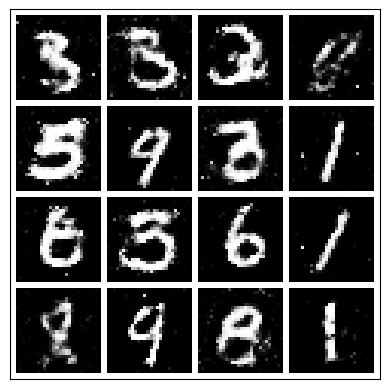

-------------------------------------
                Epoch 41:
                Step: 3000 |
                D_real Loss: 0.5363 |
                D_fake Loss: 0.6110 |
                D_total Loss: 1.1472 |
                G_Loss: 0.869 |
                Real_score 0.614 |
                Fake_score 0.444
            


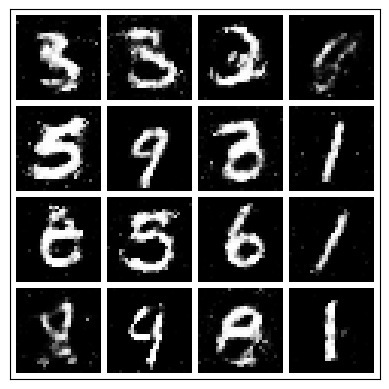

-------------------------------------
                Epoch 41:
                Step: 3500 |
                D_real Loss: 0.4843 |
                D_fake Loss: 0.6481 |
                D_total Loss: 1.1325 |
                G_Loss: 0.832 |
                Real_score 0.654 |
                Fake_score 0.430
            


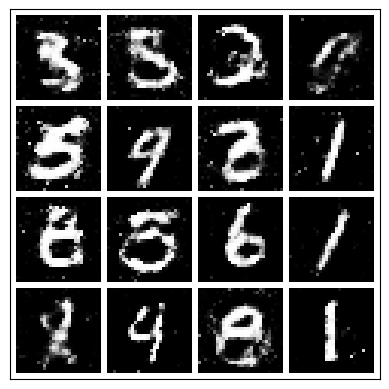

 82%|████████▏ | 41/50 [49:31<11:38, 77.63s/it]

-------------------------------------
                Epoch 42:
                Step: 0 |
                D_real Loss: 0.5641 |
                D_fake Loss: 0.8531 |
                D_total Loss: 1.4172 |
                G_Loss: 0.718 |
                Real_score 0.614 |
                Fake_score 0.502
            


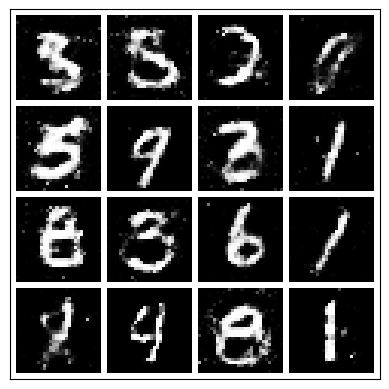

-------------------------------------
                Epoch 42:
                Step: 500 |
                D_real Loss: 0.5819 |
                D_fake Loss: 0.7877 |
                D_total Loss: 1.3696 |
                G_Loss: 0.876 |
                Real_score 0.591 |
                Fake_score 0.469
            


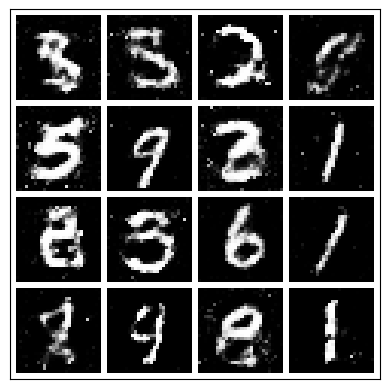

-------------------------------------
                Epoch 42:
                Step: 1000 |
                D_real Loss: 0.5508 |
                D_fake Loss: 0.6029 |
                D_total Loss: 1.1537 |
                G_Loss: 1.129 |
                Real_score 0.623 |
                Fake_score 0.409
            


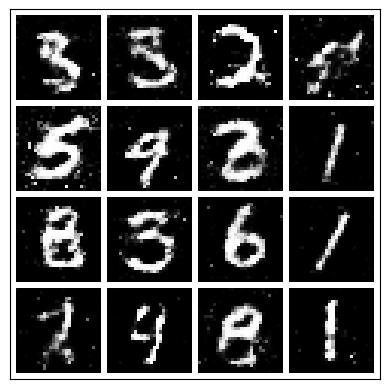

-------------------------------------
                Epoch 42:
                Step: 1500 |
                D_real Loss: 0.7266 |
                D_fake Loss: 0.7816 |
                D_total Loss: 1.5082 |
                G_Loss: 1.121 |
                Real_score 0.543 |
                Fake_score 0.457
            


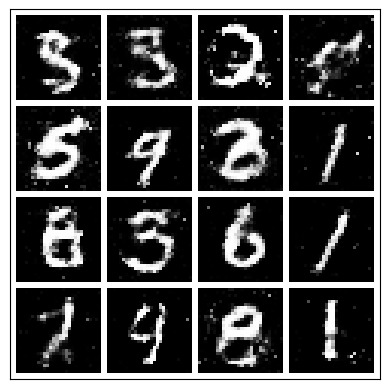

-------------------------------------
                Epoch 42:
                Step: 2000 |
                D_real Loss: 0.5144 |
                D_fake Loss: 0.6190 |
                D_total Loss: 1.1333 |
                G_Loss: 0.989 |
                Real_score 0.638 |
                Fake_score 0.412
            


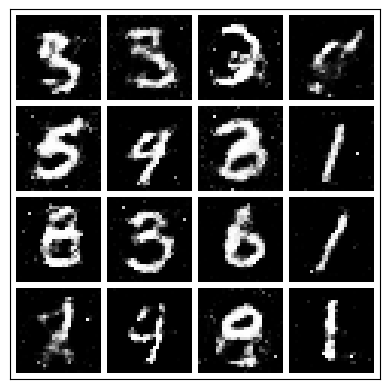

-------------------------------------
                Epoch 42:
                Step: 2500 |
                D_real Loss: 0.5907 |
                D_fake Loss: 0.5677 |
                D_total Loss: 1.1585 |
                G_Loss: 1.176 |
                Real_score 0.599 |
                Fake_score 0.393
            


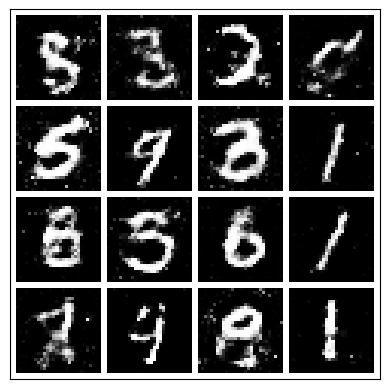

-------------------------------------
                Epoch 42:
                Step: 3000 |
                D_real Loss: 0.7434 |
                D_fake Loss: 0.4308 |
                D_total Loss: 1.1742 |
                G_Loss: 1.373 |
                Real_score 0.517 |
                Fake_score 0.330
            


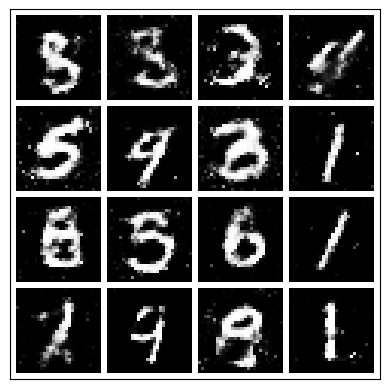

-------------------------------------
                Epoch 42:
                Step: 3500 |
                D_real Loss: 0.4661 |
                D_fake Loss: 0.7812 |
                D_total Loss: 1.2473 |
                G_Loss: 0.755 |
                Real_score 0.655 |
                Fake_score 0.497
            


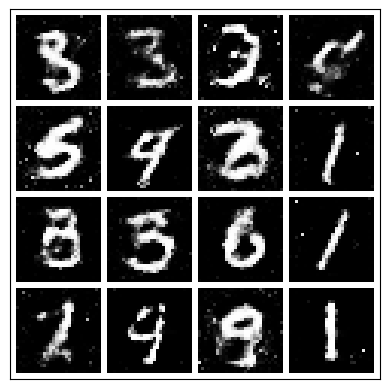

 84%|████████▍ | 42/50 [50:48<10:20, 77.54s/it]

-------------------------------------
                Epoch 43:
                Step: 0 |
                D_real Loss: 0.4433 |
                D_fake Loss: 0.4863 |
                D_total Loss: 0.9297 |
                G_Loss: 1.188 |
                Real_score 0.695 |
                Fake_score 0.358
            


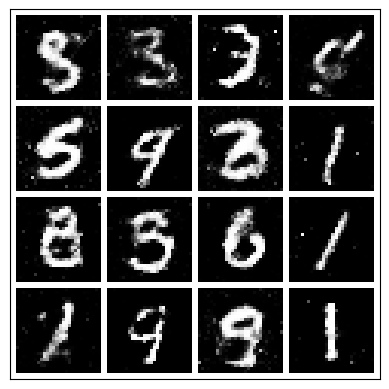

-------------------------------------
                Epoch 43:
                Step: 500 |
                D_real Loss: 0.5335 |
                D_fake Loss: 0.3796 |
                D_total Loss: 0.9131 |
                G_Loss: 1.008 |
                Real_score 0.632 |
                Fake_score 0.307
            


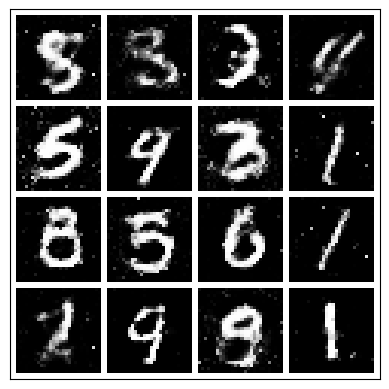

-------------------------------------
                Epoch 43:
                Step: 1000 |
                D_real Loss: 0.5454 |
                D_fake Loss: 0.6431 |
                D_total Loss: 1.1885 |
                G_Loss: 1.038 |
                Real_score 0.633 |
                Fake_score 0.432
            


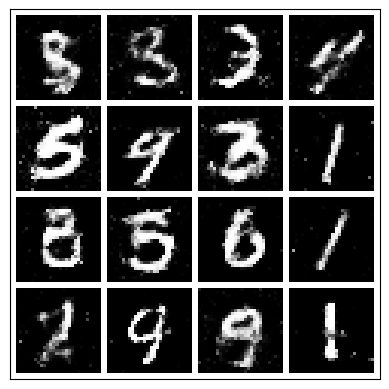

-------------------------------------
                Epoch 43:
                Step: 1500 |
                D_real Loss: 0.3433 |
                D_fake Loss: 0.7666 |
                D_total Loss: 1.1100 |
                G_Loss: 1.012 |
                Real_score 0.736 |
                Fake_score 0.467
            


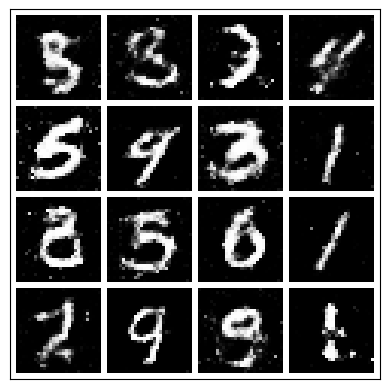

-------------------------------------
                Epoch 43:
                Step: 2000 |
                D_real Loss: 0.6945 |
                D_fake Loss: 0.3330 |
                D_total Loss: 1.0275 |
                G_Loss: 1.172 |
                Real_score 0.559 |
                Fake_score 0.277
            


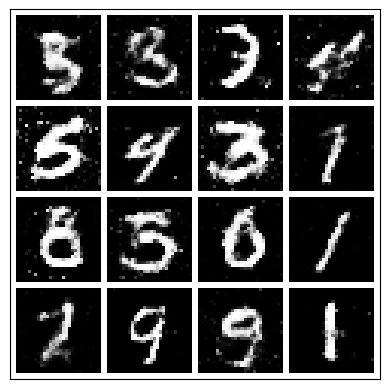

-------------------------------------
                Epoch 43:
                Step: 2500 |
                D_real Loss: 0.5996 |
                D_fake Loss: 0.4549 |
                D_total Loss: 1.0546 |
                G_Loss: 1.172 |
                Real_score 0.595 |
                Fake_score 0.347
            


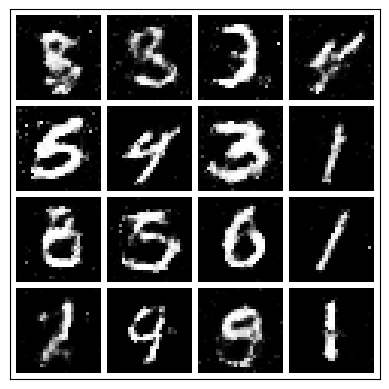

-------------------------------------
                Epoch 43:
                Step: 3000 |
                D_real Loss: 0.5696 |
                D_fake Loss: 0.4787 |
                D_total Loss: 1.0482 |
                G_Loss: 1.101 |
                Real_score 0.604 |
                Fake_score 0.354
            


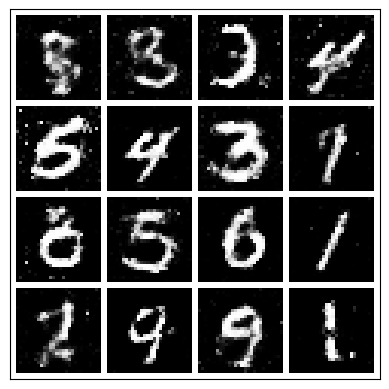

-------------------------------------
                Epoch 43:
                Step: 3500 |
                D_real Loss: 0.6045 |
                D_fake Loss: 0.8920 |
                D_total Loss: 1.4965 |
                G_Loss: 1.059 |
                Real_score 0.637 |
                Fake_score 0.536
            


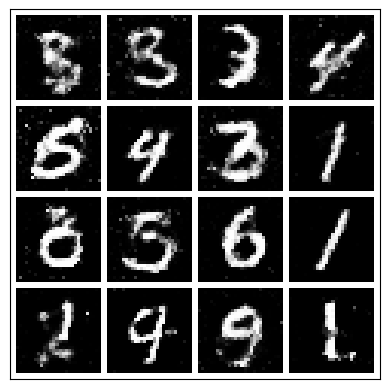

 86%|████████▌ | 43/50 [52:06<09:03, 77.58s/it]

-------------------------------------
                Epoch 44:
                Step: 0 |
                D_real Loss: 0.5977 |
                D_fake Loss: 0.9200 |
                D_total Loss: 1.5177 |
                G_Loss: 1.093 |
                Real_score 0.634 |
                Fake_score 0.508
            


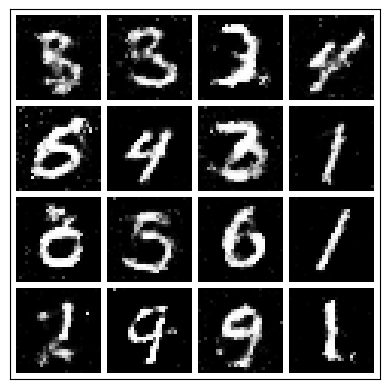

-------------------------------------
                Epoch 44:
                Step: 500 |
                D_real Loss: 0.6670 |
                D_fake Loss: 0.6503 |
                D_total Loss: 1.3173 |
                G_Loss: 0.920 |
                Real_score 0.580 |
                Fake_score 0.457
            


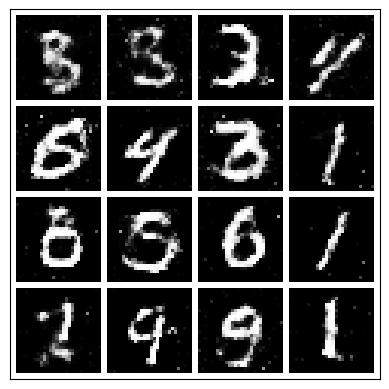

-------------------------------------
                Epoch 44:
                Step: 1000 |
                D_real Loss: 0.7574 |
                D_fake Loss: 0.4035 |
                D_total Loss: 1.1608 |
                G_Loss: 1.268 |
                Real_score 0.514 |
                Fake_score 0.323
            


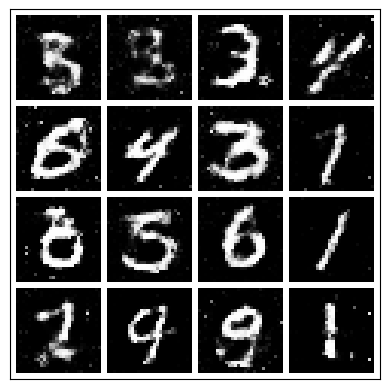

-------------------------------------
                Epoch 44:
                Step: 1500 |
                D_real Loss: 0.5609 |
                D_fake Loss: 0.7030 |
                D_total Loss: 1.2639 |
                G_Loss: 1.006 |
                Real_score 0.603 |
                Fake_score 0.455
            


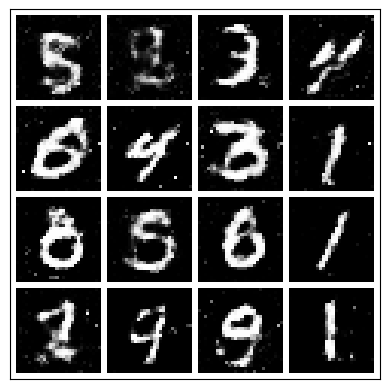

-------------------------------------
                Epoch 44:
                Step: 2000 |
                D_real Loss: 0.4798 |
                D_fake Loss: 0.4507 |
                D_total Loss: 0.9305 |
                G_Loss: 1.064 |
                Real_score 0.661 |
                Fake_score 0.343
            


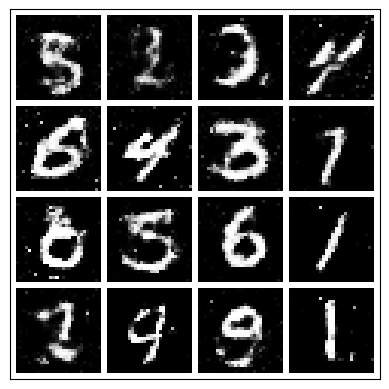

-------------------------------------
                Epoch 44:
                Step: 2500 |
                D_real Loss: 0.7123 |
                D_fake Loss: 0.3693 |
                D_total Loss: 1.0816 |
                G_Loss: 1.250 |
                Real_score 0.551 |
                Fake_score 0.291
            


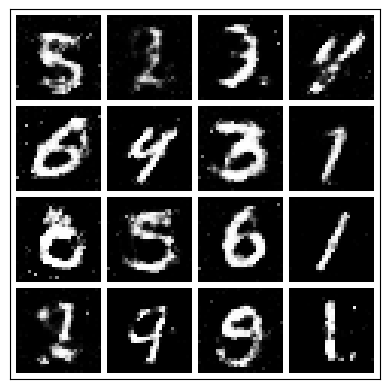

-------------------------------------
                Epoch 44:
                Step: 3000 |
                D_real Loss: 0.6881 |
                D_fake Loss: 0.6183 |
                D_total Loss: 1.3064 |
                G_Loss: 0.928 |
                Real_score 0.523 |
                Fake_score 0.431
            


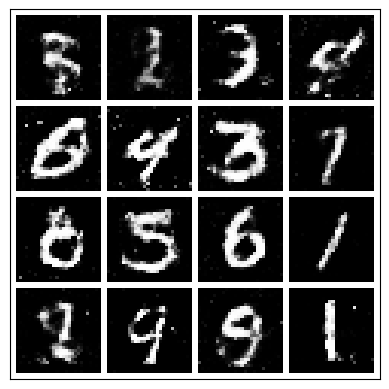

-------------------------------------
                Epoch 44:
                Step: 3500 |
                D_real Loss: 0.4777 |
                D_fake Loss: 0.4815 |
                D_total Loss: 0.9592 |
                G_Loss: 0.977 |
                Real_score 0.664 |
                Fake_score 0.365
            


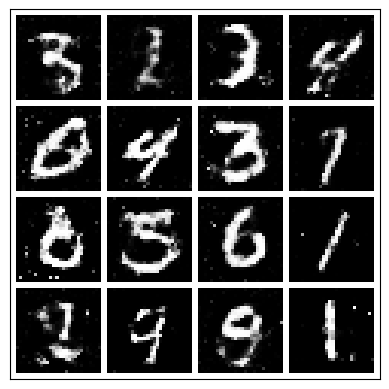

 88%|████████▊ | 44/50 [53:23<07:45, 77.52s/it]

-------------------------------------
                Epoch 45:
                Step: 0 |
                D_real Loss: 0.7779 |
                D_fake Loss: 0.6105 |
                D_total Loss: 1.3884 |
                G_Loss: 1.131 |
                Real_score 0.524 |
                Fake_score 0.415
            


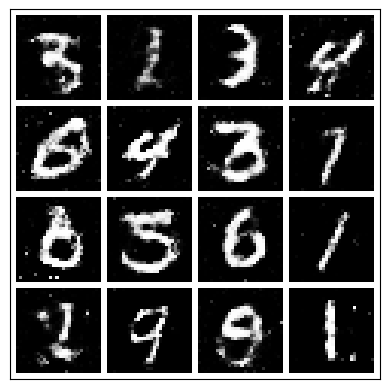

-------------------------------------
                Epoch 45:
                Step: 500 |
                D_real Loss: 0.5420 |
                D_fake Loss: 0.6529 |
                D_total Loss: 1.1949 |
                G_Loss: 0.884 |
                Real_score 0.604 |
                Fake_score 0.425
            


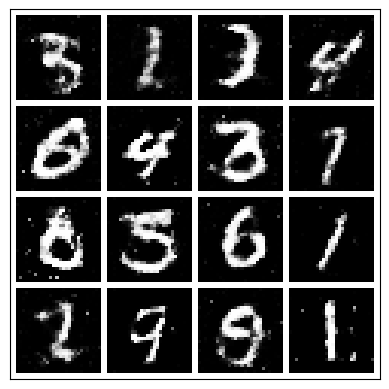

-------------------------------------
                Epoch 45:
                Step: 1000 |
                D_real Loss: 0.4655 |
                D_fake Loss: 0.7964 |
                D_total Loss: 1.2618 |
                G_Loss: 0.907 |
                Real_score 0.672 |
                Fake_score 0.508
            


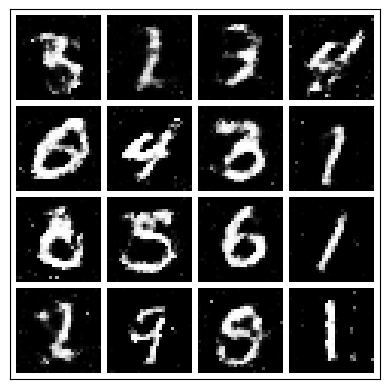

-------------------------------------
                Epoch 45:
                Step: 1500 |
                D_real Loss: 0.9950 |
                D_fake Loss: 0.6771 |
                D_total Loss: 1.6721 |
                G_Loss: 1.205 |
                Real_score 0.446 |
                Fake_score 0.466
            


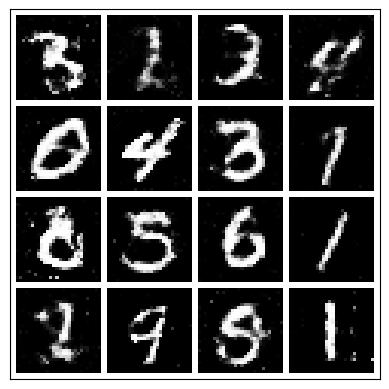

-------------------------------------
                Epoch 45:
                Step: 2000 |
                D_real Loss: 0.5067 |
                D_fake Loss: 0.5543 |
                D_total Loss: 1.0610 |
                G_Loss: 1.215 |
                Real_score 0.643 |
                Fake_score 0.398
            


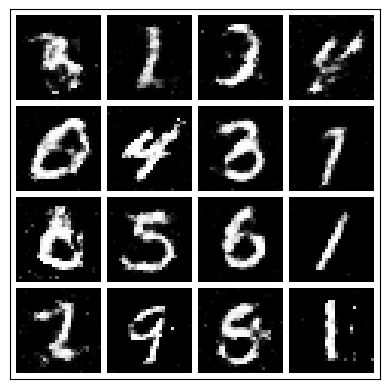

-------------------------------------
                Epoch 45:
                Step: 2500 |
                D_real Loss: 0.6651 |
                D_fake Loss: 0.3700 |
                D_total Loss: 1.0350 |
                G_Loss: 1.490 |
                Real_score 0.538 |
                Fake_score 0.296
            


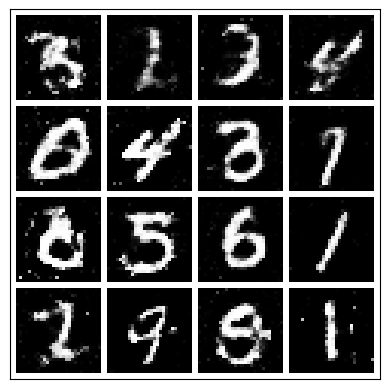

-------------------------------------
                Epoch 45:
                Step: 3000 |
                D_real Loss: 0.5802 |
                D_fake Loss: 0.4234 |
                D_total Loss: 1.0036 |
                G_Loss: 1.218 |
                Real_score 0.599 |
                Fake_score 0.336
            


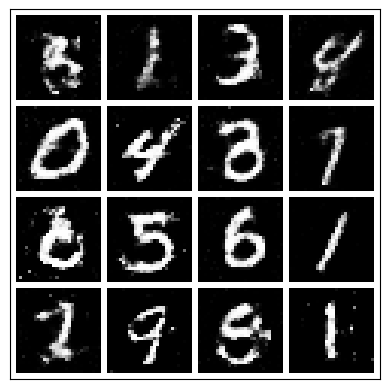

-------------------------------------
                Epoch 45:
                Step: 3500 |
                D_real Loss: 0.5794 |
                D_fake Loss: 0.5015 |
                D_total Loss: 1.0809 |
                G_Loss: 0.895 |
                Real_score 0.589 |
                Fake_score 0.354
            


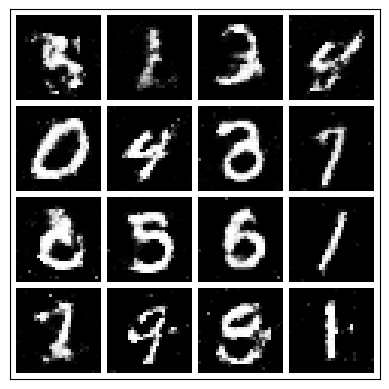

 90%|█████████ | 45/50 [54:41<06:28, 77.66s/it]

-------------------------------------
                Epoch 46:
                Step: 0 |
                D_real Loss: 0.3664 |
                D_fake Loss: 0.4657 |
                D_total Loss: 0.8321 |
                G_Loss: 1.309 |
                Real_score 0.760 |
                Fake_score 0.350
            


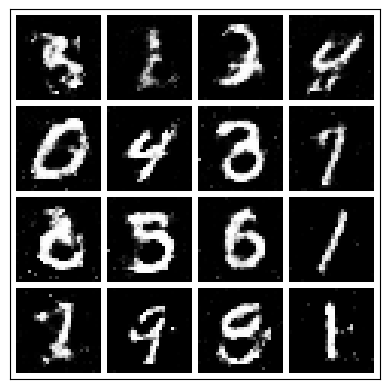

-------------------------------------
                Epoch 46:
                Step: 500 |
                D_real Loss: 0.6601 |
                D_fake Loss: 0.7635 |
                D_total Loss: 1.4236 |
                G_Loss: 1.212 |
                Real_score 0.564 |
                Fake_score 0.470
            


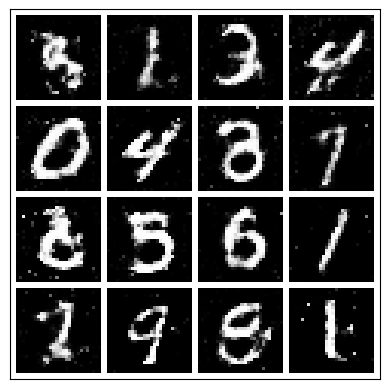

-------------------------------------
                Epoch 46:
                Step: 1000 |
                D_real Loss: 0.5298 |
                D_fake Loss: 0.6348 |
                D_total Loss: 1.1646 |
                G_Loss: 0.978 |
                Real_score 0.610 |
                Fake_score 0.421
            


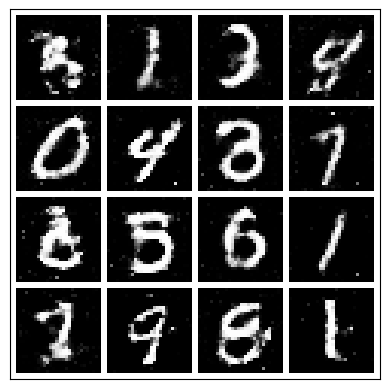

-------------------------------------
                Epoch 46:
                Step: 1500 |
                D_real Loss: 0.6092 |
                D_fake Loss: 0.4771 |
                D_total Loss: 1.0863 |
                G_Loss: 1.130 |
                Real_score 0.586 |
                Fake_score 0.360
            


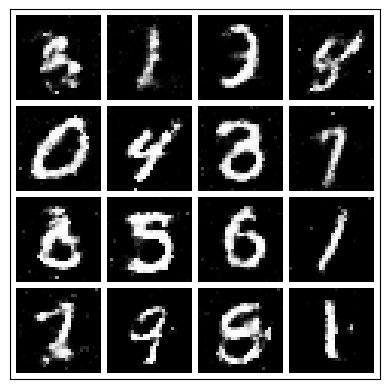

-------------------------------------
                Epoch 46:
                Step: 2000 |
                D_real Loss: 0.6921 |
                D_fake Loss: 0.4127 |
                D_total Loss: 1.1048 |
                G_Loss: 1.184 |
                Real_score 0.605 |
                Fake_score 0.316
            


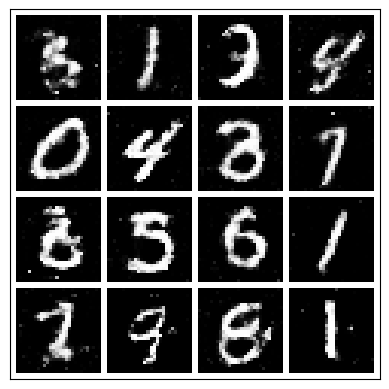

-------------------------------------
                Epoch 46:
                Step: 2500 |
                D_real Loss: 0.4781 |
                D_fake Loss: 0.5402 |
                D_total Loss: 1.0183 |
                G_Loss: 1.032 |
                Real_score 0.648 |
                Fake_score 0.402
            


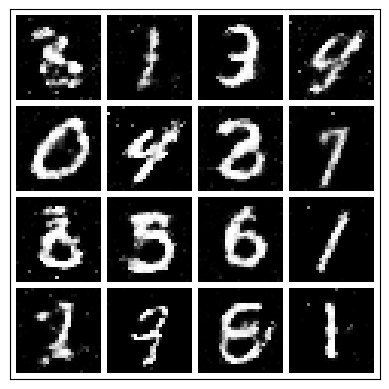

-------------------------------------
                Epoch 46:
                Step: 3000 |
                D_real Loss: 0.6075 |
                D_fake Loss: 0.4990 |
                D_total Loss: 1.1066 |
                G_Loss: 1.024 |
                Real_score 0.609 |
                Fake_score 0.376
            


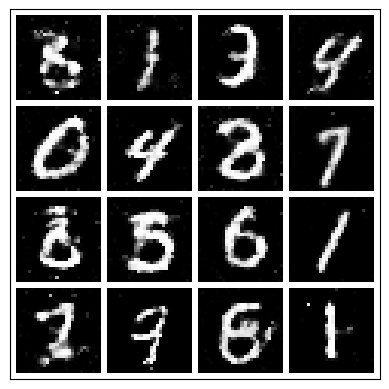

-------------------------------------
                Epoch 46:
                Step: 3500 |
                D_real Loss: 0.6130 |
                D_fake Loss: 0.9060 |
                D_total Loss: 1.5190 |
                G_Loss: 0.618 |
                Real_score 0.586 |
                Fake_score 0.494
            


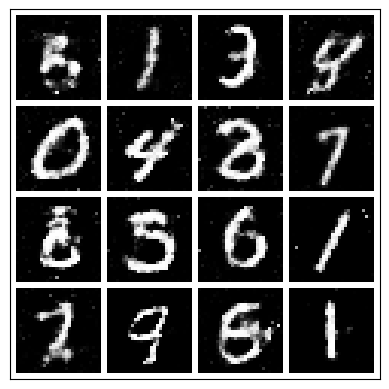

 92%|█████████▏| 46/50 [55:58<05:09, 77.49s/it]

-------------------------------------
                Epoch 47:
                Step: 0 |
                D_real Loss: 0.7800 |
                D_fake Loss: 0.3978 |
                D_total Loss: 1.1778 |
                G_Loss: 1.264 |
                Real_score 0.517 |
                Fake_score 0.314
            


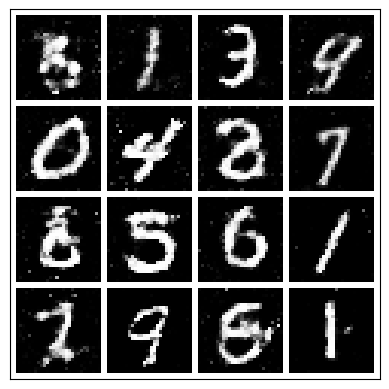

-------------------------------------
                Epoch 47:
                Step: 500 |
                D_real Loss: 0.7412 |
                D_fake Loss: 0.5159 |
                D_total Loss: 1.2571 |
                G_Loss: 0.922 |
                Real_score 0.528 |
                Fake_score 0.380
            


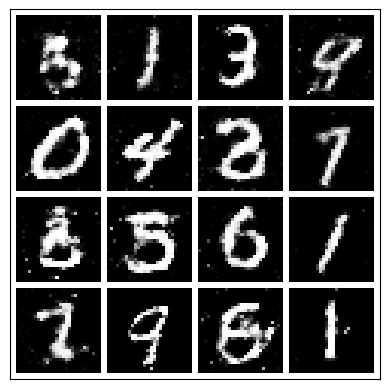

-------------------------------------
                Epoch 47:
                Step: 1000 |
                D_real Loss: 0.6263 |
                D_fake Loss: 0.6697 |
                D_total Loss: 1.2960 |
                G_Loss: 0.941 |
                Real_score 0.603 |
                Fake_score 0.461
            


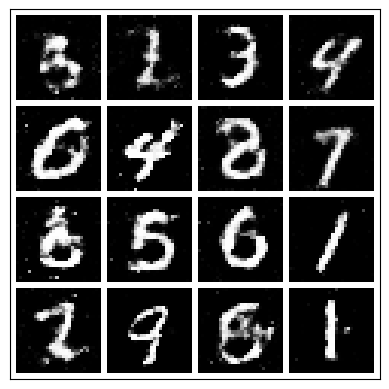

-------------------------------------
                Epoch 47:
                Step: 1500 |
                D_real Loss: 0.6234 |
                D_fake Loss: 0.6338 |
                D_total Loss: 1.2572 |
                G_Loss: 1.033 |
                Real_score 0.577 |
                Fake_score 0.438
            


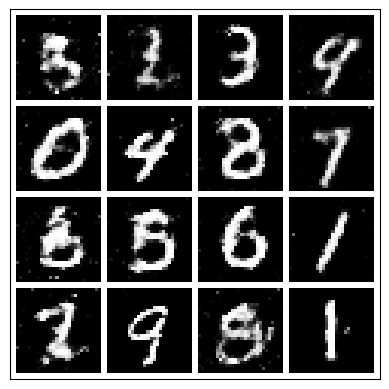

-------------------------------------
                Epoch 47:
                Step: 2000 |
                D_real Loss: 0.5269 |
                D_fake Loss: 0.4337 |
                D_total Loss: 0.9606 |
                G_Loss: 1.168 |
                Real_score 0.643 |
                Fake_score 0.342
            


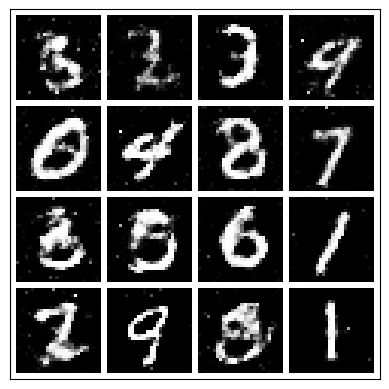

-------------------------------------
                Epoch 47:
                Step: 2500 |
                D_real Loss: 0.5078 |
                D_fake Loss: 0.3472 |
                D_total Loss: 0.8550 |
                G_Loss: 1.126 |
                Real_score 0.634 |
                Fake_score 0.283
            


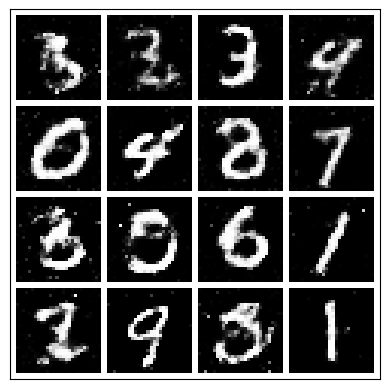

-------------------------------------
                Epoch 47:
                Step: 3000 |
                D_real Loss: 0.9191 |
                D_fake Loss: 0.5487 |
                D_total Loss: 1.4678 |
                G_Loss: 1.020 |
                Real_score 0.467 |
                Fake_score 0.408
            


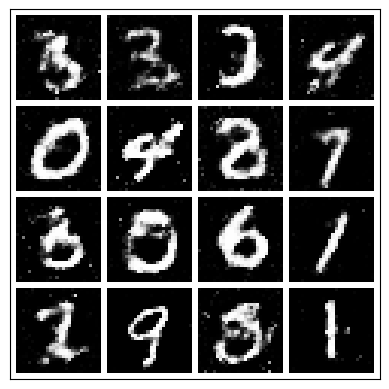

-------------------------------------
                Epoch 47:
                Step: 3500 |
                D_real Loss: 0.5833 |
                D_fake Loss: 0.7158 |
                D_total Loss: 1.2991 |
                G_Loss: 0.928 |
                Real_score 0.610 |
                Fake_score 0.467
            


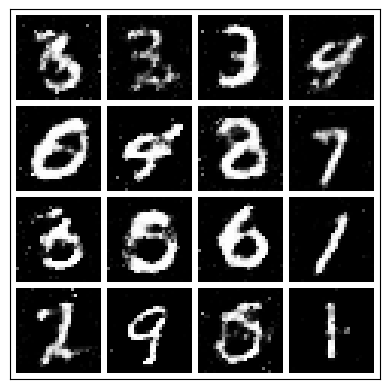

 94%|█████████▍| 47/50 [57:16<03:52, 77.64s/it]

-------------------------------------
                Epoch 48:
                Step: 0 |
                D_real Loss: 0.7403 |
                D_fake Loss: 0.5221 |
                D_total Loss: 1.2624 |
                G_Loss: 0.956 |
                Real_score 0.536 |
                Fake_score 0.395
            


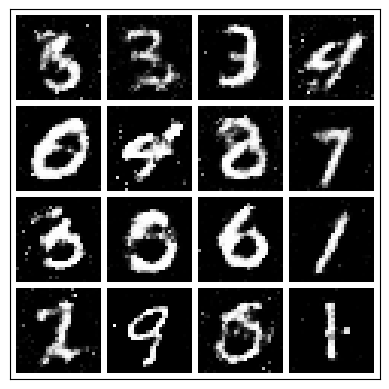

-------------------------------------
                Epoch 48:
                Step: 500 |
                D_real Loss: 0.5221 |
                D_fake Loss: 0.6703 |
                D_total Loss: 1.1925 |
                G_Loss: 0.888 |
                Real_score 0.637 |
                Fake_score 0.462
            


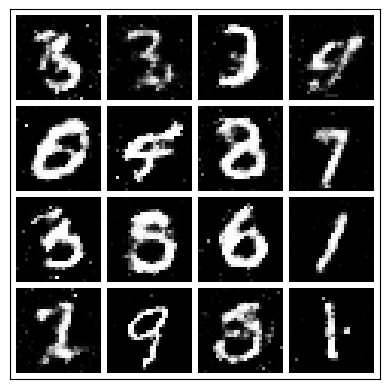

-------------------------------------
                Epoch 48:
                Step: 1000 |
                D_real Loss: 0.7054 |
                D_fake Loss: 0.3945 |
                D_total Loss: 1.0999 |
                G_Loss: 1.169 |
                Real_score 0.540 |
                Fake_score 0.315
            


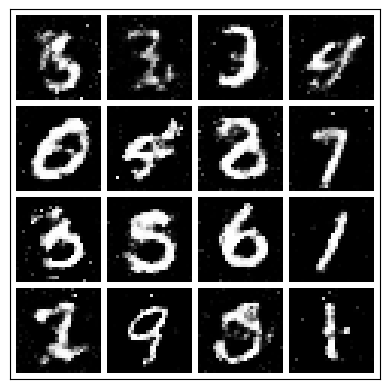

-------------------------------------
                Epoch 48:
                Step: 1500 |
                D_real Loss: 0.5658 |
                D_fake Loss: 0.6679 |
                D_total Loss: 1.2337 |
                G_Loss: 0.724 |
                Real_score 0.622 |
                Fake_score 0.443
            


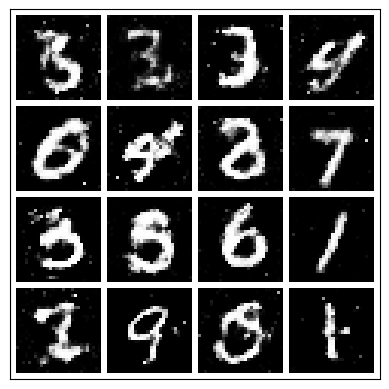

-------------------------------------
                Epoch 48:
                Step: 2000 |
                D_real Loss: 0.6127 |
                D_fake Loss: 0.4472 |
                D_total Loss: 1.0599 |
                G_Loss: 1.173 |
                Real_score 0.578 |
                Fake_score 0.348
            


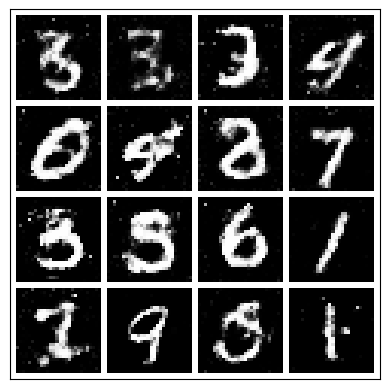

-------------------------------------
                Epoch 48:
                Step: 2500 |
                D_real Loss: 0.5313 |
                D_fake Loss: 0.5059 |
                D_total Loss: 1.0372 |
                G_Loss: 1.036 |
                Real_score 0.635 |
                Fake_score 0.378
            


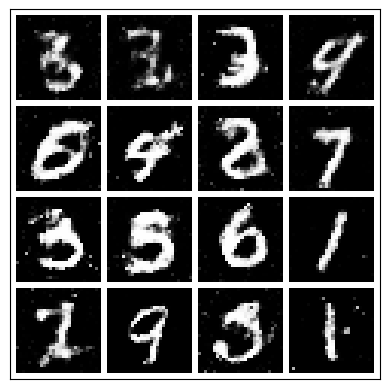

-------------------------------------
                Epoch 48:
                Step: 3000 |
                D_real Loss: 0.6693 |
                D_fake Loss: 0.6627 |
                D_total Loss: 1.3320 |
                G_Loss: 0.934 |
                Real_score 0.551 |
                Fake_score 0.435
            


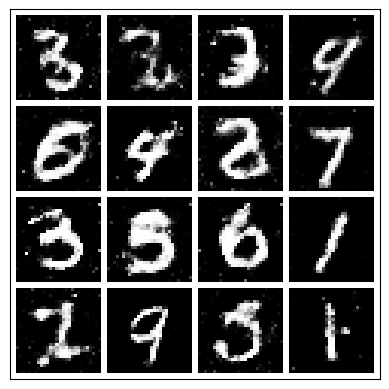

-------------------------------------
                Epoch 48:
                Step: 3500 |
                D_real Loss: 0.4671 |
                D_fake Loss: 0.4848 |
                D_total Loss: 0.9518 |
                G_Loss: 1.022 |
                Real_score 0.666 |
                Fake_score 0.359
            


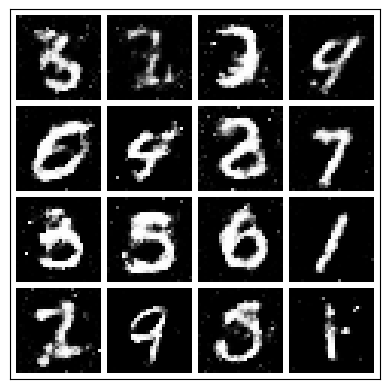

 96%|█████████▌| 48/50 [58:34<02:35, 77.58s/it]

-------------------------------------
                Epoch 49:
                Step: 0 |
                D_real Loss: 0.6102 |
                D_fake Loss: 0.6119 |
                D_total Loss: 1.2220 |
                G_Loss: 1.076 |
                Real_score 0.590 |
                Fake_score 0.421
            


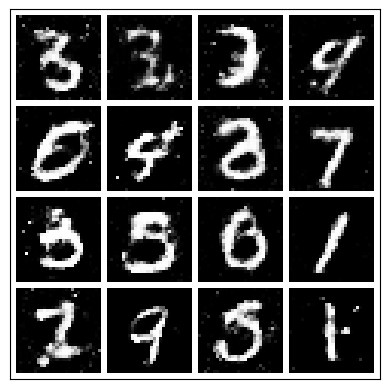

-------------------------------------
                Epoch 49:
                Step: 500 |
                D_real Loss: 0.5372 |
                D_fake Loss: 0.4749 |
                D_total Loss: 1.0120 |
                G_Loss: 1.081 |
                Real_score 0.611 |
                Fake_score 0.363
            


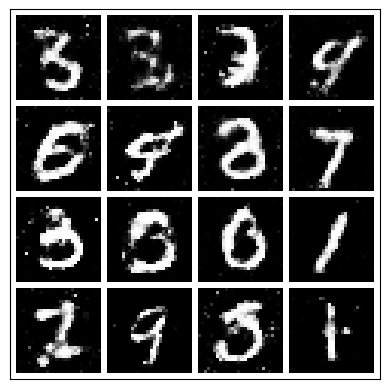

-------------------------------------
                Epoch 49:
                Step: 1000 |
                D_real Loss: 0.6833 |
                D_fake Loss: 0.5607 |
                D_total Loss: 1.2440 |
                G_Loss: 1.172 |
                Real_score 0.528 |
                Fake_score 0.400
            


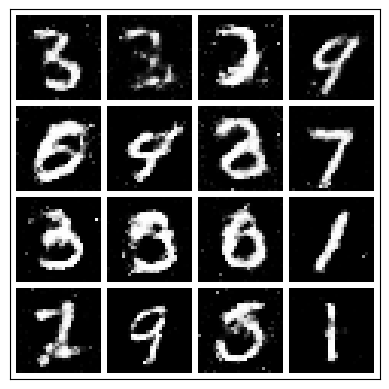

-------------------------------------
                Epoch 49:
                Step: 1500 |
                D_real Loss: 0.6483 |
                D_fake Loss: 0.6582 |
                D_total Loss: 1.3064 |
                G_Loss: 0.895 |
                Real_score 0.542 |
                Fake_score 0.443
            


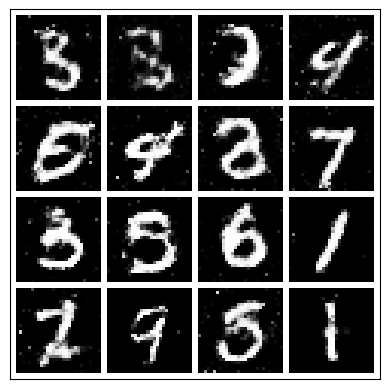

-------------------------------------
                Epoch 49:
                Step: 2000 |
                D_real Loss: 0.5034 |
                D_fake Loss: 0.8222 |
                D_total Loss: 1.3256 |
                G_Loss: 1.069 |
                Real_score 0.636 |
                Fake_score 0.521
            


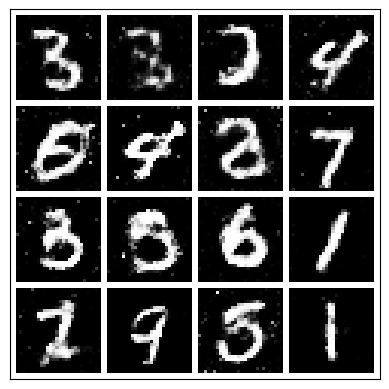

-------------------------------------
                Epoch 49:
                Step: 2500 |
                D_real Loss: 0.6647 |
                D_fake Loss: 0.5593 |
                D_total Loss: 1.2240 |
                G_Loss: 0.942 |
                Real_score 0.549 |
                Fake_score 0.406
            


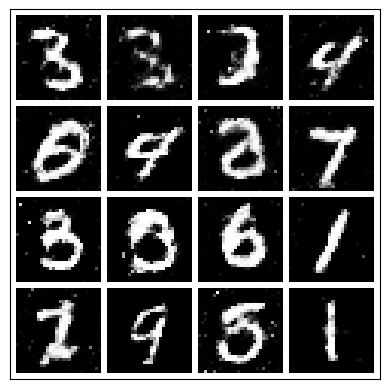

-------------------------------------
                Epoch 49:
                Step: 3000 |
                D_real Loss: 0.5706 |
                D_fake Loss: 0.9378 |
                D_total Loss: 1.5084 |
                G_Loss: 0.798 |
                Real_score 0.614 |
                Fake_score 0.484
            


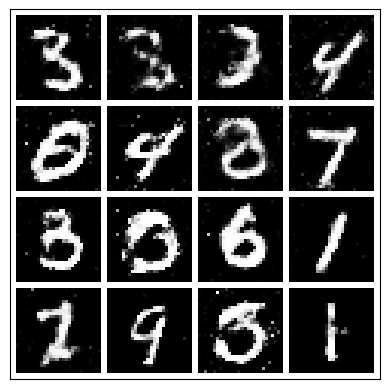

-------------------------------------
                Epoch 49:
                Step: 3500 |
                D_real Loss: 0.6502 |
                D_fake Loss: 0.5971 |
                D_total Loss: 1.2473 |
                G_Loss: 0.898 |
                Real_score 0.562 |
                Fake_score 0.437
            


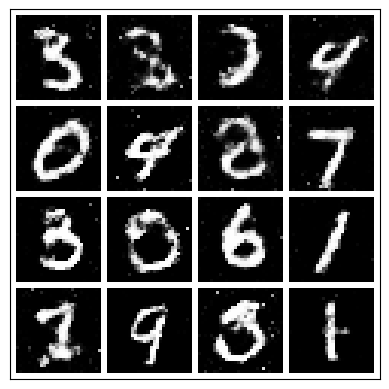

 98%|█████████▊| 49/50 [59:51<01:17, 77.42s/it]

-------------------------------------
                Epoch 50:
                Step: 0 |
                D_real Loss: 0.7737 |
                D_fake Loss: 0.5201 |
                D_total Loss: 1.2938 |
                G_Loss: 0.944 |
                Real_score 0.502 |
                Fake_score 0.382
            


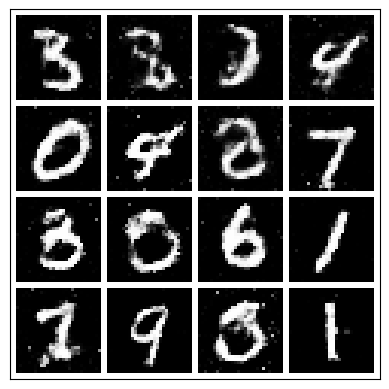

-------------------------------------
                Epoch 50:
                Step: 500 |
                D_real Loss: 0.2982 |
                D_fake Loss: 0.6665 |
                D_total Loss: 0.9647 |
                G_Loss: 0.905 |
                Real_score 0.766 |
                Fake_score 0.433
            


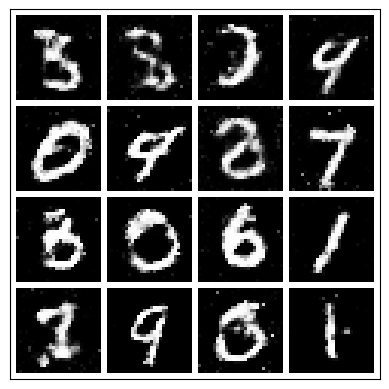

-------------------------------------
                Epoch 50:
                Step: 1000 |
                D_real Loss: 0.5564 |
                D_fake Loss: 0.4708 |
                D_total Loss: 1.0273 |
                G_Loss: 1.052 |
                Real_score 0.610 |
                Fake_score 0.357
            


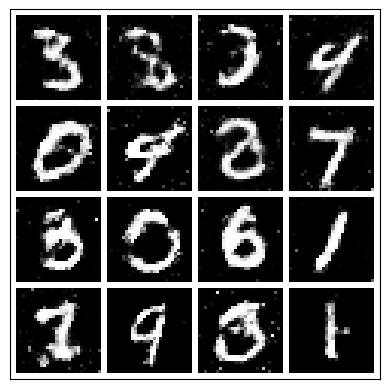

-------------------------------------
                Epoch 50:
                Step: 1500 |
                D_real Loss: 0.5240 |
                D_fake Loss: 0.5161 |
                D_total Loss: 1.0401 |
                G_Loss: 0.955 |
                Real_score 0.637 |
                Fake_score 0.350
            


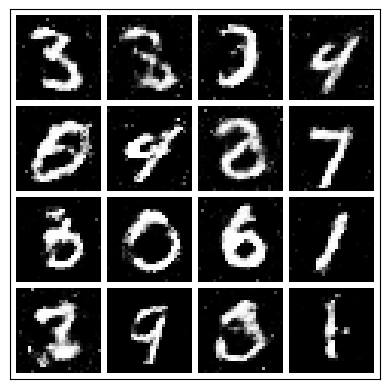

-------------------------------------
                Epoch 50:
                Step: 2000 |
                D_real Loss: 0.5587 |
                D_fake Loss: 0.7713 |
                D_total Loss: 1.3300 |
                G_Loss: 0.748 |
                Real_score 0.630 |
                Fake_score 0.481
            


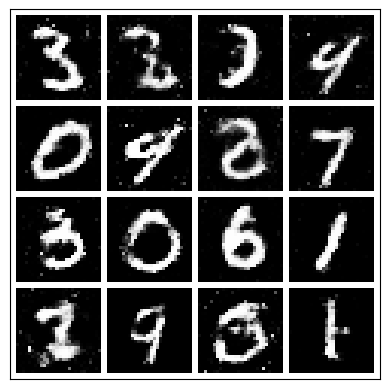

-------------------------------------
                Epoch 50:
                Step: 2500 |
                D_real Loss: 0.4658 |
                D_fake Loss: 0.7067 |
                D_total Loss: 1.1725 |
                G_Loss: 0.922 |
                Real_score 0.655 |
                Fake_score 0.461
            


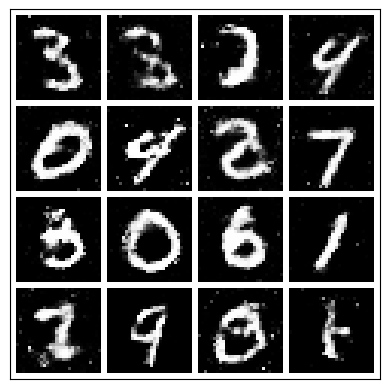

-------------------------------------
                Epoch 50:
                Step: 3000 |
                D_real Loss: 0.7576 |
                D_fake Loss: 0.6738 |
                D_total Loss: 1.4314 |
                G_Loss: 1.022 |
                Real_score 0.506 |
                Fake_score 0.440
            


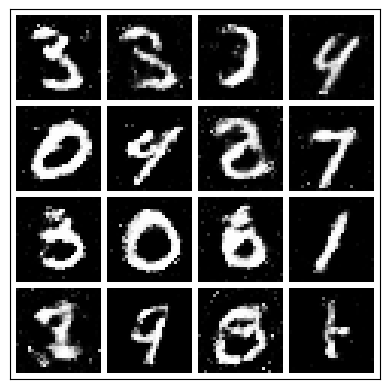

-------------------------------------
                Epoch 50:
                Step: 3500 |
                D_real Loss: 0.7819 |
                D_fake Loss: 0.4825 |
                D_total Loss: 1.2644 |
                G_Loss: 1.244 |
                Real_score 0.501 |
                Fake_score 0.371
            


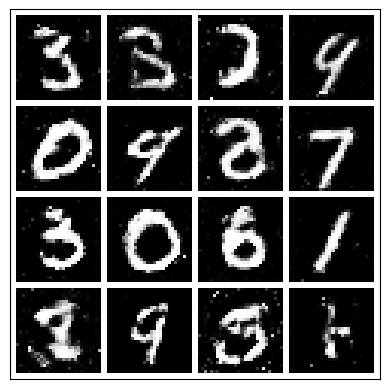

-------------------------------------
                Epoch 50:
                Step: 3749 |
                D_real Loss: 0.5960 |
                D_fake Loss: 0.6682 |
                D_total Loss: 1.2642 |
                G_Loss: 0.955 |
                Real_score 0.619 |
                Fake_score 0.464
            


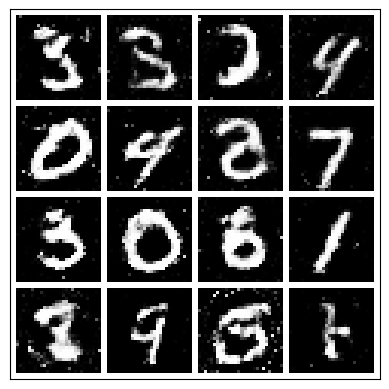

100%|██████████| 50/50 [1:01:08<00:00, 73.37s/it]


In [ ]:
losses_G = []
losses_D = []

real_score_list = []
fake_score_list = []

num_epochs = 50

generator.train()
discriminator.train()

for epoch in tqdm(range(num_epochs)):

    # For each batch in the dataloader
    for i, (data, _) in enumerate(mnist_dataloader, 0): # not interested in the labels you only want data ,_ (ignores the set item)

        ##################################################
        # Get output from discriminator and compute losses
        ##################################################

        discriminator.zero_grad() # zero out the gradients for the current batch

        # Format batch
        real_images = data.reshape(batch_size, 1, 784)

        # Feed real images through discriminator
        output = discriminator(real_images).view(-1) #flatten out the output to get a single vector of probability scores (view(-1))

        # Calculate loss on real images by comparing with real labels
        real_loss_D = criterion(output, real_image_labels)

        # Compute discriminator gradients
        real_loss_D.backward()

        real_score_D = output.mean().item() #average score of the discriminator on real images
        # when the discriminator is performing the well the score will be close to 1

        # Generate fake image batch with generator
        noise = torch.randn(batch_size, latent_noise_size)

        fake_images = generator(noise)

        output = discriminator(fake_images.detach()).view(-1)

        # Calculate loss on fake images by comparing with fake labels
        fake_loss_D = criterion(output, fake_image_labels)

        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        fake_loss_D.backward()

        fake_score_D = output.mean().item()

        # Compute error of discriminator as sum over the fake and the real batches
        total_loss_D = real_loss_D + fake_loss_D

        # Update discriminator parameters
        optimizer_D.step() # update the model paramaters of the discrimnator

        ##################################################
        # Get output from generator and compute losses
        ##################################################

        generator.zero_grad()

        # Feed fake images through discriminator with newly updated weights
        output = discriminator(fake_images).view(-1)

        # Calculate generator's loss based on this output
        loss_G = criterion(output, real_image_labels)

        # Calculate gradients for generator
        loss_G.backward()

        # Update generator parameters
        optimizer_G.step()

        if (i % 500 == 0) or ((epoch == num_epochs - 1) and (i == len(mnist_dataloader) - 1)):
            print(f"""-------------------------------------
                Epoch {epoch + 1}:
                Step: {i} |
                D_real Loss: {real_loss_D:.4f} |
                D_fake Loss: {fake_loss_D:.4f} |
                D_total Loss: {total_loss_D:.4f} |
                G_Loss: {loss_G:.3f} |
                Real_score {real_score_D:.3f} |
                Fake_score {fake_score_D:.3f}
            """)

            with torch.no_grad():
                generated_images = generator(fixed_noise).reshape(batch_size, 1, 28, 28).detach().cpu()
                display(make_grid(generated_images, nrow = 4, pad_value = 1.0))

        losses_G.append(loss_G.item())
        losses_D.append(total_loss_D.item())

        real_score_list.append(real_score_D)
        fake_score_list.append(fake_score_D)

 First, we will see how D and G’s losses changed during training.Discriminator loss is increasing and Generator loss is decreasing Real score and Fake score are converging to 0.5

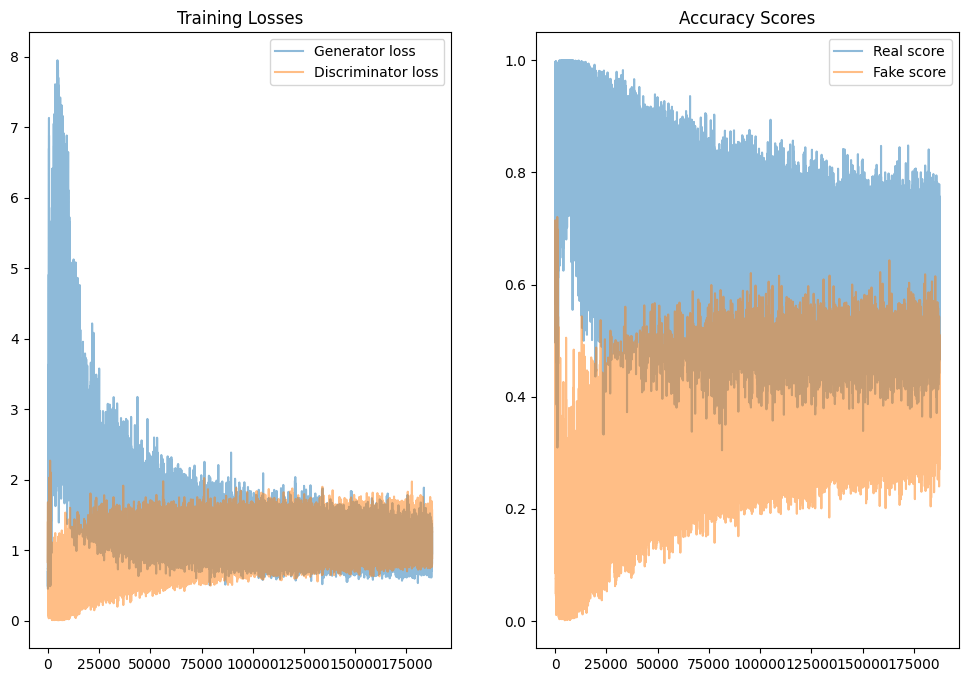

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (12, 8))

ax1.plot(losses_G, label = 'Generator loss', alpha = 0.5)
ax1.plot(losses_D, label = 'Discriminator loss', alpha = 0.5)
ax1.legend()

ax1.set_title('Training Losses')
ax2.plot(real_score_list, label = 'Real score', alpha = 0.5)
ax2.plot(fake_score_list, label = 'Fake score', alpha = 0.5)
ax2.set_title('Accuracy Scores')

ax2.legend()